# Heart Disease Prediction
### Neural Network Model Definition and Training

## Data
**The dataset used in this project is the Cleveland Heart Disease dataset available from the UCI repository and Kaggle**
### Dataset Features

* **age:** The person’s age in years (Numeric)
* **sex:** Gender of patient (1 = male, 0 = female) (Nominal)
* **cp:** chest pain type — Value 0: asymptomatic — Value 1: atypical angina — Value 2: non-anginal pain — Value 3: typical angina (Nominal)
* **trestbps:** The person’s resting blood pressure (mm Hg on admission to the hospital) (Numeric)
* **chol:** The person’s cholesterol measurement in mg/dl (Numeric)
* **fbs:** The person’s fasting blood sugar (> 120 mg/dl, 1 = true; 0 = false) (Nominal)
* **restecg:** resting electrocardiographic results — Value 0: showing probable or definite left ventricular hypertrophy by Estes’ criteria — Value 1: normal — Value 2: having ST-T wave abnormality (T wave inversions and/or ST elevation or depression of > 0.05 mV) (Nominal)
* **thalach:** The person’s maximum heart rate achieved (Numeric)
* **exang:** Exercise induced angina (1 = yes; 0 = no) (Nominal)
* **oldpeak:** ST depression induced by exercise relative to rest (‘ST’ relates to positions on the ECG plot. See more here) (Numeric)
* **slope:** the slope of the peak exercise ST segment — 0: downsloping; 1: flat; 2: upsloping 0: downsloping; 1: flat; 2: upsloping (Nominal)
* **ca:** The number of major vessels (0–3) (Numeric)
* **thal:** A blood disorder called thalassemia Value 0: NULL (dropped from the dataset previously. Value 1: fixed defect (no blood flow in some part of the heart) Value 2: normal blood flow. Value 3: reversible defect (a blood flow is observed but it is not normal) (Nominal)
* **target:** Heart disease (0 = no, 1 = yes)

### Imports

In [2]:
from numpy.random import seed
seed(42)
import pandas as pd
import numpy as np
import os
import shutil
from collections import Counter
import imblearn
from imblearn.over_sampling import SMOTE
import graphviz
import joblib
import pickle
import glob
import seaborn as sns
sns.set_style('darkgrid')
import warnings
warnings.filterwarnings("ignore")
from matplotlib import pyplot
import matplotlib.pyplot as plt
from matplotlib import rcParams
from statsmodels.stats.proportion import proportion_confint
from math import sqrt
%matplotlib inline
import plotly.express as px
from platform import python_version

import sklearn
import scikitplot as skplt
import sklearn.feature_selection
from sklearn.feature_selection import VarianceThreshold
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import label_binarize,OneHotEncoder
from sklearn.feature_selection import VarianceThreshold
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.model_selection import learning_curve
from sklearn.metrics import accuracy_score
from sklearn.metrics import matthews_corrcoef
from sklearn.metrics import f1_score
from sklearn.metrics import precision_recall_curve
from sktools import GradientBoostingFeatureGenerator
from sklearn.neural_network import MLPClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingClassifier
from sklearn.model_selection import train_test_split
from sklearn.metrics import auc, roc_curve, roc_auc_score
from sklearn.metrics import jaccard_score
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.preprocessing import StandardScaler,MinMaxScaler,RobustScaler
from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

import tensorflow as tf
tf.random.set_seed(42)
from tensorflow import keras
from tensorflow.keras import regularizers
from tensorflow.keras.models import Model
from tensorflow.keras import models
from tensorflow.keras.layers import Input
from tensorflow.keras.layers import Dense, Dropout, Flatten
from tensorflow.keras import regularizers
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.utils import Sequence
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import RMSprop, Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, ModelCheckpoint
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import BatchNormalization
from tensorflow.keras.layers import Activation
from tensorflow.keras import backend as K
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.wrappers.scikit_learn import KerasClassifier




print('imb_learn version', imblearn.__version__)
print('Python Version:',python_version())
print('tensorflow version',tf.__version__)
print('keras version',keras.__version__)

imb_learn version 0.8.1
Python Version: 3.8.8
tensorflow version 2.3.0
keras version 2.4.0


### Data

In [3]:
data=pd.read_csv('./Desktop/Hrt_Dis_Pred/heart.csv')
print('Shape',data.shape)
data

Shape (303, 14)


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal,target
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2,1
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2,1
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2,1
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,0,140,241,0,1,123,1,0.2,1,0,3,0
299,45,1,3,110,264,0,1,132,0,1.2,1,0,3,0
300,68,1,0,144,193,1,1,141,0,3.4,1,2,3,0
301,57,1,0,130,131,0,1,115,1,1.2,1,1,3,0


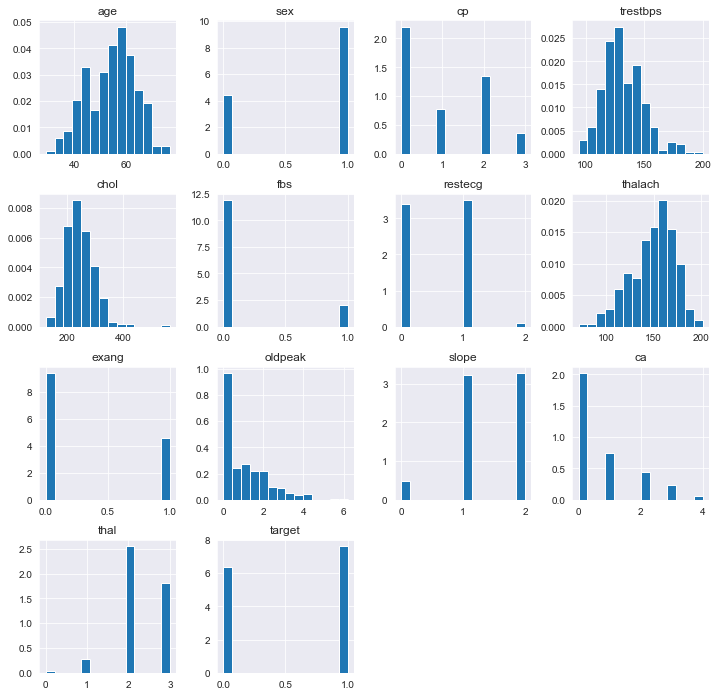

In [3]:
# A General overview of the dataset

data.hist(bins=14, figsize=(12,12),density=True)
plt.show()

### Unique Values

In [4]:
# Distinct values dictionary to map column names to unique values
# This can help with encoding downstream. For example, no need to one-hot encode binary nominal features 

{column: len(data[column].unique())for column in data.columns}

{'age': 41,
 'sex': 2,
 'cp': 4,
 'trestbps': 49,
 'chol': 152,
 'fbs': 2,
 'restecg': 3,
 'thalach': 91,
 'exang': 2,
 'oldpeak': 40,
 'slope': 3,
 'ca': 5,
 'thal': 4,
 'target': 2}

# Feature selection

### Split dataset

In [4]:
 # Split df into X and y
y = data['target'].copy()
X = data.drop('target', axis=1).copy()

In [5]:
columns = X.columns
print('X shape',X.shape)


X shape (303, 13)


In [6]:
y

0      1
1      1
2      1
3      1
4      1
      ..
298    0
299    0
300    0
301    0
302    0
Name: target, Length: 303, dtype: int64

### Univariate Selection

The following example uses the chi-squared (chi2) statistical test for non-negative features to select the best features from the Dataset.

In [7]:
# Variable selection

data = data.copy()
X = data.iloc[:,0:13]  # columns
y = data.iloc[:,-1]    # target

# SelectKBest class to extract top best features
bestfeatures = SelectKBest(score_func = chi2, k = 10)
fit = bestfeatures.fit(X,y)
dfscores = pd.DataFrame(fit.scores_)
dfcolumns = pd.DataFrame(X.columns)

# Concat dataframes 
featureScores = pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns = ['Features','Score'] 
print(featureScores.nlargest(13,'Score')) 

    Features       Score
7    thalach  188.320472
9    oldpeak   72.644253
11        ca   66.440765
2         cp   62.598098
8      exang   38.914377
4       chol   23.936394
0        age   23.286624
3   trestbps   14.823925
10     slope    9.804095
1        sex    7.576835
12      thal    5.791853
6    restecg    2.978271
5        fbs    0.202934


### Tree based importances

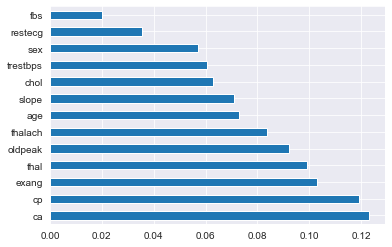

In [8]:
# Extra trees classifier of feature importances

model = ExtraTreesClassifier()
model.fit(X,y)
#print(model.feature_importances_)


feat_importances = pd.Series(model.feature_importances_, index=X.columns)
feat_importances.nlargest(13).plot(kind='barh')
plt.show()

## Low varience filtering

Varience

age           82.484558
sex            0.217166
cp             1.065132
trestbps     307.586453
chol        2686.426748
fbs            0.126877
restecg        0.276528
thalach      524.646406
exang          0.220707
oldpeak        1.348095
slope          0.379735
ca             1.045724
thal           0.374883
dtype: float64



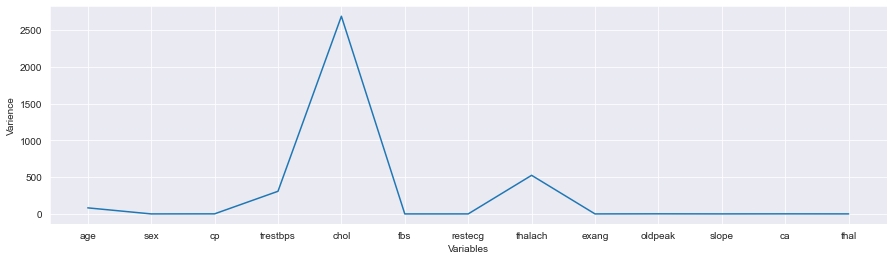

In [9]:
# Dataset variences

variance = X.var()

print('Varience')
print()
print(X.var())

print()

plt.figure(figsize= (15,4))
plt.xlabel('Variables')
plt.ylabel('Varience')
plt.plot(variance)

###  Variables with variance more than the threshold value

In [10]:
# Save variables having variance more than the threshold value
# In this case all original variable are retained

variable = [ ]

for i in range(0,len(variance)):
    if variance[i]>=0.006: #setting the threshold
        variable.append(columns[i])
        
variable

['age',
 'sex',
 'cp',
 'trestbps',
 'chol',
 'fbs',
 'restecg',
 'thalach',
 'exang',
 'oldpeak',
 'slope',
 'ca',
 'thal']

### New dataframe using the above variables

In [11]:
# creating a new dataframe using the above variables

new_data = X[variable]
print('new_data shape',new_data.shape)
new_data.head()

new_data shape (303, 13)


,age,sex,cp,trestbps,chol,fbs,restecg,thalach,exang,oldpeak,slope,ca,thal
0,63,1,3,145,233,1,0,150,0,2.3,0,0,1
1,37,1,2,130,250,0,1,187,0,3.5,0,0,2
2,41,0,1,130,204,0,0,172,0,1.4,2,0,2
3,56,1,1,120,236,0,1,178,0,0.8,2,0,2
4,57,0,0,120,354,0,1,163,1,0.6,2,0,2


age           82.484558
sex            0.217166
cp             1.065132
trestbps     307.586453
chol        2686.426748
fbs            0.126877
restecg        0.276528
thalach      524.646406
exang          0.220707
oldpeak        1.348095
slope          0.379735
ca             1.045724
thal           0.374883
dtype: float64



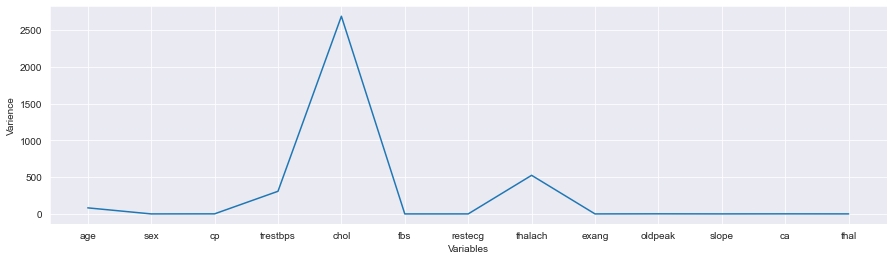

In [12]:
# Data variences

new_data_var = new_data.var()
print(new_data_var)

print()

plt.figure(figsize= (15,4))
plt.xlabel('Variables')
plt.ylabel('Varience')
plt.plot(new_data_var)

No change from original dataset with selected threshold

## Variable Encoding

In [13]:
# One Hot Encoding
# Used for smaller dataset

def onehot_encode(X, column_dict):
    X = new_data.copy()
    for column, prefix in column_dict.items():
        dummies = pd.get_dummies(X[column], prefix=prefix)
        X = pd.concat([X, dummies], axis=1)
        X = X.drop(column, axis=1)
        
    return X


# Encoding

def preprocess_inputs(X): #, scaler
    X = new_data.copy()
    
    # One-hot encode the nominal features
    
    nominal_features = ['cp', 'slope', 'thal','restecg']
    X = onehot_encode(X, dict(zip(nominal_features, ['CP', 'SL', 'TH','RECG'])))
    
       
    return X

In [14]:
# Check Encoded feature 

X = preprocess_inputs(new_data)
print(X.shape)
X

(303, 23)


,age,sex,trestbps,chol,fbs,thalach,exang,oldpeak,ca,CP_0,...,SL_0,SL_1,SL_2,TH_0,TH_1,TH_2,TH_3,RECG_0,RECG_1,RECG_2
0,63,1,145,233,1,150,0,2.3,0,0,...,1,0,0,0,1,0,0,1,0,0
1,37,1,130,250,0,187,0,3.5,0,0,...,1,0,0,0,0,1,0,0,1,0
2,41,0,130,204,0,172,0,1.4,0,0,...,0,0,1,0,0,1,0,1,0,0
3,56,1,120,236,0,178,0,0.8,0,0,...,0,0,1,0,0,1,0,0,1,0
4,57,0,120,354,0,163,1,0.6,0,1,...,0,0,1,0,0,1,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
298,57,0,140,241,0,123,1,0.2,0,1,...,0,1,0,0,0,0,1,0,1,0
299,45,1,110,264,0,132,0,1.2,0,0,...,0,1,0,0,0,0,1,0,1,0
300,68,1,144,193,1,141,0,3.4,2,1,...,0,1,0,0,0,0,1,0,1,0
301,57,1,130,131,0,115,1,1.2,1,1,...,0,1,0,0,0,0,1,0,1,0


In [15]:
y.shape

(303,)

### Class distributions

In [16]:
#Class distributions

# label encode the target variable
y = LabelEncoder().fit_transform(y)

# summarize distribution
counter = Counter(y)
for k,v in counter.items():
    per = v / len(y) * 100
    print('Class=%d, n=%d (%.3f%%)' % (k, v, per))

Class=1, n=165 (54.455%)
Class=0, n=138 (45.545%)


### Synthetic Minority Oversampling Technique
Optional: classes are fairly well distributed

# Neural Network Definition and Training

In [17]:
# For class label mapping

class_label = {
    0: 'No Heart Disease',
    1: 'Heart Disease'
}

### Train Test Split

In [18]:
# Using 80% for training and 20% for testing

X_train,X_test,y_train,y_test = train_test_split(X,y,train_size=0.8,random_state=42)

print('X_train shape:',X_train.shape)
print('X_test shape:',X_test.shape)
print('y_test shape:',y_test.shape)
print('y_train shape:',y_train.shape)
print()

n_cols=X_train.shape[1]
print('Columns ',n_cols)

X_train shape: (242, 23)
X_test shape: (61, 23)
y_test shape: (61,)
y_train shape: (242,)

Columns  23


### Scaling

In [19]:
# Scaling options: StandardScaler, MinMaxScaler, RobustScaler

#scaler = StandardScaler()
scaler = MinMaxScaler()
#scaler = RobustScaler()



# Fit on training set only.
scaler.fit(X_train)

# Apply transform to both the training set and the test set.
X_train = scaler.transform(X_train)
X_test = scaler.transform(X_test)

In [20]:
X_train = np.asarray(X_train,dtype=np.float32)
y_train = np.asarray(y_train,dtype=np.float32)
X_test = np.asarray(X_test,dtype=np.float32)
y_test = np.asarray(y_test,dtype=np.float32)

### Baseline Model Definition

In [75]:
# Code to delete a directory if used previously

#import shutil

shutil.rmtree('model.weights.bestAcc.hd5', ignore_errors=True)
shutil.rmtree('model.weights.bestLoss.hdf5', ignore_errors=True)

In [76]:
# Baseline NN 

# Test on Batch Gradient Descent: batch_size=len(X_trian)
# Stochastic Gradient Descent: batch_size=1
# Test mini-batch use batch_size = 256 


batch_size = 256 
num_classes = 2 
epochs = 500
es = EarlyStopping(monitor='val_loss', mode='auto', patience=20,restore_best_weights=True,
 verbose=1)
cpt = ModelCheckpoint(filepath= 'model.weights.bestLoss.hdf5',monitor='val_loss',
                      verbose=1,save_best_only=True,mode='min')
cpt2 = ModelCheckpoint(filepath= 'model.weights.bestAcc.hdf5',monitor='val_accuracy',
                      verbose=1,save_best_only=True,mode='max')

lr_red = ReduceLROnPlateau(monitor='val_loss', factor=0.01, patience=100)

#lr_schedule = keras.optimizers.schedules.ExponentialDecay(
#    initial_learning_rate=1e-2,
#    decay_steps=10000,
#    decay_rate=0.9)
#optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)

def create_baseline():
    # Create model
    model = Sequential()
    model.add(Dense(72, input_dim=(n_cols), activation='relu'))
    model.add(Dense(2, activation='softmax'))#sigmoid
    
    
    # Compile model
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])#binary_crossentropy    
    return model

model = create_baseline()
model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 72)                1728      
_________________________________________________________________
dense_7 (Dense)              (None, 2)                 146       
Total params: 1,874
Trainable params: 1,874
Non-trainable params: 0
_________________________________________________________________


In [171]:
# evaluate model with standardized dataset
estimator = KerasClassifier(build_fn=create_baseline, 
                            epochs=epochs, batch_size=batch_size, 
                            verbose=1)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

results = cross_val_score(estimator, X_train, y_train, cv=kfold, n_jobs=-1)

In [172]:
print("Baseline Model: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Baseline Model: 82.28% (5.97%)


### Model fitting

In [77]:
# Fit model

history = model.fit(X_train,
                    y_train,
                    epochs=epochs,
                    batch_size=batch_size,
                    callbacks=[cpt,cpt2,lr_red],#[es]cpt,cpt2,
                    verbose=2,
                    validation_split=0.2 ) 

Epoch 1/500

Epoch 00001: val_loss improved from inf to 0.71546, saving model to model.weights.bestLoss.hdf5

Epoch 00001: val_accuracy improved from -inf to 0.51020, saving model to model.weights.bestAcc.hdf5
1/1 - 0s - loss: 0.7192 - accuracy: 0.4456 - val_loss: 0.7155 - val_accuracy: 0.5102
Epoch 2/500

Epoch 00002: val_loss improved from 0.71546 to 0.70311, saving model to model.weights.bestLoss.hdf5

Epoch 00002: val_accuracy did not improve from 0.51020
1/1 - 0s - loss: 0.7080 - accuracy: 0.4663 - val_loss: 0.7031 - val_accuracy: 0.5102
Epoch 3/500

Epoch 00003: val_loss improved from 0.70311 to 0.69097, saving model to model.weights.bestLoss.hdf5

Epoch 00003: val_accuracy improved from 0.51020 to 0.53061, saving model to model.weights.bestAcc.hdf5
1/1 - 0s - loss: 0.6971 - accuracy: 0.5026 - val_loss: 0.6910 - val_accuracy: 0.5306
Epoch 4/500

Epoch 00004: val_loss improved from 0.69097 to 0.67908, saving model to model.weights.bestLoss.hdf5

Epoch 00004: val_accuracy improved 

## Models from saved weights

###  To remove any saved models if run before

In [74]:
# Removing previous models if run before

filelist = glob.glob('./HeartDis_bestLossSNN_*.h5')
filelist = glob.glob('./HeartDis_bestAccSNN_*.h5')

for filePath in filelist:
    try:
        os.remove(filePath)
    except:
        print("Error while deleting file : ", filePath)
    

### Save best loss model

In [90]:
# Monitoring loss

model.load_weights('model.weights.bestLoss.hdf5')
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

score = model.evaluate(X_test, y_test, verbose=0)

save_path = "HeartDis_bestLossSNN_model.%s.h5" % (score[1])
model.save(save_path)

print("Created model and loaded weights from file")
print()
print("%s: %.2f%%" % ('Test Accuracy',score[1]*100))

Created model and loaded weights from file

Test Accuracy: 86.89%


### Display best loss model

In [91]:
ls -ltr HeartDis_bestLossSNN_*

 Volume in drive C is Windows
 Volume Serial Number is 901D-281F

 Directory of C:\Users\celie


 Directory of C:\Users\celie

03/12/2022  03:28 PM            21,184 HeartDis_bestLossSNN_model.0.868852436542511.h5
               1 File(s)         21,184 bytes
               0 Dir(s)  79,286,923,264 bytes free


### Call loss model

In [92]:
# Load the model 

NewHeart_model = keras.models.load_model('HeartDis_bestLossSNN_model.0.868852436542511.h5')

NewHeart_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 72)                1728      
_________________________________________________________________
dense_7 (Dense)              (None, 2)                 146       
Total params: 1,874
Trainable params: 1,874
Non-trainable params: 0
_________________________________________________________________


### Save best accuracy model

In [94]:
# Monitoring accuracy

model.load_weights('model.weights.bestAcc.hdf5')
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

save_path = "HeartDis_bestAccSNN_model.%s.h5" % (score[1])
model.save(save_path)

score = model.evaluate(X_test, y_test, verbose=0)
print("Created model and loaded weights from file")
print()
print("%s: %.2f%%" % ('Test Accuracy',score[1]*100))

Created model and loaded weights from file

Test Accuracy: 85.25%


### Display best accuracy model

In [95]:
ls -ltr HeartDis_bestAccSNN_*

 Volume in drive C is Windows
 Volume Serial Number is 901D-281F

 Directory of C:\Users\celie


 Directory of C:\Users\celie

03/12/2022  03:29 PM            21,184 HeartDis_bestAccSNN_model.0.868852436542511.h5
               1 File(s)         21,184 bytes
               0 Dir(s)  79,286,640,640 bytes free


### Call accuracy model

In [96]:
# Load the model

NewHeart2_model = keras.models.load_model('HeartDis_bestAccSNN_model.0.868852436542511.h5')

NewHeart2_model.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 72)                1728      
_________________________________________________________________
dense_7 (Dense)              (None, 2)                 146       
Total params: 1,874
Trainable params: 1,874
Non-trainable params: 0
_________________________________________________________________


### Model fitting summary

Loss

In [93]:
# Model fitting summary Loss

score = model.evaluate(X_test, y_test, verbose=0)    
prediction_bl = model.predict_classes(X_test)  #or np.argmax(model.predict(X_test), axis=-1)
prediction_bl2 = model .predict_classes(X_train)

print(model.summary())
print()

# Matthews correlation coefficinet

bl_mcc_test = matthews_corrcoef(y_test,prediction_bl)
print('Matthews correlation coefficient on test:',bl_mcc_test.round(3))
print()

print('train samples:', X_train.shape[0])
print('test samples:', X_test.shape[0])
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 72)                1728      
_________________________________________________________________
dense_7 (Dense)              (None, 2)                 146       
Total params: 1,874
Trainable params: 1,874
Non-trainable params: 0
_________________________________________________________________
None

Matthews correlation coefficient on test: 0.754

train samples: 242
test samples: 61
Test loss: 0.3619368374347687
Test accuracy: 0.868852436542511


### Model fitting summary

Accuracy

In [97]:
# Model fitting summary Accuracy

score = model.evaluate(X_test, y_test, verbose=0)    
prediction_bl = model.predict_classes(X_test)
prediction_bl2 = model .predict_classes(X_train)

print(model.summary())
print()

# Matthews correlation coefficinet

bl_mcc_test = matthews_corrcoef(y_test,prediction_bl)
print('Matthews correlation coefficient on test:',bl_mcc_test.round(3))
print()

print('train samples:', X_train.shape[0])
print('test samples:', X_test.shape[0])
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_6 (Dense)              (None, 72)                1728      
_________________________________________________________________
dense_7 (Dense)              (None, 2)                 146       
Total params: 1,874
Trainable params: 1,874
Non-trainable params: 0
_________________________________________________________________
None

Matthews correlation coefficient on test: 0.716

train samples: 242
test samples: 61
Test loss: 0.4251873791217804
Test accuracy: 0.8524590134620667


### Classification report

In [62]:
print(classification_report(y_test.astype(int), prediction_bl))

              precision    recall  f1-score   support

           0       0.79      0.93      0.86        29
           1       0.93      0.78      0.85        32

    accuracy                           0.85        61
   macro avg       0.86      0.86      0.85        61
weighted avg       0.86      0.85      0.85        61



### Confusion matrix

Text(0.5, 16.0, 'Predicted Class')

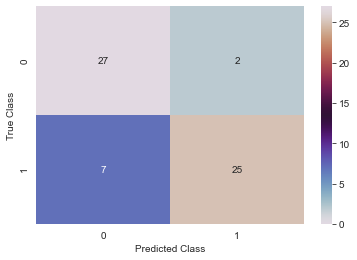

In [63]:
cm = confusion_matrix(y_test,prediction_bl)
#plt.figure(figsize=(10, 10))
sns.heatmap(cm,annot=True, fmt='g', vmin=0, cbar=True, cmap='twilight')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')

### Performanc metrics from the confusion matrix

In [64]:
#Performance metrics from confusion matrix 

FP = cm.sum(axis=0) - np.diag(cm) 
FN = cm.sum(axis=1) - np.diag(cm)
TP = np.diag(cm)
TN = cm.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, Recall, or true positive rate
TPR = TP/(TP+FN)

# Specificity or true negative rate
TNR = TN/(TN+FP) 

# Precision or positive predictive value
PPV = TP/(TP+FP)

# Negative predictive value
NPV = TN/(TN+FN)

# Fall out or false positive rate
FPR = FP/(FP+TN)

# False negative rate
FNR = FN/(TP+FN)

# False discovery rate
FDR = FP/(TP+FP)


print('Class:',class_label)

print('Specificity:',TNR)
print('Specificity Mean:',TNR.mean())

print()

print('Class:',class_label)

print('Recall/Sensitivity:',TPR)
print('Recall/Sensitivity Mean:',TPR.mean())

print()

print('Class:',class_label)

print('Precision:',PPV)
print('Precision Mean:',PPV.mean())

print()

print('Class:',class_label)

print('False Positive Rate:',FPR)
print('False Positive Rate Mean:',FPR.mean())

print()

print('Class:',class_label)

print('False Negative Rate:',FNR)
print('False Negative Rate Mean:',FNR.mean())

print()

print('Class:',class_label)

print('False Discovery Rate:',FDR)
print('False Discovery Rate Mean:',FDR.mean())

NameError: name 'class_label' is not defined

### Training and Testing Histories

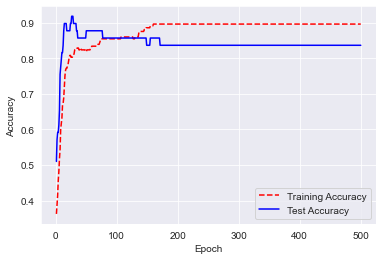

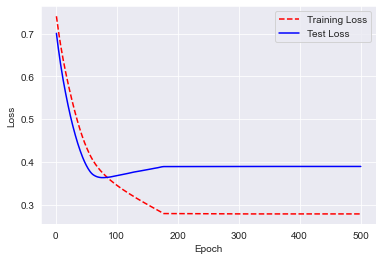

In [65]:
#Get training and test accuracy histories
training_accuracy = history.history['accuracy']
test_accuracy = history.history['val_accuracy']

#Epoch count
epoch_count = range(1,len(training_accuracy) + 1)

#plt.figure(figsize=(8, 6))
plt.plot(epoch_count, training_accuracy, "r--")
plt.plot(epoch_count,test_accuracy, "b-")
plt.legend(['Training Accuracy','Test Accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

#Get training and test loss histories
training_loss = history.history['loss']
test_loss = history.history['val_loss']


#Epoch count
epoch_count = range(1,len(training_loss) + 1)

#Visualize loss history
#plt.figure(figsize=(8, 6))
plt.plot(epoch_count, training_loss, "r--")
plt.plot(epoch_count,test_loss, "b-")
plt.legend(['Training Loss','Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

### ROC - AUC Plot and Score

Instructions for updating:
Please use `model.predict()` instead.

Heart Disease: ROC-AUC Score: = 0.947



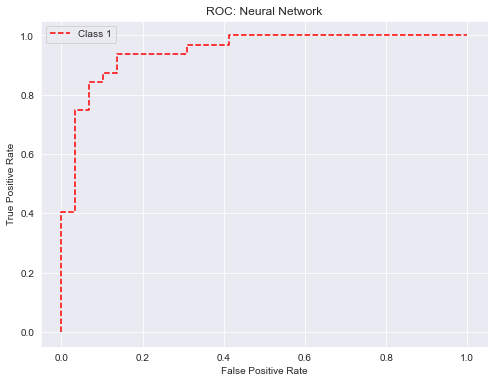

In [66]:
#ROC Plot
#from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

prediction_cplx = model.predict_proba(X_test)

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 2

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, prediction_cplx[:,-1], pos_label=i)

#y_score = classifier.fit(X_train, y_train).decision_function(X_test)
#See machinelearningmastery
# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
#roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])  
ns_probs=[0 for _ in range(len(y_test))]
lr_probs=model.predict_proba(X_test)
lr_probs=lr_probs[:,-1]
ns_auc=roc_auc_score(y_test,ns_probs)
lr_auc=roc_auc_score(y_test,lr_probs)
#print('No Heart Disease:ROC AUC=%.3f'%(ns_auc))
print()
print('Heart Disease: ROC-AUC Score: = %.3f'%(lr_auc))
print()
    
# plotting
plt.figure(figsize=(8, 6))
#plt.plot(fpr[0], tpr[0], linestyle='--',color='steelblue', label='Class 0')
plt.plot(fpr[1], tpr[1], linestyle='--',color='red', label='Class 1')
#plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
#plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Class 3 vs Rest')
#plt.plot(fpr[4], tpr[4], linestyle='--',color='black', label='Class 4 vs Rest')
#plt.plot(fpr[5], tpr[5], linestyle='--',color='purple', label='Class 5 vs Rest')
#plt.plot(fpr[6], tpr[6], linestyle='--',color='yellow', label='Class 6 vs Rest')
plt.title('ROC: Neural Network')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('RF ROC',dpi=300)

## Predictions and Confidences
 ### Classes and Probabilities

In [67]:
# Classes and Probabilities

prediction_probability = model.predict_proba(X_test)
prediction_cplx = model.predict_classes(X_test)

class_df = pd.DataFrame(prediction_cplx.round(3),columns=['Predicted class'])
proba_df = pd.DataFrame(prediction_probability.round(3),columns=['No heart disease','Heart disease'])

#pred_list = pd.concat(['frame','target_rs'],axis= 1)


predictions_df = pd.concat([proba_df,class_df ], axis=1)
predictions_df.head()

,No heart disease,Heart disease,Predicted class
0,0.737,0.263,0
1,0.543,0.457,0
2,0.366,0.634,1
3,0.749,0.251,0
4,0.301,0.699,1


### Index of  incorrect predictions

In [68]:
# Incorrect predictions

incorrects = np.nonzero(prediction_cplx.reshape((-1,)) != y_test)
incorrects

(array([ 6, 10, 11, 20, 25, 26, 27, 30, 33], dtype=int64),)

### Jaccard similarity coefficient

In [69]:
# Jaccard similarity coefficient
# Predicted class compared with actual class

jaccard = jaccard_score(y_test, prediction_cplx, average = None)#prediction_probability

jaccard_df = pd.DataFrame(jaccard,columns=['Jaccard score'])
jaccard_df

,Jaccard score
0,0.750000
1,0.735294


## Confidence interval

The confidence interval is a likelihood over a range. The true model skill may lie outside of this range.
 
**Commonly used number of standard deviations from the Gaussian distribution and their corresponding significance level are as follows:**

* 1.64 (90%)
* 1.96 (95%)
* 2.33 (98%)
* 2.58 (99%)

### Using model error

In [184]:
# 95% confidence interval
# Calculated radius of the confidence interval using model error

# where: interval = z * sqrt( (error * (1 - error)) / n)

interval = 1.96 * sqrt( (0.15 * (1 - .15)) / 61)
print('Classification error interval: %.3f' % interval)

Classification error interval: 0.090


* The classification error of the model is 15% +/- 9%
* The true classification error of the model on unseen data is likely between 6% and 24%.
 
 **The true model skill may lie outside of this range.**

### Upper and lower bounds of model classification accuracy

In [185]:
# Upper and lower bounds of model accuracy

# 218 correct predictions of 238 instances and with 95% confidence interval,
# (provided to the function as a significance of 0.05)

lower, upper = proportion_confint(52, 61, 0.05)

print('Lower Bounds of Accuracy:%.3f ' % lower)
print('Upper Bounds of Accuracy:%.3f ' %upper)

Lower Bounds of Accuracy:0.763 
Upper Bounds of Accuracy:0.941 


 **The true classification accuracy of the model on unseen data is likely between 72% and 92%**.

 **True model skill may lie outside of this range.**

# Increase in Neural Network Size

In [186]:
# Code to delete a directory if used previously

import shutil
shutil.rmtree('model.weights.bestAccCpx.hdg5', ignore_errors=True)
shutil.rmtree('model.weights.bestLossCpx.hdg5', ignore_errors=True)

In [187]:
# Increase in model complexity

batch_size = 256 
num_classes = 2 
epochs = 500 #175
es = EarlyStopping(monitor='val_loss', mode='auto', patience=20,restore_best_weights=True,
 verbose=1)
cpt = ModelCheckpoint(filepath= 'model.weights.bestLossCpx.hdf5',monitor='val_loss',
                      verbose=1,save_best_only=True,mode='min')
#cpt = ModelCheckpoint(filepath= 'model.weights.bestAccCpx.hdf5',monitor='val_accuruacy',
#                      verbose=1,save_best_only=True,mode='max')


#lr_schedule = keras.optimizers.schedules.ExponentialDecay(
#    initial_learning_rate=1e-2,
#    decay_steps=10000,
#    decay_rate=0.9)
#optimizer = tf.keras.optimizers.Adam(learning_rate=lr_schedule)


def create_cplx():
    # Create model
    model = Sequential()
    model.add(Dense(72, input_dim=(n_cols),kernel_regularizer=regularizers.l1_l2(l1=0.002, l2=0.002), activation='relu'))
    model.add(Dense(64,kernel_regularizer=regularizers.l1_l2(l1=0.002, l2=0.002),activation='relu'))
    model.add(Dense(24,kernel_regularizer=regularizers.l1_l2(l1=0.002, l2=0.002),activation='relu'))
    #model.add(Dense(24,kernel_regularizer=regularizers.l1_l2(l1=0.002, l2=0.002), activation='relu'))
    #model.add(Dense(24, activation='relu'))
    #model.add(Dropout(0.20))
    model.add(Dense(2, activation='softmax'))#sigmoid
    
    
    # Compile model
    model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])#binary_crossentropy    
    return model

model = create_cplx()
model.summary()

Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_34 (Dense)             (None, 72)                1728      
_________________________________________________________________
dense_35 (Dense)             (None, 64)                4672      
_________________________________________________________________
dense_36 (Dense)             (None, 24)                1560      
_________________________________________________________________
dense_37 (Dense)             (None, 2)                 50        
Total params: 8,010
Trainable params: 8,010
Non-trainable params: 0
_________________________________________________________________


### Cross validation

In [90]:
# evaluate model with standardized dataset
estimator = KerasClassifier(build_fn=create_cplx, 
                            epochs=epochs, batch_size=batch_size, 
                           verbose=1)

kfold = StratifiedKFold(n_splits=10, shuffle=True, random_state=42)

results = cross_val_score(estimator, X_train, y_train, cv=kfold, n_jobs=-1)

In [91]:
print("Larger Model: %.2f%% (%.2f%%)" % (results.mean()*100, results.std()*100))

Larger Model: 80.18% (4.75%)


### Model fitting

In [188]:
# Fit model

history = model.fit(X_train,
                    y_train,
                    epochs=epochs,
                    batch_size=batch_size,
                    callbacks=[cpt],#[es]
                    verbose=2,
                    validation_split=0.2 ) #validation_split=0.2

Train on 193 samples, validate on 49 samples
Epoch 1/500



Epoch 00001: val_loss improved from inf to 2.72743, saving model to model.weights.bestLossCpx.hdf5
193/193 - 1s - loss: 2.7469 - accuracy: 0.3212 - val_loss: 2.7274 - val_accuracy: 0.3469
Epoch 2/500

Epoch 00002: val_loss improved from 2.72743 to 2.70516, saving model to model.weights.bestLossCpx.hdf5
193/193 - 0s - loss: 2.7241 - accuracy: 0.3679 - val_loss: 2.7052 - val_accuracy: 0.4082
Epoch 3/500

Epoch 00003: val_loss improved from 2.70516 to 2.68345, saving model to model.weights.bestLossCpx.hdf5
193/193 - 0s - loss: 2.7022 - accuracy: 0.4715 - val_loss: 2.6835 - val_accuracy: 0.5102
Epoch 4/500

Epoch 00004: val_loss improved from 2.68345 to 2.66190, saving model to model.weights.bestLossCpx.hdf5
193/193 - 0s - loss: 2.6807 - accuracy: 0.5389 - val_loss: 2.6619 - val_accuracy: 0.6122
Epoch 5/500

Epoch 00005: val_loss improved from 2.66190 to 2.64078, saving model to model.weights.bestLossCpx.hdf5
193/193 - 0s - loss: 2.6597 - accuracy: 0.5855 - val_loss: 2.6408 - val_accuracy

### Model from saved weights

### Model fitting summary

In [190]:
# Model fitting summary 

score = model.evaluate(X_test, y_test, verbose=0)    
prediction_cplx = model.predict_classes(X_test)
print()


print(model.summary())
print()

# Matthews correlation

mcc_test = matthews_corrcoef(y_test,prediction_cplx)
print('Matthews correlation coefficient on test:',mcc_test.round(3))
print()

print('train samples:', X_train.shape[0])
print('test samples:', X_test.shape[0])
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Model: "sequential_16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_34 (Dense)             (None, 72)                1728      
_________________________________________________________________
dense_35 (Dense)             (None, 64)                4672      
_________________________________________________________________
dense_36 (Dense)             (None, 24)                1560      
_________________________________________________________________
dense_37 (Dense)             (None, 2)                 50        
Total params: 8,010
Trainable params: 8,010
Non-trainable params: 0
_________________________________________________________________
None

Matthews correlation coefficient on test: 0.737

train samples: 242
test samples: 61
Test loss: 0.5161561482265348
Test accuracy: 0.86885244


### Classification report

In [191]:
print(classification_report(y_test.astype(int), prediction_cplx))

              precision    recall  f1-score   support

           0       0.86      0.86      0.86        29
           1       0.88      0.88      0.88        32

    accuracy                           0.87        61
   macro avg       0.87      0.87      0.87        61
weighted avg       0.87      0.87      0.87        61



### Confusion matrix

Text(0.5, 16.0, 'Predicted Class')

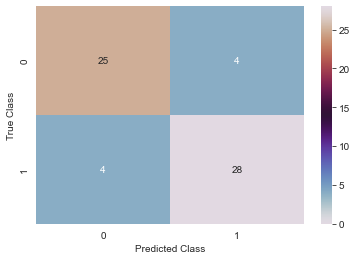

In [192]:
cm = confusion_matrix(y_test,prediction_cplx)
#plt.figure(figsize=(10, 10))
sns.heatmap(cm,annot=True, fmt='g', vmin=0, cbar=True, cmap='twilight')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')

### Performanc metrics from the confusion matrix

In [193]:
#Performance metrics from confusion matrix 

FP = cm.sum(axis=0) - np.diag(cm) 
FN = cm.sum(axis=1) - np.diag(cm)
TP = np.diag(cm)
TN = cm.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, Recall, or true positive rate
TPR = TP/(TP+FN)

# Specificity or true negative rate
TNR = TN/(TN+FP) 

# Precision or positive predictive value
PPV = TP/(TP+FP)

# Negative predictive value
NPV = TN/(TN+FN)

# Fall out or false positive rate
FPR = FP/(FP+TN)

# False negative rate
FNR = FN/(TP+FN)

# False discovery rate
FDR = FP/(TP+FP)


print('Class:',class_label)

print('Specificity:',TNR)
print('Specificity Mean:',TNR.mean())

print()

print('Class:',class_label)

print('Recall/Sensitivity:',TPR)
print('Recall/Sensitivity Mean:',TPR.mean())

print()

print('Class:',class_label)

print('Precision:',PPV)
print('Precision Mean:',PPV.mean())

print()

print('Class:',class_label)

print('False Positive Rate:',FPR)
print('False Positive Rate Mean:',FPR.mean())

print()

print('Class:',class_label)

print('False Negative Rate:',FNR)
print('False Negative Rate Mean:',FNR.mean())

print()

print('Class:',class_label)

print('False Discovery Rate:',FDR)
print('False Discovery Rate Mean:',FDR.mean())

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
Specificity: [0.875      0.86206897]
Specificity Mean: 0.8685344827586207

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
Recall/Sensitivity: [0.86206897 0.875     ]
Recall/Sensitivity Mean: 0.8685344827586207

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
Precision: [0.86206897 0.875     ]
Precision Mean: 0.8685344827586207

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
False Positive Rate: [0.125      0.13793103]
False Positive Rate Mean: 0.1314655172413793

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
False Negative Rate: [0.13793103 0.125     ]
False Negative Rate Mean: 0.1314655172413793

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
False Discovery Rate: [0.13793103 0.125     ]
False Discovery Rate Mean: 0.1314655172413793


### Training and Testing Histories

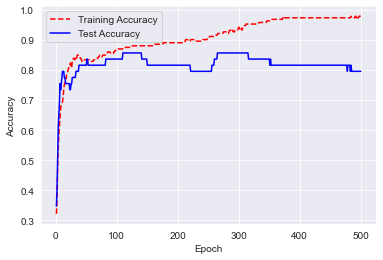

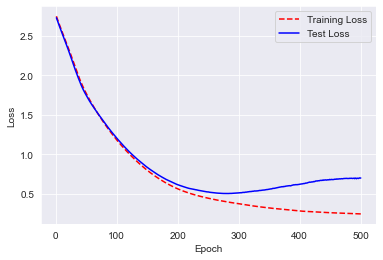

In [194]:
#Get training and test accuracy histories
training_accuracy = history.history['accuracy']
test_accuracy = history.history['val_accuracy']

#Epoch count
epoch_count = range(1,len(training_accuracy) + 1)

#plt.figure(figsize=(8, 6))
plt.plot(epoch_count, training_accuracy, "r--")
plt.plot(epoch_count,test_accuracy, "b-")
plt.legend(['Training Accuracy','Test Accuracy'])
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.show()

#Get training and test loss histories
training_loss = history.history['loss']
test_loss = history.history['val_loss']


#Epoch count
epoch_count = range(1,len(training_loss) + 1)

#Visualize loss history
#plt.figure(figsize=(8, 6))
plt.plot(epoch_count, training_loss, "r--")
plt.plot(epoch_count,test_loss, "b-")
plt.legend(['Training Loss','Test Loss'])
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.show()

### ROC - AUC Plot and Score


Heart Disease: ROC-AUC Score: = 0.932



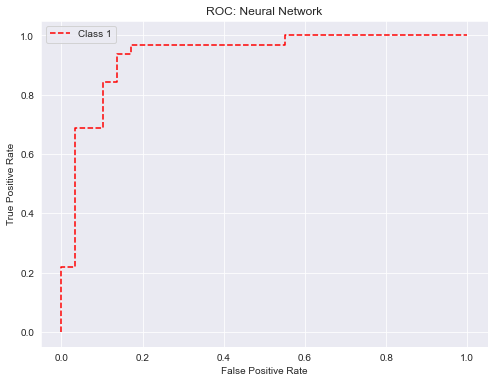

In [195]:
#ROC Plot
#from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

prediction_cplx = model.predict_proba(X_test)

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 2

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, prediction_cplx[:,-1], pos_label=i)

#y_score = classifier.fit(X_train, y_train).decision_function(X_test)
#See machinelearningmastery
# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
#roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])  
ns_probs=[0 for _ in range(len(y_test))]
lr_probs=model.predict_proba(X_test)
lr_probs=lr_probs[:,-1]
ns_auc=roc_auc_score(y_test,ns_probs)
lr_auc=roc_auc_score(y_test,lr_probs)
#print('No Heart Disease:ROC AUC=%.3f'%(ns_auc))
print()
print('Heart Disease: ROC-AUC Score: = %.3f'%(lr_auc))
print()
    
# plotting
plt.figure(figsize=(8, 6))
#plt.plot(fpr[0], tpr[0], linestyle='--',color='steelblue', label='Class 0')
plt.plot(fpr[1], tpr[1], linestyle='--',color='red', label='Class 1')
#plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
#plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Class 3 vs Rest')
#plt.plot(fpr[4], tpr[4], linestyle='--',color='black', label='Class 4 vs Rest')
#plt.plot(fpr[5], tpr[5], linestyle='--',color='purple', label='Class 5 vs Rest')
#plt.plot(fpr[6], tpr[6], linestyle='--',color='yellow', label='Class 6 vs Rest')
plt.title('ROC: Neural Network')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('RF ROC',dpi=300)

## Predictions and Confidences
 **Classes and Probabilities**

In [196]:
# Classes and Probabilities

prediction_probability = model.predict_proba(X_test)
prediction_cplx = model.predict_classes(X_test)

class_df = pd.DataFrame(prediction_cplx.round(3),columns=['Predicted class'])
proba_df = pd.DataFrame(prediction_probability.round(3),columns=['No heart disease','Heart disease'])

#pred_list = pd.concat(['frame','target_rs'],axis= 1)


predictions_df = pd.concat([proba_df,class_df ], axis=1)
predictions_df

,No heart disease,Heart disease,Predicted class
0,0.921,0.079,0
1,0.224,0.776,1
2,0.068,0.932,1
3,0.994,0.006,0
4,0.055,0.945,1
...,...,...,...
56,0.991,0.009,0
57,0.052,0.948,1
58,0.976,0.024,0
59,0.999,0.001,0


### Index of  incorrect predictions

In [197]:
# Incorrect predictions

incorrects = np.nonzero(prediction_cplx.reshape((-1,)) != y_test)
incorrects

(array([ 1, 11, 22, 25, 26, 30, 33, 36], dtype=int64),)

### Jaccard similarity coefficient

In [198]:
# Jaccard similarity coefficient
# Predicted class compared with actual class


jaccard = jaccard_score(y_test, prediction_cplx, average = None)

jaccard_df = pd.DataFrame(jaccard,columns=['Jaccard score'])
jaccard_df

,Jaccard score
0,0.757576
1,0.777778


## Confidence interval

The confidence interval is a likelihood over a range. The true model skill may lie outside of this range.
 
**Commonly used number of standard deviations from the Gaussian distribution and their corresponding significance level are as follows:**

* 1.64 (90%)
* 1.96 (95%)
* 2.33 (98%)
* 2.58 (99%)

### Using model error

In [199]:
# 95% confidence interval
# Calculated radius of the confidence interval using model error

# where: interval = z * sqrt( (error * (1 - error)) / n)

interval = 1.96 * sqrt( (0.13 * (1 - .13)) / 61)
print('Classification error interval: %.3f' % interval)

Classification error interval: 0.084


* The classification error of the model is 13% +/- 8%
* The true classification error of the model on unseen data is likely between 5% and 21%.
 
 **The true model skill may lie outside of this range.**


### Upper and lower bounds of model classification accuracy

In [200]:
# Upper and lower bounds of model accuracy

# 218 correct predictions of 238 instances and with 95% confidence interval,
# (provided to the function as a significance of 0.05)

lower, upper = proportion_confint(53, 61, 0.05)

print('Lower Bounds of Accuracy:%.3f ' % lower)
print('Upper Bounds of Accuracy:%.3f ' %upper)

Lower Bounds of Accuracy:0.784 
Upper Bounds of Accuracy:0.954 


 **The true classification accuracy of the model on unseen data is likely between 78% and 95%**.

 **True model skill may lie outside of this range.**

#  2. Model Tuning and Evaluation

### Grid Search
#### Tuning  a neural net model 

Searching through activation functions and optimizers comparing the results with the best peforming model from the model definition and training phase.


**________________________________________________________________________________________________________**

**Use code below to remove saved models if run before.**

**Note the saved path to avoid unintentionally deleting valuable models.**

#### Parameter grid for tuning neural network

In [115]:
#define parameter grid

batch_size = 256
num_classes = 2 
epochs = 500 #675
es = EarlyStopping(monitor='val_loss', mode='auto', patience=10, restore_best_weights=True,
 verbose=1)

activation_functions_layer_1 = ['selu','relu','elu','tanh'] 
activation_functions_layer_2 = ['selu','relu','elu','tanh']
activation_functions_layer_3 = ['selu','relu','elu','tanh']
opimizers = ['RMSprop','adam','nadam','sgd']

#optimize over parameter grid (grid search)

for activation_function_layer_1 in activation_functions_layer_1:
    for activation_function_layer_2 in activation_functions_layer_2:
        for activation_function_layer_3 in activation_functions_layer_3:
            for opimizer in opimizers:
                
    
        
            
                model = Sequential()
                model.add(Dense(72,kernel_regularizer=regularizers.l1_l2(l1=0.002, l2=0.002), activation = activation_function_layer_1, input_shape=(n_cols,)))               
                model.add(Dense(64,kernel_regularizer=regularizers.l1_l2(l1=0.002, l2=0.002), activation=activation_function_layer_2))
                model.add(Dense(24,kernel_regularizer=regularizers.l1_l2(l1=0.002, l2=0.002), activation=activation_function_layer_3))
                #model.add(Dropout(0.20))
                model.add(Dense(num_classes, activation='softmax'))
            
            
                model.compile(loss='sparse_categorical_crossentropy',
                              optimizer=opimizer,
                              metrics=['accuracy'])

                history = model.fit(X_train, y_train, 
                batch_size=batch_size,
                epochs=epochs,
                callbacks=[es],        
                verbose=1,
                validation_data=(X_test, y_test))
        
                score = model.evaluate(X_test, y_test, verbose=0)
                save_path = "kerSM_Test_tuned_HeartDis_model.%s.%s.%s.%s.%s.h5" % (activation_function_layer_1,activation_function_layer_2,activation_function_layer_3,opimizer,score[1].round(3))
            
                model.save(save_path)

Train on 242 samples, validate on 61 samples
Epoch 1/500


242/242 [==============================] - 2s 8ms/sample - loss: 2.9831 - accuracy: 0.4215 - val_loss: 2.6118 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.6428 - accuracy: 0.6983 - val_loss: 2.5285 - val_accuracy: 0.8525
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5534 - accuracy: 0.7893 - val_loss: 2.4384 - val_accuracy: 0.8852
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.4975 - accuracy: 0.8223 - val_loss: 2.4231 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4626 - accuracy: 0.8182 - val_loss: 2.3817 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 241us/sample - loss: 2.4382 - accuracy: 0.8264 - val_loss: 2.3704 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4188 - accuracy: 0.8182 - val_loss: 2.3466 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 3.0326 - accuracy: 0.5083 - val_loss: 2.8643 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 285us/sample - loss: 2.8766 - accuracy: 0.5124 - val_loss: 2.7193 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7559 - accuracy: 0.5496 - val_loss: 2.6215 - val_accuracy: 0.6557
Epoch 4/500
242/242 [==============================] - 0s 248us/sample - loss: 2.6694 - accuracy: 0.6612 - val_loss: 2.5605 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6081 - accuracy: 0.7231 - val_loss: 2.5191 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5607 - accuracy: 0.7397 - val_loss: 2.4863 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5210 - accuracy: 0.7562 - val_loss: 2.4576 - val_ac

242/242 [==============================] - 3s 13ms/sample - loss: 2.9212 - accuracy: 0.5537 - val_loss: 2.7183 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7302 - accuracy: 0.6612 - val_loss: 2.6275 - val_accuracy: 0.7541
Epoch 3/500
242/242 [==============================] - 0s 156us/sample - loss: 2.6463 - accuracy: 0.7231 - val_loss: 2.5713 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5946 - accuracy: 0.7479 - val_loss: 2.5307 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 221us/sample - loss: 2.5585 - accuracy: 0.7769 - val_loss: 2.4985 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 174us/sample - loss: 2.5305 - accuracy: 0.8017 - val_loss: 2.4710 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5072 - accuracy: 0.8099 - val_loss: 2.4481 - val_a

242/242 [==============================] - 2s 7ms/sample - loss: 3.3728 - accuracy: 0.2810 - val_loss: 3.2050 - val_accuracy: 0.2295
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 3.1864 - accuracy: 0.2851 - val_loss: 3.0661 - val_accuracy: 0.2623
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 3.0445 - accuracy: 0.3017 - val_loss: 2.9569 - val_accuracy: 0.2787
Epoch 4/500
242/242 [==============================] - 0s 154us/sample - loss: 2.9378 - accuracy: 0.3719 - val_loss: 2.8701 - val_accuracy: 0.3443
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8564 - accuracy: 0.4545 - val_loss: 2.8011 - val_accuracy: 0.4918
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7935 - accuracy: 0.5496 - val_loss: 2.7451 - val_accuracy: 0.5738
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7432 - accuracy: 0.6033 - val_loss: 2.6993 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.8466 - accuracy: 0.3926 - val_loss: 2.5592 - val_accuracy: 0.7869
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6346 - accuracy: 0.6901 - val_loss: 2.4908 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5573 - accuracy: 0.7355 - val_loss: 2.4025 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5082 - accuracy: 0.7769 - val_loss: 2.3965 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4655 - accuracy: 0.7851 - val_loss: 2.3329 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4316 - accuracy: 0.8140 - val_loss: 2.3280 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4042 - accuracy: 0.8140 - val_loss: 2.2902 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 3.0578 - accuracy: 0.4504 - val_loss: 2.9224 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.9098 - accuracy: 0.4628 - val_loss: 2.8043 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.8034 - accuracy: 0.4876 - val_loss: 2.7215 - val_accuracy: 0.6393
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7322 - accuracy: 0.5455 - val_loss: 2.6577 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6817 - accuracy: 0.6860 - val_loss: 2.6033 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6397 - accuracy: 0.7273 - val_loss: 2.5534 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5999 - accuracy: 0.7562 - val_loss: 2.5085 - val_ac

242/242 [==============================] - 3s 12ms/sample - loss: 2.8767 - accuracy: 0.4669 - val_loss: 2.7639 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 235us/sample - loss: 2.7492 - accuracy: 0.5165 - val_loss: 2.6970 - val_accuracy: 0.6557
Epoch 3/500
242/242 [==============================] - 0s 271us/sample - loss: 2.6837 - accuracy: 0.5826 - val_loss: 2.6466 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6367 - accuracy: 0.7231 - val_loss: 2.6038 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5994 - accuracy: 0.7769 - val_loss: 2.5661 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5671 - accuracy: 0.8182 - val_loss: 2.5322 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5386 - accuracy: 0.8306 - val_loss: 2.5018 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.8302 - accuracy: 0.3719 - val_loss: 2.7969 - val_accuracy: 0.3607
Epoch 2/500
242/242 [==============================] - 0s 210us/sample - loss: 2.7973 - accuracy: 0.4380 - val_loss: 2.7669 - val_accuracy: 0.4262
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7706 - accuracy: 0.5083 - val_loss: 2.7406 - val_accuracy: 0.4590
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7477 - accuracy: 0.5579 - val_loss: 2.7172 - val_accuracy: 0.5738
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7278 - accuracy: 0.5909 - val_loss: 2.6962 - val_accuracy: 0.6230
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7103 - accuracy: 0.6322 - val_loss: 2.6773 - val_accuracy: 0.6557
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6945 - accuracy: 0.6446 - val_loss: 2.6601 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8990 - accuracy: 0.3678 - val_loss: 2.6275 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6825 - accuracy: 0.6446 - val_loss: 2.5345 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6174 - accuracy: 0.7025 - val_loss: 2.5132 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5650 - accuracy: 0.7438 - val_loss: 2.4366 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5193 - accuracy: 0.7810 - val_loss: 2.4262 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4849 - accuracy: 0.7810 - val_loss: 2.3861 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4582 - accuracy: 0.8058 - val_loss: 2.3746 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 2.7831 - accuracy: 0.5413 - val_loss: 2.6184 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6955 - accuracy: 0.6446 - val_loss: 2.5406 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6247 - accuracy: 0.6860 - val_loss: 2.4819 - val_accuracy: 0.8852
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5680 - accuracy: 0.7479 - val_loss: 2.4376 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5235 - accuracy: 0.7934 - val_loss: 2.4045 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4888 - accuracy: 0.7975 - val_loss: 2.3802 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4618 - accuracy: 0.8099 - val_loss: 2.3624 - val_ac

242/242 [==============================] - 3s 12ms/sample - loss: 2.6860 - accuracy: 0.7066 - val_loss: 2.6036 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6308 - accuracy: 0.7686 - val_loss: 2.5608 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5951 - accuracy: 0.7851 - val_loss: 2.5269 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 210us/sample - loss: 2.5650 - accuracy: 0.8017 - val_loss: 2.4955 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 216us/sample - loss: 2.5380 - accuracy: 0.8099 - val_loss: 2.4698 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5136 - accuracy: 0.7975 - val_loss: 2.4445 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 242us/sample - loss: 2.4910 - accuracy: 0.8099 - val_loss: 2.4238 - val_a

242/242 [==============================] - 2s 7ms/sample - loss: 2.8871 - accuracy: 0.4256 - val_loss: 2.8517 - val_accuracy: 0.4098
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.8451 - accuracy: 0.4174 - val_loss: 2.8210 - val_accuracy: 0.4262
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.8125 - accuracy: 0.4587 - val_loss: 2.7949 - val_accuracy: 0.4590
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7861 - accuracy: 0.4752 - val_loss: 2.7718 - val_accuracy: 0.4426
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7639 - accuracy: 0.5289 - val_loss: 2.7508 - val_accuracy: 0.4590
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7446 - accuracy: 0.5661 - val_loss: 2.7316 - val_accuracy: 0.4918
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7275 - accuracy: 0.5909 - val_loss: 2.7138 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7481 - accuracy: 0.5785 - val_loss: 2.5448 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5384 - accuracy: 0.7645 - val_loss: 2.4431 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5187 - accuracy: 0.7521 - val_loss: 2.4830 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4686 - accuracy: 0.7810 - val_loss: 2.3974 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4360 - accuracy: 0.8099 - val_loss: 2.4063 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4133 - accuracy: 0.8223 - val_loss: 2.3728 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 176us/sample - loss: 2.3946 - accuracy: 0.8306 - val_loss: 2.3654 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 2.9471 - accuracy: 0.3843 - val_loss: 2.8544 - val_accuracy: 0.4590
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8357 - accuracy: 0.4545 - val_loss: 2.7382 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7422 - accuracy: 0.5702 - val_loss: 2.6480 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6669 - accuracy: 0.6901 - val_loss: 2.5791 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6081 - accuracy: 0.7397 - val_loss: 2.5261 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5625 - accuracy: 0.7851 - val_loss: 2.4848 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5269 - accuracy: 0.7975 - val_loss: 2.4518 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 2.7767 - accuracy: 0.5868 - val_loss: 2.5418 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6670 - accuracy: 0.6529 - val_loss: 2.4897 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6072 - accuracy: 0.7149 - val_loss: 2.4548 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5634 - accuracy: 0.7562 - val_loss: 2.4259 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5287 - accuracy: 0.7727 - val_loss: 2.4034 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5005 - accuracy: 0.7851 - val_loss: 2.3848 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4770 - accuracy: 0.8017 - val_loss: 2.3693 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 3.0159 - accuracy: 0.3099 - val_loss: 3.0560 - val_accuracy: 0.2295
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.9689 - accuracy: 0.3182 - val_loss: 3.0101 - val_accuracy: 0.2459
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.9292 - accuracy: 0.3471 - val_loss: 2.9689 - val_accuracy: 0.2623
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.8950 - accuracy: 0.3554 - val_loss: 2.9317 - val_accuracy: 0.2787
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8651 - accuracy: 0.3884 - val_loss: 2.8978 - val_accuracy: 0.3279
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8386 - accuracy: 0.4174 - val_loss: 2.8667 - val_accuracy: 0.3607
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8146 - accuracy: 0.4504 - val_loss: 2.8379 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 3.0882 - accuracy: 0.3719 - val_loss: 2.7600 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7524 - accuracy: 0.5289 - val_loss: 2.5997 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6114 - accuracy: 0.6901 - val_loss: 2.5068 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.5252 - accuracy: 0.7893 - val_loss: 2.4390 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4677 - accuracy: 0.8140 - val_loss: 2.4001 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4258 - accuracy: 0.8140 - val_loss: 2.3612 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.3942 - accuracy: 0.8264 - val_loss: 2.3395 - val_a

242/242 [==============================] - 2s 6ms/sample - loss: 2.8971 - accuracy: 0.4339 - val_loss: 2.8148 - val_accuracy: 0.4262
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7796 - accuracy: 0.4669 - val_loss: 2.7267 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6983 - accuracy: 0.5909 - val_loss: 2.6587 - val_accuracy: 0.6885
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6423 - accuracy: 0.7438 - val_loss: 2.6025 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5998 - accuracy: 0.7645 - val_loss: 2.5518 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5626 - accuracy: 0.7727 - val_loss: 2.5056 - val_accuracy: 0.7705
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5271 - accuracy: 0.7769 - val_loss: 2.4649 - val_ac

242/242 [==============================] - 3s 12ms/sample - loss: 2.7015 - accuracy: 0.5579 - val_loss: 2.6428 - val_accuracy: 0.6721
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6404 - accuracy: 0.6653 - val_loss: 2.5991 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6026 - accuracy: 0.7273 - val_loss: 2.5630 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 141us/sample - loss: 2.5705 - accuracy: 0.7521 - val_loss: 2.5307 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5415 - accuracy: 0.7727 - val_loss: 2.5007 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.5144 - accuracy: 0.7851 - val_loss: 2.4723 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4885 - accuracy: 0.7934 - val_loss: 2.4451 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7505 - accuracy: 0.5579 - val_loss: 2.7379 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7320 - accuracy: 0.5826 - val_loss: 2.7216 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7159 - accuracy: 0.6116 - val_loss: 2.7069 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7017 - accuracy: 0.6488 - val_loss: 2.6933 - val_accuracy: 0.6721
Epoch 5/500
242/242 [==============================] - 0s 174us/sample - loss: 2.6890 - accuracy: 0.6694 - val_loss: 2.6808 - val_accuracy: 0.6721
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6773 - accuracy: 0.7025 - val_loss: 2.6690 - val_accuracy: 0.6885
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6665 - accuracy: 0.7231 - val_loss: 2.6579 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7467 - accuracy: 0.6116 - val_loss: 2.5834 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6151 - accuracy: 0.7645 - val_loss: 2.5082 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.5442 - accuracy: 0.8099 - val_loss: 2.4482 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 142us/sample - loss: 2.4909 - accuracy: 0.8182 - val_loss: 2.4070 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4488 - accuracy: 0.8223 - val_loss: 2.3696 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.4138 - accuracy: 0.8306 - val_loss: 2.3428 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 158us/sample - loss: 2.3829 - accuracy: 0.8388 - val_loss: 2.3138 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.8428 - accuracy: 0.3802 - val_loss: 2.8059 - val_accuracy: 0.3607
Epoch 2/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7872 - accuracy: 0.4132 - val_loss: 2.7481 - val_accuracy: 0.4098
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7383 - accuracy: 0.5000 - val_loss: 2.6965 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 291us/sample - loss: 2.6950 - accuracy: 0.6157 - val_loss: 2.6516 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 325us/sample - loss: 2.6568 - accuracy: 0.7397 - val_loss: 2.6122 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.6226 - accuracy: 0.7727 - val_loss: 2.5762 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 241us/sample - loss: 2.5916 - accuracy: 0.7810 - val_loss: 2.5430 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7820 - accuracy: 0.4008 - val_loss: 2.7480 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7459 - accuracy: 0.4711 - val_loss: 2.7201 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7198 - accuracy: 0.5826 - val_loss: 2.6951 - val_accuracy: 0.6393
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6961 - accuracy: 0.6694 - val_loss: 2.6706 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6733 - accuracy: 0.7438 - val_loss: 2.6458 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6505 - accuracy: 0.7727 - val_loss: 2.6206 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6277 - accuracy: 0.7893 - val_loss: 2.5945 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7402 - accuracy: 0.5455 - val_loss: 2.7000 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7335 - accuracy: 0.5620 - val_loss: 2.6934 - val_accuracy: 0.6557
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7271 - accuracy: 0.5702 - val_loss: 2.6870 - val_accuracy: 0.6557
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7210 - accuracy: 0.5661 - val_loss: 2.6809 - val_accuracy: 0.6721
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7151 - accuracy: 0.5785 - val_loss: 2.6750 - val_accuracy: 0.6721
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7095 - accuracy: 0.5950 - val_loss: 2.6693 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7040 - accuracy: 0.6074 - val_loss: 2.6637 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7628 - accuracy: 0.4380 - val_loss: 2.5713 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6141 - accuracy: 0.7521 - val_loss: 2.5008 - val_accuracy: 0.8525
Epoch 3/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5425 - accuracy: 0.7645 - val_loss: 2.4430 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4899 - accuracy: 0.7851 - val_loss: 2.4064 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4487 - accuracy: 0.7934 - val_loss: 2.3696 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4137 - accuracy: 0.8058 - val_loss: 2.3434 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 125us/sample - loss: 2.3835 - accuracy: 0.8017 - val_loss: 2.3170 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7419 - accuracy: 0.6033 - val_loss: 2.6768 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7055 - accuracy: 0.6818 - val_loss: 2.6419 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6719 - accuracy: 0.6818 - val_loss: 2.6085 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6405 - accuracy: 0.7190 - val_loss: 2.5763 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6108 - accuracy: 0.7479 - val_loss: 2.5450 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5824 - accuracy: 0.7562 - val_loss: 2.5150 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5550 - accuracy: 0.7686 - val_loss: 2.4861 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7184 - accuracy: 0.5289 - val_loss: 2.6414 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6510 - accuracy: 0.6570 - val_loss: 2.6008 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6129 - accuracy: 0.7355 - val_loss: 2.5670 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5819 - accuracy: 0.7562 - val_loss: 2.5361 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5543 - accuracy: 0.7769 - val_loss: 2.5076 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5290 - accuracy: 0.7975 - val_loss: 2.4806 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5053 - accuracy: 0.7975 - val_loss: 2.4551 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7918 - accuracy: 0.5083 - val_loss: 2.8214 - val_accuracy: 0.4426
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7857 - accuracy: 0.5331 - val_loss: 2.8142 - val_accuracy: 0.4426
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7798 - accuracy: 0.5413 - val_loss: 2.8073 - val_accuracy: 0.4754
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7740 - accuracy: 0.5537 - val_loss: 2.8005 - val_accuracy: 0.4754
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7685 - accuracy: 0.5537 - val_loss: 2.7939 - val_accuracy: 0.4754
Epoch 6/500
242/242 [==============================] - 0s 210us/sample - loss: 2.7631 - accuracy: 0.5620 - val_loss: 2.7875 - val_accuracy: 0.4754
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7578 - accuracy: 0.5744 - val_loss: 2.7812 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7708 - accuracy: 0.4793 - val_loss: 2.5531 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6002 - accuracy: 0.7562 - val_loss: 2.4783 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5268 - accuracy: 0.7975 - val_loss: 2.4234 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.4775 - accuracy: 0.8099 - val_loss: 2.3878 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4399 - accuracy: 0.8223 - val_loss: 2.3555 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4089 - accuracy: 0.8223 - val_loss: 2.3299 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.3819 - accuracy: 0.8306 - val_loss: 2.3064 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8211 - accuracy: 0.4628 - val_loss: 2.7662 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.7655 - accuracy: 0.5000 - val_loss: 2.7097 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7167 - accuracy: 0.5992 - val_loss: 2.6583 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6733 - accuracy: 0.7314 - val_loss: 2.6110 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6340 - accuracy: 0.7521 - val_loss: 2.5677 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5982 - accuracy: 0.7562 - val_loss: 2.5284 - val_accuracy: 0.9016
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5653 - accuracy: 0.7769 - val_loss: 2.4921 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.7771 - accuracy: 0.4545 - val_loss: 2.7202 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7182 - accuracy: 0.5331 - val_loss: 2.6721 - val_accuracy: 0.6230
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6783 - accuracy: 0.5744 - val_loss: 2.6304 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 243us/sample - loss: 2.6437 - accuracy: 0.6694 - val_loss: 2.5916 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6116 - accuracy: 0.7066 - val_loss: 2.5550 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 216us/sample - loss: 2.5809 - accuracy: 0.7314 - val_loss: 2.5203 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5513 - accuracy: 0.7562 - val_loss: 2.4871 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.7265 - accuracy: 0.5331 - val_loss: 2.7198 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7138 - accuracy: 0.5455 - val_loss: 2.7075 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7024 - accuracy: 0.5620 - val_loss: 2.6960 - val_accuracy: 0.5902
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6920 - accuracy: 0.6074 - val_loss: 2.6853 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6825 - accuracy: 0.6240 - val_loss: 2.6751 - val_accuracy: 0.6066
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6735 - accuracy: 0.6529 - val_loss: 2.6655 - val_accuracy: 0.6066
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6651 - accuracy: 0.6777 - val_loss: 2.6564 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8468 - accuracy: 0.4504 - val_loss: 2.6011 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6207 - accuracy: 0.7190 - val_loss: 2.6054 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6209 - accuracy: 0.6860 - val_loss: 2.4975 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5590 - accuracy: 0.7355 - val_loss: 2.4733 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5031 - accuracy: 0.7851 - val_loss: 2.4037 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4659 - accuracy: 0.8140 - val_loss: 2.3961 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 209us/sample - loss: 2.4440 - accuracy: 0.8058 - val_loss: 2.3687 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 2.7766 - accuracy: 0.5372 - val_loss: 2.6414 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 210us/sample - loss: 2.6840 - accuracy: 0.6529 - val_loss: 2.5862 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6231 - accuracy: 0.6942 - val_loss: 2.5396 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.5726 - accuracy: 0.7397 - val_loss: 2.4934 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5277 - accuracy: 0.7645 - val_loss: 2.4498 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4902 - accuracy: 0.7851 - val_loss: 2.4127 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4613 - accuracy: 0.7975 - val_loss: 2.3832 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.7500 - accuracy: 0.6364 - val_loss: 2.5626 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6316 - accuracy: 0.6901 - val_loss: 2.4996 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5804 - accuracy: 0.7231 - val_loss: 2.4582 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5450 - accuracy: 0.7686 - val_loss: 2.4270 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.5169 - accuracy: 0.7686 - val_loss: 2.4021 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4932 - accuracy: 0.7810 - val_loss: 2.3815 - val_accuracy: 0.9016
Epoch 7/500
242/242 [==============================] - 0s 158us/sample - loss: 2.4728 - accuracy: 0.7934 - val_loss: 2.3642 - val_a

242/242 [==============================] - 2s 7ms/sample - loss: 3.0006 - accuracy: 0.3967 - val_loss: 2.8297 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.9166 - accuracy: 0.3926 - val_loss: 2.7689 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8543 - accuracy: 0.4215 - val_loss: 2.7228 - val_accuracy: 0.5738
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.8071 - accuracy: 0.4917 - val_loss: 2.6859 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7694 - accuracy: 0.5372 - val_loss: 2.6555 - val_accuracy: 0.6557
Epoch 6/500
242/242 [==============================] - 0s 167us/sample - loss: 2.7386 - accuracy: 0.5744 - val_loss: 2.6298 - val_accuracy: 0.6885
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7124 - accuracy: 0.6074 - val_loss: 2.6077 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8850 - accuracy: 0.3264 - val_loss: 2.6808 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6768 - accuracy: 0.6240 - val_loss: 2.5724 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5806 - accuracy: 0.7438 - val_loss: 2.4948 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5128 - accuracy: 0.7893 - val_loss: 2.4372 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 199us/sample - loss: 2.4654 - accuracy: 0.7934 - val_loss: 2.3979 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4289 - accuracy: 0.8058 - val_loss: 2.3628 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3995 - accuracy: 0.8099 - val_loss: 2.3430 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.9593 - accuracy: 0.4421 - val_loss: 2.9550 - val_accuracy: 0.4098
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.8855 - accuracy: 0.4669 - val_loss: 2.8691 - val_accuracy: 0.4590
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8213 - accuracy: 0.4835 - val_loss: 2.7952 - val_accuracy: 0.5246
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.7640 - accuracy: 0.5620 - val_loss: 2.7318 - val_accuracy: 0.5574
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7129 - accuracy: 0.6198 - val_loss: 2.6758 - val_accuracy: 0.5902
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6665 - accuracy: 0.6405 - val_loss: 2.6255 - val_accuracy: 0.6885
Epoch 7/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6249 - accuracy: 0.7107 - val_loss: 2.5794 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8437 - accuracy: 0.3802 - val_loss: 2.7891 - val_accuracy: 0.4426
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7689 - accuracy: 0.5165 - val_loss: 2.7345 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7232 - accuracy: 0.6033 - val_loss: 2.6892 - val_accuracy: 0.6557
Epoch 4/500
242/242 [==============================] - 0s 250us/sample - loss: 2.6849 - accuracy: 0.6736 - val_loss: 2.6479 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 291us/sample - loss: 2.6498 - accuracy: 0.7231 - val_loss: 2.6084 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6167 - accuracy: 0.7603 - val_loss: 2.5728 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5862 - accuracy: 0.7851 - val_loss: 2.5407 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7892 - accuracy: 0.5083 - val_loss: 2.7668 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7674 - accuracy: 0.5496 - val_loss: 2.7469 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7480 - accuracy: 0.5620 - val_loss: 2.7290 - val_accuracy: 0.5902
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7306 - accuracy: 0.6033 - val_loss: 2.7125 - val_accuracy: 0.6557
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7143 - accuracy: 0.6529 - val_loss: 2.6972 - val_accuracy: 0.6885
Epoch 6/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6993 - accuracy: 0.6694 - val_loss: 2.6830 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6856 - accuracy: 0.6942 - val_loss: 2.6702 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7666 - accuracy: 0.5496 - val_loss: 2.5487 - val_accuracy: 0.8197
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5930 - accuracy: 0.7562 - val_loss: 2.4784 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5212 - accuracy: 0.7851 - val_loss: 2.4126 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4743 - accuracy: 0.8058 - val_loss: 2.3847 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4401 - accuracy: 0.8182 - val_loss: 2.3500 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.4120 - accuracy: 0.8347 - val_loss: 2.3284 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.3874 - accuracy: 0.8306 - val_loss: 2.3041 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8081 - accuracy: 0.4876 - val_loss: 2.7397 - val_accuracy: 0.5902
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7291 - accuracy: 0.5909 - val_loss: 2.6715 - val_accuracy: 0.6721
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6672 - accuracy: 0.6694 - val_loss: 2.6127 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 168us/sample - loss: 2.6171 - accuracy: 0.7190 - val_loss: 2.5613 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5746 - accuracy: 0.7397 - val_loss: 2.5167 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5378 - accuracy: 0.7603 - val_loss: 2.4788 - val_accuracy: 0.7705
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5058 - accuracy: 0.7686 - val_loss: 2.4475 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7561 - accuracy: 0.4669 - val_loss: 2.6298 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6887 - accuracy: 0.5909 - val_loss: 2.5827 - val_accuracy: 0.7541
Epoch 3/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6460 - accuracy: 0.6157 - val_loss: 2.5432 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 244us/sample - loss: 2.6098 - accuracy: 0.6777 - val_loss: 2.5077 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5766 - accuracy: 0.7025 - val_loss: 2.4751 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5457 - accuracy: 0.7397 - val_loss: 2.4449 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 241us/sample - loss: 2.5166 - accuracy: 0.7603 - val_loss: 2.4171 - val_ac

242/242 [==============================] - 1s 4ms/sample - loss: 2.9210 - accuracy: 0.4421 - val_loss: 2.8286 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.8645 - accuracy: 0.4504 - val_loss: 2.7866 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8207 - accuracy: 0.4793 - val_loss: 2.7532 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.7865 - accuracy: 0.5207 - val_loss: 2.7262 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7594 - accuracy: 0.5620 - val_loss: 2.7040 - val_accuracy: 0.6557
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7376 - accuracy: 0.5826 - val_loss: 2.6853 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 160us/sample - loss: 2.7197 - accuracy: 0.6033 - val_loss: 2.6691 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7732 - accuracy: 0.5661 - val_loss: 2.5161 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6030 - accuracy: 0.7314 - val_loss: 2.4685 - val_accuracy: 0.8689
Epoch 3/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5247 - accuracy: 0.7851 - val_loss: 2.4041 - val_accuracy: 0.8852
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4817 - accuracy: 0.8264 - val_loss: 2.3869 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4531 - accuracy: 0.8264 - val_loss: 2.3604 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4299 - accuracy: 0.8306 - val_loss: 2.3440 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4095 - accuracy: 0.8264 - val_loss: 2.3260 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7932 - accuracy: 0.3926 - val_loss: 2.7117 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7261 - accuracy: 0.5331 - val_loss: 2.6521 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6696 - accuracy: 0.6281 - val_loss: 2.5985 - val_accuracy: 0.6885
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6210 - accuracy: 0.6777 - val_loss: 2.5503 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5787 - accuracy: 0.7149 - val_loss: 2.5073 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5412 - accuracy: 0.7355 - val_loss: 2.4693 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5080 - accuracy: 0.7645 - val_loss: 2.4362 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7553 - accuracy: 0.5289 - val_loss: 2.6438 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6671 - accuracy: 0.6653 - val_loss: 2.5883 - val_accuracy: 0.7541
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6162 - accuracy: 0.7066 - val_loss: 2.5444 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5759 - accuracy: 0.7521 - val_loss: 2.5073 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5416 - accuracy: 0.7769 - val_loss: 2.4746 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5116 - accuracy: 0.7893 - val_loss: 2.4463 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4851 - accuracy: 0.7934 - val_loss: 2.4210 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8120 - accuracy: 0.4587 - val_loss: 2.7802 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7922 - accuracy: 0.5000 - val_loss: 2.7628 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7748 - accuracy: 0.5165 - val_loss: 2.7474 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7595 - accuracy: 0.5165 - val_loss: 2.7336 - val_accuracy: 0.5246
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7460 - accuracy: 0.5331 - val_loss: 2.7212 - val_accuracy: 0.5574
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7339 - accuracy: 0.5579 - val_loss: 2.7100 - val_accuracy: 0.5738
Epoch 7/500
242/242 [==============================] - 0s 169us/sample - loss: 2.7232 - accuracy: 0.5744 - val_loss: 2.6998 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 3.0417 - accuracy: 0.3926 - val_loss: 2.6909 - val_accuracy: 0.6230
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7333 - accuracy: 0.5785 - val_loss: 2.5883 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6410 - accuracy: 0.6529 - val_loss: 2.4904 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5678 - accuracy: 0.7273 - val_loss: 2.4606 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5158 - accuracy: 0.7769 - val_loss: 2.4031 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4778 - accuracy: 0.7769 - val_loss: 2.3899 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4501 - accuracy: 0.7934 - val_loss: 2.3574 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7603 - accuracy: 0.5744 - val_loss: 2.5737 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.6670 - accuracy: 0.6529 - val_loss: 2.5045 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5967 - accuracy: 0.7066 - val_loss: 2.4535 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5376 - accuracy: 0.7149 - val_loss: 2.4183 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4901 - accuracy: 0.7397 - val_loss: 2.3955 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4543 - accuracy: 0.7686 - val_loss: 2.3793 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 216us/sample - loss: 2.4276 - accuracy: 0.7934 - val_loss: 2.3648 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.7188 - accuracy: 0.6570 - val_loss: 2.6379 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6422 - accuracy: 0.7107 - val_loss: 2.5801 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5971 - accuracy: 0.7355 - val_loss: 2.5351 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5609 - accuracy: 0.7603 - val_loss: 2.4959 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5295 - accuracy: 0.7893 - val_loss: 2.4630 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5017 - accuracy: 0.7934 - val_loss: 2.4326 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4767 - accuracy: 0.8017 - val_loss: 2.4080 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7812 - accuracy: 0.4669 - val_loss: 2.8090 - val_accuracy: 0.4426
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7629 - accuracy: 0.4959 - val_loss: 2.7861 - val_accuracy: 0.4262
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7459 - accuracy: 0.5207 - val_loss: 2.7650 - val_accuracy: 0.4918
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7300 - accuracy: 0.5372 - val_loss: 2.7456 - val_accuracy: 0.4918
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7152 - accuracy: 0.5579 - val_loss: 2.7276 - val_accuracy: 0.5246
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7014 - accuracy: 0.5868 - val_loss: 2.7108 - val_accuracy: 0.5574
Epoch 7/500
242/242 [==============================] - 0s 202us/sample - loss: 2.6885 - accuracy: 0.6074 - val_loss: 2.6953 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7483 - accuracy: 0.5537 - val_loss: 2.5406 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.5743 - accuracy: 0.7727 - val_loss: 2.4599 - val_accuracy: 0.8525
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.5046 - accuracy: 0.7934 - val_loss: 2.4179 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 164us/sample - loss: 2.4567 - accuracy: 0.8223 - val_loss: 2.3736 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.4205 - accuracy: 0.8182 - val_loss: 2.3488 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.3907 - accuracy: 0.8182 - val_loss: 2.3154 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 125us/sample - loss: 2.3654 - accuracy: 0.8182 - val_loss: 2.3022 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8185 - accuracy: 0.3843 - val_loss: 2.7580 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7565 - accuracy: 0.5083 - val_loss: 2.6964 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7039 - accuracy: 0.6281 - val_loss: 2.6436 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6608 - accuracy: 0.6983 - val_loss: 2.6009 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6251 - accuracy: 0.7769 - val_loss: 2.5636 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5946 - accuracy: 0.8099 - val_loss: 2.5300 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5665 - accuracy: 0.8264 - val_loss: 2.4987 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8297 - accuracy: 0.4463 - val_loss: 2.7112 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7451 - accuracy: 0.5661 - val_loss: 2.6608 - val_accuracy: 0.6230
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6938 - accuracy: 0.6364 - val_loss: 2.6181 - val_accuracy: 0.6721
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6520 - accuracy: 0.6818 - val_loss: 2.5805 - val_accuracy: 0.7049
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6154 - accuracy: 0.7231 - val_loss: 2.5465 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5824 - accuracy: 0.7562 - val_loss: 2.5150 - val_accuracy: 0.7705
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5523 - accuracy: 0.7769 - val_loss: 2.4863 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7881 - accuracy: 0.5620 - val_loss: 2.7272 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7682 - accuracy: 0.5702 - val_loss: 2.7066 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7516 - accuracy: 0.5744 - val_loss: 2.6891 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 184us/sample - loss: 2.7369 - accuracy: 0.5785 - val_loss: 2.6737 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7239 - accuracy: 0.5868 - val_loss: 2.6599 - val_accuracy: 0.6393
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7122 - accuracy: 0.5992 - val_loss: 2.6475 - val_accuracy: 0.6557
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7016 - accuracy: 0.6240 - val_loss: 2.6359 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.8436 - accuracy: 0.4298 - val_loss: 2.6215 - val_accuracy: 0.6230
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6257 - accuracy: 0.7025 - val_loss: 2.5225 - val_accuracy: 0.7541
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5354 - accuracy: 0.7603 - val_loss: 2.4484 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4778 - accuracy: 0.8017 - val_loss: 2.4101 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4366 - accuracy: 0.8099 - val_loss: 2.3689 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4044 - accuracy: 0.8140 - val_loss: 2.3446 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3775 - accuracy: 0.8182 - val_loss: 2.3169 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7972 - accuracy: 0.5455 - val_loss: 2.6801 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7219 - accuracy: 0.6322 - val_loss: 2.6195 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6601 - accuracy: 0.6818 - val_loss: 2.5706 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6081 - accuracy: 0.7190 - val_loss: 2.5287 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 167us/sample - loss: 2.5635 - accuracy: 0.7397 - val_loss: 2.4916 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5248 - accuracy: 0.7686 - val_loss: 2.4584 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 199us/sample - loss: 2.4916 - accuracy: 0.7727 - val_loss: 2.4287 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7429 - accuracy: 0.5620 - val_loss: 2.6331 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.6714 - accuracy: 0.6405 - val_loss: 2.5864 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6278 - accuracy: 0.7231 - val_loss: 2.5480 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.5921 - accuracy: 0.7521 - val_loss: 2.5143 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5604 - accuracy: 0.7645 - val_loss: 2.4838 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5316 - accuracy: 0.7686 - val_loss: 2.4560 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 125us/sample - loss: 2.5052 - accuracy: 0.7893 - val_loss: 2.4305 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8026 - accuracy: 0.4380 - val_loss: 2.7986 - val_accuracy: 0.3934
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.7897 - accuracy: 0.4752 - val_loss: 2.7849 - val_accuracy: 0.4262
Epoch 3/500
242/242 [==============================] - 0s 229us/sample - loss: 2.7777 - accuracy: 0.5041 - val_loss: 2.7719 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7664 - accuracy: 0.5289 - val_loss: 2.7595 - val_accuracy: 0.5574
Epoch 5/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7558 - accuracy: 0.5868 - val_loss: 2.7477 - val_accuracy: 0.5902
Epoch 6/500
242/242 [==============================] - 0s 300us/sample - loss: 2.7458 - accuracy: 0.6240 - val_loss: 2.7363 - val_accuracy: 0.6885
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7363 - accuracy: 0.6446 - val_loss: 2.7255 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7625 - accuracy: 0.5289 - val_loss: 2.5546 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6058 - accuracy: 0.6860 - val_loss: 2.5193 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5306 - accuracy: 0.7603 - val_loss: 2.4347 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4782 - accuracy: 0.7727 - val_loss: 2.4196 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4426 - accuracy: 0.7975 - val_loss: 2.3803 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.4148 - accuracy: 0.7975 - val_loss: 2.3626 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.3909 - accuracy: 0.7851 - val_loss: 2.3368 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8477 - accuracy: 0.4298 - val_loss: 2.8466 - val_accuracy: 0.4262
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7718 - accuracy: 0.4669 - val_loss: 2.7550 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7053 - accuracy: 0.5868 - val_loss: 2.6758 - val_accuracy: 0.6557
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6478 - accuracy: 0.6818 - val_loss: 2.6082 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5986 - accuracy: 0.7397 - val_loss: 2.5512 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 209us/sample - loss: 2.5568 - accuracy: 0.7810 - val_loss: 2.5035 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5214 - accuracy: 0.7975 - val_loss: 2.4635 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.9343 - accuracy: 0.4545 - val_loss: 2.8327 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 142us/sample - loss: 2.8313 - accuracy: 0.4587 - val_loss: 2.7730 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7715 - accuracy: 0.5207 - val_loss: 2.7236 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7240 - accuracy: 0.6074 - val_loss: 2.6796 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6831 - accuracy: 0.7107 - val_loss: 2.6392 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6468 - accuracy: 0.7438 - val_loss: 2.6019 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6140 - accuracy: 0.7810 - val_loss: 2.5674 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8869 - accuracy: 0.5083 - val_loss: 2.8849 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.8718 - accuracy: 0.5083 - val_loss: 2.8660 - val_accuracy: 0.4754
Epoch 3/500
242/242 [==============================] - 0s 250us/sample - loss: 2.8576 - accuracy: 0.5124 - val_loss: 2.8482 - val_accuracy: 0.4918
Epoch 4/500
242/242 [==============================] - 0s 250us/sample - loss: 2.8441 - accuracy: 0.5165 - val_loss: 2.8313 - val_accuracy: 0.4918
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8313 - accuracy: 0.5124 - val_loss: 2.8154 - val_accuracy: 0.4918
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8192 - accuracy: 0.5165 - val_loss: 2.8003 - val_accuracy: 0.4918
Epoch 7/500
242/242 [==============================] - 0s 219us/sample - loss: 2.8076 - accuracy: 0.5289 - val_loss: 2.7860 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 3.0202 - accuracy: 0.4339 - val_loss: 2.7549 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7555 - accuracy: 0.5372 - val_loss: 2.6438 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6615 - accuracy: 0.6529 - val_loss: 2.5674 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5963 - accuracy: 0.7190 - val_loss: 2.5069 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5460 - accuracy: 0.7521 - val_loss: 2.4573 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5046 - accuracy: 0.7810 - val_loss: 2.4153 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4689 - accuracy: 0.7893 - val_loss: 2.3789 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8546 - accuracy: 0.4298 - val_loss: 2.8027 - val_accuracy: 0.3607
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.7774 - accuracy: 0.4545 - val_loss: 2.7174 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.7101 - accuracy: 0.5992 - val_loss: 2.6452 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6515 - accuracy: 0.7273 - val_loss: 2.5836 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6007 - accuracy: 0.7810 - val_loss: 2.5311 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5574 - accuracy: 0.8017 - val_loss: 2.4865 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5204 - accuracy: 0.8264 - val_loss: 2.4487 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.9838 - accuracy: 0.5496 - val_loss: 2.8364 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.8328 - accuracy: 0.5496 - val_loss: 2.7461 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 221us/sample - loss: 2.7520 - accuracy: 0.5496 - val_loss: 2.6797 - val_accuracy: 0.5738
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6935 - accuracy: 0.5744 - val_loss: 2.6278 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6477 - accuracy: 0.6488 - val_loss: 2.5860 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6103 - accuracy: 0.7066 - val_loss: 2.5519 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 216us/sample - loss: 2.5792 - accuracy: 0.7686 - val_loss: 2.5223 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7898 - accuracy: 0.5661 - val_loss: 2.7646 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 235us/sample - loss: 2.7491 - accuracy: 0.5620 - val_loss: 2.7294 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7211 - accuracy: 0.5785 - val_loss: 2.7036 - val_accuracy: 0.5902
Epoch 4/500
242/242 [==============================] - 0s 156us/sample - loss: 2.7012 - accuracy: 0.6074 - val_loss: 2.6838 - val_accuracy: 0.6066
Epoch 5/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6863 - accuracy: 0.6570 - val_loss: 2.6681 - val_accuracy: 0.6230
Epoch 6/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6744 - accuracy: 0.6777 - val_loss: 2.6547 - val_accuracy: 0.6557
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6643 - accuracy: 0.6942 - val_loss: 2.6429 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7689 - accuracy: 0.4959 - val_loss: 2.6083 - val_accuracy: 0.8197
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6463 - accuracy: 0.6653 - val_loss: 2.5165 - val_accuracy: 0.8525
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5719 - accuracy: 0.7562 - val_loss: 2.4567 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5161 - accuracy: 0.7727 - val_loss: 2.3999 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4704 - accuracy: 0.8017 - val_loss: 2.3665 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4322 - accuracy: 0.7975 - val_loss: 2.3221 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3989 - accuracy: 0.8058 - val_loss: 2.3011 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7739 - accuracy: 0.5744 - val_loss: 2.7411 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7349 - accuracy: 0.6364 - val_loss: 2.7035 - val_accuracy: 0.7377
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7003 - accuracy: 0.6942 - val_loss: 2.6689 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 198us/sample - loss: 2.6694 - accuracy: 0.7273 - val_loss: 2.6368 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6410 - accuracy: 0.7562 - val_loss: 2.6062 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6136 - accuracy: 0.7562 - val_loss: 2.5763 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5865 - accuracy: 0.7603 - val_loss: 2.5467 - val_ac

242/242 [==============================] - 3s 13ms/sample - loss: 2.7812 - accuracy: 0.4917 - val_loss: 2.7544 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7336 - accuracy: 0.5537 - val_loss: 2.7198 - val_accuracy: 0.6393
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.7034 - accuracy: 0.5909 - val_loss: 2.6901 - val_accuracy: 0.6393
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6768 - accuracy: 0.6116 - val_loss: 2.6611 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6507 - accuracy: 0.6322 - val_loss: 2.6323 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6244 - accuracy: 0.6860 - val_loss: 2.6025 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5976 - accuracy: 0.7107 - val_loss: 2.5725 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7438 - accuracy: 0.5289 - val_loss: 2.7900 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7341 - accuracy: 0.5785 - val_loss: 2.7779 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7250 - accuracy: 0.5868 - val_loss: 2.7664 - val_accuracy: 0.5738
Epoch 4/500
242/242 [==============================] - 0s 183us/sample - loss: 2.7163 - accuracy: 0.5950 - val_loss: 2.7558 - val_accuracy: 0.5738
Epoch 5/500
242/242 [==============================] - 0s 127us/sample - loss: 2.7081 - accuracy: 0.6074 - val_loss: 2.7458 - val_accuracy: 0.5574
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7004 - accuracy: 0.6074 - val_loss: 2.7362 - val_accuracy: 0.5738
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6930 - accuracy: 0.6240 - val_loss: 2.7273 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8051 - accuracy: 0.3884 - val_loss: 2.5840 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6287 - accuracy: 0.6777 - val_loss: 2.4891 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5382 - accuracy: 0.7810 - val_loss: 2.4280 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4762 - accuracy: 0.8099 - val_loss: 2.3706 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4318 - accuracy: 0.7975 - val_loss: 2.3634 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4017 - accuracy: 0.7975 - val_loss: 2.3013 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3754 - accuracy: 0.8099 - val_loss: 2.3110 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 3.0238 - accuracy: 0.4628 - val_loss: 2.9384 - val_accuracy: 0.3934
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.8893 - accuracy: 0.4711 - val_loss: 2.8522 - val_accuracy: 0.4426
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7970 - accuracy: 0.4669 - val_loss: 2.7897 - val_accuracy: 0.4262
Epoch 4/500
242/242 [==============================] - 0s 167us/sample - loss: 2.7365 - accuracy: 0.5372 - val_loss: 2.7383 - val_accuracy: 0.5410
Epoch 5/500
242/242 [==============================] - 0s 209us/sample - loss: 2.6940 - accuracy: 0.6074 - val_loss: 2.6895 - val_accuracy: 0.5902
Epoch 6/500
242/242 [==============================] - 0s 210us/sample - loss: 2.6574 - accuracy: 0.6322 - val_loss: 2.6401 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 217us/sample - loss: 2.6207 - accuracy: 0.6529 - val_loss: 2.5912 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8428 - accuracy: 0.4132 - val_loss: 2.7797 - val_accuracy: 0.4590
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7924 - accuracy: 0.4215 - val_loss: 2.7423 - val_accuracy: 0.4590
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7596 - accuracy: 0.4835 - val_loss: 2.7096 - val_accuracy: 0.5902
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.7306 - accuracy: 0.5455 - val_loss: 2.6786 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 292us/sample - loss: 2.7028 - accuracy: 0.6074 - val_loss: 2.6483 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6755 - accuracy: 0.6570 - val_loss: 2.6185 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6484 - accuracy: 0.7025 - val_loss: 2.5891 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7153 - accuracy: 0.5620 - val_loss: 2.7036 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7079 - accuracy: 0.5909 - val_loss: 2.6964 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7009 - accuracy: 0.6240 - val_loss: 2.6894 - val_accuracy: 0.6393
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6943 - accuracy: 0.6281 - val_loss: 2.6827 - val_accuracy: 0.6721
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6880 - accuracy: 0.6529 - val_loss: 2.6763 - val_accuracy: 0.6885
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6820 - accuracy: 0.6777 - val_loss: 2.6702 - val_accuracy: 0.7049
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6762 - accuracy: 0.6942 - val_loss: 2.6642 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7086 - accuracy: 0.6612 - val_loss: 2.5334 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.5984 - accuracy: 0.7314 - val_loss: 2.4815 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5384 - accuracy: 0.7727 - val_loss: 2.4213 - val_accuracy: 0.8852
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.4915 - accuracy: 0.7769 - val_loss: 2.3918 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4525 - accuracy: 0.7975 - val_loss: 2.3501 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4184 - accuracy: 0.8017 - val_loss: 2.3254 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.3877 - accuracy: 0.8182 - val_loss: 2.2937 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7118 - accuracy: 0.6322 - val_loss: 2.6860 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6685 - accuracy: 0.7314 - val_loss: 2.6386 - val_accuracy: 0.7377
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6282 - accuracy: 0.7438 - val_loss: 2.5952 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5907 - accuracy: 0.7727 - val_loss: 2.5554 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5558 - accuracy: 0.7851 - val_loss: 2.5190 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5233 - accuracy: 0.7975 - val_loss: 2.4857 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4932 - accuracy: 0.8058 - val_loss: 2.4552 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8909 - accuracy: 0.2727 - val_loss: 2.8691 - val_accuracy: 0.2131
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.8130 - accuracy: 0.3058 - val_loss: 2.8196 - val_accuracy: 0.2787
Epoch 3/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7681 - accuracy: 0.3843 - val_loss: 2.7777 - val_accuracy: 0.4262
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7313 - accuracy: 0.4669 - val_loss: 2.7390 - val_accuracy: 0.4754
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6981 - accuracy: 0.5413 - val_loss: 2.7022 - val_accuracy: 0.5410
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6670 - accuracy: 0.6074 - val_loss: 2.6667 - val_accuracy: 0.5410
Epoch 7/500
242/242 [==============================] - 0s 169us/sample - loss: 2.6371 - accuracy: 0.6529 - val_loss: 2.6324 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7798 - accuracy: 0.5496 - val_loss: 2.7990 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7681 - accuracy: 0.5496 - val_loss: 2.7855 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7576 - accuracy: 0.5372 - val_loss: 2.7732 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 183us/sample - loss: 2.7483 - accuracy: 0.5372 - val_loss: 2.7622 - val_accuracy: 0.5082
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7398 - accuracy: 0.5331 - val_loss: 2.7521 - val_accuracy: 0.5082
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7321 - accuracy: 0.5248 - val_loss: 2.7429 - val_accuracy: 0.5082
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7250 - accuracy: 0.5041 - val_loss: 2.7344 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8042 - accuracy: 0.4256 - val_loss: 2.6590 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6761 - accuracy: 0.6901 - val_loss: 2.5692 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5990 - accuracy: 0.7851 - val_loss: 2.4973 - val_accuracy: 0.9016
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5359 - accuracy: 0.7934 - val_loss: 2.4402 - val_accuracy: 0.9180
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4855 - accuracy: 0.8182 - val_loss: 2.3919 - val_accuracy: 0.9344
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4428 - accuracy: 0.8264 - val_loss: 2.3517 - val_accuracy: 0.9016
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4051 - accuracy: 0.8306 - val_loss: 2.3140 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 3.0002 - accuracy: 0.4504 - val_loss: 2.8673 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.8996 - accuracy: 0.4504 - val_loss: 2.7864 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.8169 - accuracy: 0.4463 - val_loss: 2.7218 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7517 - accuracy: 0.4628 - val_loss: 2.6705 - val_accuracy: 0.5410
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7011 - accuracy: 0.5165 - val_loss: 2.6291 - val_accuracy: 0.6885
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6620 - accuracy: 0.6364 - val_loss: 2.5942 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6311 - accuracy: 0.7686 - val_loss: 2.5626 - val_a

242/242 [==============================] - 3s 11ms/sample - loss: 2.7986 - accuracy: 0.5496 - val_loss: 2.7313 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7488 - accuracy: 0.5620 - val_loss: 2.6949 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7165 - accuracy: 0.5868 - val_loss: 2.6630 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6877 - accuracy: 0.6529 - val_loss: 2.6330 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6603 - accuracy: 0.6653 - val_loss: 2.6039 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6332 - accuracy: 0.7355 - val_loss: 2.5754 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 169us/sample - loss: 2.6064 - accuracy: 0.7521 - val_loss: 2.5475 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.6793 - accuracy: 0.6942 - val_loss: 2.6732 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6750 - accuracy: 0.7066 - val_loss: 2.6682 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.6708 - accuracy: 0.7107 - val_loss: 2.6632 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6666 - accuracy: 0.7314 - val_loss: 2.6583 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6626 - accuracy: 0.7355 - val_loss: 2.6535 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6586 - accuracy: 0.7355 - val_loss: 2.6488 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6547 - accuracy: 0.7355 - val_loss: 2.6442 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7522 - accuracy: 0.5413 - val_loss: 2.6383 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6561 - accuracy: 0.7107 - val_loss: 2.5676 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 217us/sample - loss: 2.5938 - accuracy: 0.7438 - val_loss: 2.5130 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5447 - accuracy: 0.7851 - val_loss: 2.4653 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 283us/sample - loss: 2.5014 - accuracy: 0.7893 - val_loss: 2.4228 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4620 - accuracy: 0.8058 - val_loss: 2.3829 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 258us/sample - loss: 2.4255 - accuracy: 0.8140 - val_loss: 2.3462 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7344 - accuracy: 0.5413 - val_loss: 2.7137 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7083 - accuracy: 0.5785 - val_loss: 2.6841 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6827 - accuracy: 0.6281 - val_loss: 2.6551 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6578 - accuracy: 0.6694 - val_loss: 2.6269 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6335 - accuracy: 0.6942 - val_loss: 2.5995 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6096 - accuracy: 0.6983 - val_loss: 2.5730 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5861 - accuracy: 0.7397 - val_loss: 2.5470 - val_ac

242/242 [==============================] - 3s 13ms/sample - loss: 2.7464 - accuracy: 0.5289 - val_loss: 2.7111 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7197 - accuracy: 0.6240 - val_loss: 2.6890 - val_accuracy: 0.7377
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6998 - accuracy: 0.6529 - val_loss: 2.6687 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6812 - accuracy: 0.6942 - val_loss: 2.6485 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6628 - accuracy: 0.7397 - val_loss: 2.6278 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6440 - accuracy: 0.7727 - val_loss: 2.6065 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 168us/sample - loss: 2.6247 - accuracy: 0.7810 - val_loss: 2.5842 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.7585 - accuracy: 0.4628 - val_loss: 2.7510 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7558 - accuracy: 0.4793 - val_loss: 2.7480 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7531 - accuracy: 0.4959 - val_loss: 2.7450 - val_accuracy: 0.6393
Epoch 4/500
242/242 [==============================] - 0s 221us/sample - loss: 2.7505 - accuracy: 0.5083 - val_loss: 2.7421 - val_accuracy: 0.6393
Epoch 5/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7479 - accuracy: 0.5289 - val_loss: 2.7392 - val_accuracy: 0.6393
Epoch 6/500
242/242 [==============================] - 0s 248us/sample - loss: 2.7454 - accuracy: 0.5372 - val_loss: 2.7363 - val_accuracy: 0.6557
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7428 - accuracy: 0.5620 - val_loss: 2.7335 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7535 - accuracy: 0.5950 - val_loss: 2.6380 - val_accuracy: 0.8689
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6605 - accuracy: 0.7851 - val_loss: 2.5693 - val_accuracy: 0.8525
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5984 - accuracy: 0.7975 - val_loss: 2.5124 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5470 - accuracy: 0.8182 - val_loss: 2.4634 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5018 - accuracy: 0.8099 - val_loss: 2.4188 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 425us/sample - loss: 2.4612 - accuracy: 0.8140 - val_loss: 2.3787 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4244 - accuracy: 0.8099 - val_loss: 2.3419 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7954 - accuracy: 0.3926 - val_loss: 2.7607 - val_accuracy: 0.4098
Epoch 2/500
242/242 [==============================] - 0s 106us/sample - loss: 2.7602 - accuracy: 0.4174 - val_loss: 2.7257 - val_accuracy: 0.4590
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7270 - accuracy: 0.4711 - val_loss: 2.6920 - val_accuracy: 0.5574
Epoch 4/500
242/242 [==============================] - 0s 164us/sample - loss: 2.6953 - accuracy: 0.5165 - val_loss: 2.6593 - val_accuracy: 0.6393
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6650 - accuracy: 0.6074 - val_loss: 2.6277 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6357 - accuracy: 0.7149 - val_loss: 2.5970 - val_accuracy: 0.7705
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6073 - accuracy: 0.7355 - val_loss: 2.5672 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7950 - accuracy: 0.5041 - val_loss: 2.7553 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7625 - accuracy: 0.5289 - val_loss: 2.7301 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7391 - accuracy: 0.5744 - val_loss: 2.7068 - val_accuracy: 0.6721
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7177 - accuracy: 0.6281 - val_loss: 2.6839 - val_accuracy: 0.6721
Epoch 5/500
242/242 [==============================] - 0s 209us/sample - loss: 2.6966 - accuracy: 0.6364 - val_loss: 2.6609 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6752 - accuracy: 0.6529 - val_loss: 2.6375 - val_accuracy: 0.7541
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6534 - accuracy: 0.6818 - val_loss: 2.6138 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7591 - accuracy: 0.5620 - val_loss: 2.7409 - val_accuracy: 0.5902
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.7553 - accuracy: 0.5826 - val_loss: 2.7363 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7516 - accuracy: 0.5826 - val_loss: 2.7319 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7481 - accuracy: 0.5785 - val_loss: 2.7277 - val_accuracy: 0.6557
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7446 - accuracy: 0.5950 - val_loss: 2.7236 - val_accuracy: 0.6721
Epoch 6/500
242/242 [==============================] - 0s 241us/sample - loss: 2.7413 - accuracy: 0.5950 - val_loss: 2.7196 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7381 - accuracy: 0.6074 - val_loss: 2.7158 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7501 - accuracy: 0.5826 - val_loss: 2.6041 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6378 - accuracy: 0.7066 - val_loss: 2.5277 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5704 - accuracy: 0.7273 - val_loss: 2.4740 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 226us/sample - loss: 2.5158 - accuracy: 0.7686 - val_loss: 2.4191 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4706 - accuracy: 0.8058 - val_loss: 2.3835 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4317 - accuracy: 0.8017 - val_loss: 2.3428 - val_accuracy: 0.9016
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3974 - accuracy: 0.7975 - val_loss: 2.3152 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.7660 - accuracy: 0.4752 - val_loss: 2.7364 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7268 - accuracy: 0.5207 - val_loss: 2.6982 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6903 - accuracy: 0.6116 - val_loss: 2.6617 - val_accuracy: 0.6721
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6565 - accuracy: 0.6983 - val_loss: 2.6270 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6247 - accuracy: 0.7479 - val_loss: 2.5939 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5945 - accuracy: 0.7645 - val_loss: 2.5619 - val_accuracy: 0.7869
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5656 - accuracy: 0.7769 - val_loss: 2.5306 - val_a

242/242 [==============================] - 2s 7ms/sample - loss: 2.7364 - accuracy: 0.5992 - val_loss: 2.7018 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7048 - accuracy: 0.6942 - val_loss: 2.6773 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.6824 - accuracy: 0.7355 - val_loss: 2.6549 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 164us/sample - loss: 2.6620 - accuracy: 0.7521 - val_loss: 2.6327 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6420 - accuracy: 0.7603 - val_loss: 2.6102 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6217 - accuracy: 0.7686 - val_loss: 2.5871 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6010 - accuracy: 0.7769 - val_loss: 2.5636 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7068 - accuracy: 0.6612 - val_loss: 2.7026 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7042 - accuracy: 0.6570 - val_loss: 2.6999 - val_accuracy: 0.6393
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7017 - accuracy: 0.6653 - val_loss: 2.6972 - val_accuracy: 0.6393
Epoch 4/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6992 - accuracy: 0.6694 - val_loss: 2.6946 - val_accuracy: 0.6557
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6967 - accuracy: 0.6736 - val_loss: 2.6920 - val_accuracy: 0.6721
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6943 - accuracy: 0.6736 - val_loss: 2.6894 - val_accuracy: 0.6885
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6919 - accuracy: 0.6777 - val_loss: 2.6869 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8883 - accuracy: 0.4380 - val_loss: 2.7096 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7176 - accuracy: 0.5620 - val_loss: 2.6102 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6319 - accuracy: 0.6818 - val_loss: 2.5400 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.5698 - accuracy: 0.7562 - val_loss: 2.4893 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5205 - accuracy: 0.7769 - val_loss: 2.4435 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4789 - accuracy: 0.8017 - val_loss: 2.4089 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4432 - accuracy: 0.8017 - val_loss: 2.3745 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7288 - accuracy: 0.6488 - val_loss: 2.6840 - val_accuracy: 0.6230
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6677 - accuracy: 0.7314 - val_loss: 2.6171 - val_accuracy: 0.7541
Epoch 3/500
242/242 [==============================] - 0s 160us/sample - loss: 2.6155 - accuracy: 0.7769 - val_loss: 2.5598 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5708 - accuracy: 0.7893 - val_loss: 2.5119 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 167us/sample - loss: 2.5326 - accuracy: 0.7934 - val_loss: 2.4721 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4995 - accuracy: 0.8099 - val_loss: 2.4396 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.4708 - accuracy: 0.8140 - val_loss: 2.4125 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 2.9076 - accuracy: 0.5124 - val_loss: 2.8869 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 170us/sample - loss: 2.8267 - accuracy: 0.5289 - val_loss: 2.8220 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7794 - accuracy: 0.5826 - val_loss: 2.7687 - val_accuracy: 0.5738
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7396 - accuracy: 0.5909 - val_loss: 2.7210 - val_accuracy: 0.6066
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7032 - accuracy: 0.6240 - val_loss: 2.6765 - val_accuracy: 0.6721
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6688 - accuracy: 0.6694 - val_loss: 2.6351 - val_accuracy: 0.7377
Epoch 7/500
242/242 [==============================] - 0s 210us/sample - loss: 2.6364 - accuracy: 0.6942 - val_loss: 2.5964 - val_a

242/242 [==============================] - 2s 9ms/sample - loss: 2.7586 - accuracy: 0.4711 - val_loss: 2.7664 - val_accuracy: 0.4590
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7524 - accuracy: 0.4752 - val_loss: 2.7593 - val_accuracy: 0.4754
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7463 - accuracy: 0.4835 - val_loss: 2.7525 - val_accuracy: 0.4918
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7405 - accuracy: 0.4959 - val_loss: 2.7458 - val_accuracy: 0.4918
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7349 - accuracy: 0.5124 - val_loss: 2.7392 - val_accuracy: 0.5082
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7295 - accuracy: 0.5165 - val_loss: 2.7329 - val_accuracy: 0.5246
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7242 - accuracy: 0.5289 - val_loss: 2.7267 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7506 - accuracy: 0.5620 - val_loss: 2.6368 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6451 - accuracy: 0.7107 - val_loss: 2.5606 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5748 - accuracy: 0.7851 - val_loss: 2.4964 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5207 - accuracy: 0.7851 - val_loss: 2.4621 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4783 - accuracy: 0.8264 - val_loss: 2.4086 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4421 - accuracy: 0.8017 - val_loss: 2.3912 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4099 - accuracy: 0.8306 - val_loss: 2.3446 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7482 - accuracy: 0.4256 - val_loss: 2.7031 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7145 - accuracy: 0.5289 - val_loss: 2.6659 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6822 - accuracy: 0.6570 - val_loss: 2.6304 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6510 - accuracy: 0.6942 - val_loss: 2.5966 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 241us/sample - loss: 2.6207 - accuracy: 0.7314 - val_loss: 2.5643 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5915 - accuracy: 0.7479 - val_loss: 2.5334 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5632 - accuracy: 0.7645 - val_loss: 2.5033 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7083 - accuracy: 0.6612 - val_loss: 2.6755 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6752 - accuracy: 0.7190 - val_loss: 2.6482 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6516 - accuracy: 0.7273 - val_loss: 2.6238 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6301 - accuracy: 0.7397 - val_loss: 2.6000 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6092 - accuracy: 0.7479 - val_loss: 2.5759 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5883 - accuracy: 0.7645 - val_loss: 2.5517 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5672 - accuracy: 0.7727 - val_loss: 2.5273 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7444 - accuracy: 0.6860 - val_loss: 2.7177 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7410 - accuracy: 0.7025 - val_loss: 2.7138 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7377 - accuracy: 0.7190 - val_loss: 2.7100 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 291us/sample - loss: 2.7345 - accuracy: 0.7273 - val_loss: 2.7064 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 333us/sample - loss: 2.7314 - accuracy: 0.7231 - val_loss: 2.7028 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 252us/sample - loss: 2.7283 - accuracy: 0.7314 - val_loss: 2.6993 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7252 - accuracy: 0.7314 - val_loss: 2.6958 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8013 - accuracy: 0.4339 - val_loss: 2.6950 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6832 - accuracy: 0.5785 - val_loss: 2.6121 - val_accuracy: 0.6393
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.6107 - accuracy: 0.6736 - val_loss: 2.5441 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 164us/sample - loss: 2.5530 - accuracy: 0.7893 - val_loss: 2.4869 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5035 - accuracy: 0.7934 - val_loss: 2.4376 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.4598 - accuracy: 0.8017 - val_loss: 2.3918 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.4205 - accuracy: 0.8058 - val_loss: 2.3533 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8616 - accuracy: 0.4463 - val_loss: 2.8764 - val_accuracy: 0.4262
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.8168 - accuracy: 0.4380 - val_loss: 2.8201 - val_accuracy: 0.4098
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7762 - accuracy: 0.4380 - val_loss: 2.7697 - val_accuracy: 0.4426
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7389 - accuracy: 0.4463 - val_loss: 2.7240 - val_accuracy: 0.5082
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7043 - accuracy: 0.5455 - val_loss: 2.6822 - val_accuracy: 0.5902
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6715 - accuracy: 0.6694 - val_loss: 2.6432 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6402 - accuracy: 0.7603 - val_loss: 2.6066 - val_ac

242/242 [==============================] - 3s 12ms/sample - loss: 2.7257 - accuracy: 0.6405 - val_loss: 2.6973 - val_accuracy: 0.6721
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6895 - accuracy: 0.7107 - val_loss: 2.6687 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6641 - accuracy: 0.7314 - val_loss: 2.6429 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6410 - accuracy: 0.7562 - val_loss: 2.6180 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6185 - accuracy: 0.7686 - val_loss: 2.5933 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5961 - accuracy: 0.7686 - val_loss: 2.5687 - val_accuracy: 0.7705
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5737 - accuracy: 0.7727 - val_loss: 2.5441 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.9227 - accuracy: 0.4504 - val_loss: 2.8803 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8956 - accuracy: 0.4504 - val_loss: 2.8581 - val_accuracy: 0.4754
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.8720 - accuracy: 0.4504 - val_loss: 2.8387 - val_accuracy: 0.4754
Epoch 4/500
242/242 [==============================] - 0s 167us/sample - loss: 2.8515 - accuracy: 0.4504 - val_loss: 2.8217 - val_accuracy: 0.4754
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.8335 - accuracy: 0.4504 - val_loss: 2.8068 - val_accuracy: 0.4754
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.8177 - accuracy: 0.4463 - val_loss: 2.7936 - val_accuracy: 0.4918
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8038 - accuracy: 0.4463 - val_loss: 2.7819 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7503 - accuracy: 0.5455 - val_loss: 2.6311 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6277 - accuracy: 0.7231 - val_loss: 2.5473 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5565 - accuracy: 0.7479 - val_loss: 2.4877 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5018 - accuracy: 0.8099 - val_loss: 2.4319 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4566 - accuracy: 0.8099 - val_loss: 2.3920 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4178 - accuracy: 0.8140 - val_loss: 2.3505 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.3837 - accuracy: 0.8140 - val_loss: 2.3197 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7923 - accuracy: 0.5496 - val_loss: 2.7656 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7470 - accuracy: 0.5455 - val_loss: 2.7174 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7090 - accuracy: 0.5496 - val_loss: 2.6765 - val_accuracy: 0.5410
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6768 - accuracy: 0.5744 - val_loss: 2.6413 - val_accuracy: 0.6557
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6486 - accuracy: 0.6488 - val_loss: 2.6098 - val_accuracy: 0.7213
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6228 - accuracy: 0.7025 - val_loss: 2.5802 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5980 - accuracy: 0.7273 - val_loss: 2.5516 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7587 - accuracy: 0.4917 - val_loss: 2.7429 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7208 - accuracy: 0.5909 - val_loss: 2.7122 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6944 - accuracy: 0.6281 - val_loss: 2.6845 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6704 - accuracy: 0.7149 - val_loss: 2.6575 - val_accuracy: 0.6393
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6471 - accuracy: 0.7273 - val_loss: 2.6307 - val_accuracy: 0.6885
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6240 - accuracy: 0.7438 - val_loss: 2.6040 - val_accuracy: 0.7377
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6008 - accuracy: 0.7562 - val_loss: 2.5772 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8134 - accuracy: 0.4132 - val_loss: 2.7675 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.8046 - accuracy: 0.4132 - val_loss: 2.7600 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 125us/sample - loss: 2.7964 - accuracy: 0.4380 - val_loss: 2.7531 - val_accuracy: 0.5738
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7889 - accuracy: 0.4587 - val_loss: 2.7465 - val_accuracy: 0.5738
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.7820 - accuracy: 0.4504 - val_loss: 2.7403 - val_accuracy: 0.5738
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7755 - accuracy: 0.4587 - val_loss: 2.7344 - val_accuracy: 0.5738
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7693 - accuracy: 0.4628 - val_loss: 2.7287 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.6734 - accuracy: 0.7273 - val_loss: 2.4949 - val_accuracy: 0.8852
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5415 - accuracy: 0.8182 - val_loss: 2.4456 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4810 - accuracy: 0.7934 - val_loss: 2.3747 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4409 - accuracy: 0.8182 - val_loss: 2.3726 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4065 - accuracy: 0.8058 - val_loss: 2.3126 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3751 - accuracy: 0.8223 - val_loss: 2.3055 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 167us/sample - loss: 2.3482 - accuracy: 0.8058 - val_loss: 2.2687 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 2.7479 - accuracy: 0.4959 - val_loss: 2.6609 - val_accuracy: 0.6721
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6935 - accuracy: 0.6446 - val_loss: 2.6150 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6493 - accuracy: 0.7149 - val_loss: 2.5745 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 176us/sample - loss: 2.6119 - accuracy: 0.7603 - val_loss: 2.5376 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5786 - accuracy: 0.7810 - val_loss: 2.5027 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 202us/sample - loss: 2.5479 - accuracy: 0.7893 - val_loss: 2.4695 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5187 - accuracy: 0.7810 - val_loss: 2.4379 - val_a

242/242 [==============================] - 3s 11ms/sample - loss: 2.8123 - accuracy: 0.5041 - val_loss: 2.7440 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 323us/sample - loss: 2.7426 - accuracy: 0.5785 - val_loss: 2.6951 - val_accuracy: 0.6557
Epoch 3/500
242/242 [==============================] - 0s 266us/sample - loss: 2.6994 - accuracy: 0.6240 - val_loss: 2.6532 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 250us/sample - loss: 2.6630 - accuracy: 0.6777 - val_loss: 2.6146 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 250us/sample - loss: 2.6296 - accuracy: 0.7107 - val_loss: 2.5779 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5980 - accuracy: 0.7314 - val_loss: 2.5433 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 325us/sample - loss: 2.5683 - accuracy: 0.7686 - val_loss: 2.5107 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.9172 - accuracy: 0.3554 - val_loss: 2.8410 - val_accuracy: 0.4262
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.8944 - accuracy: 0.3884 - val_loss: 2.8210 - val_accuracy: 0.4426
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.8739 - accuracy: 0.4050 - val_loss: 2.8026 - val_accuracy: 0.4590
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.8551 - accuracy: 0.4215 - val_loss: 2.7854 - val_accuracy: 0.4918
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8377 - accuracy: 0.4339 - val_loss: 2.7692 - val_accuracy: 0.5082
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8215 - accuracy: 0.4545 - val_loss: 2.7541 - val_accuracy: 0.5246
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8064 - accuracy: 0.4917 - val_loss: 2.7398 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7474 - accuracy: 0.5620 - val_loss: 2.6161 - val_accuracy: 0.8197
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6451 - accuracy: 0.6860 - val_loss: 2.5411 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5754 - accuracy: 0.7562 - val_loss: 2.4781 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.5159 - accuracy: 0.7727 - val_loss: 2.4265 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4666 - accuracy: 0.7810 - val_loss: 2.3817 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 167us/sample - loss: 2.4247 - accuracy: 0.8058 - val_loss: 2.3476 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3890 - accuracy: 0.8264 - val_loss: 2.3136 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8201 - accuracy: 0.3802 - val_loss: 2.8134 - val_accuracy: 0.3934
Epoch 2/500
242/242 [==============================] - 0s 210us/sample - loss: 2.7806 - accuracy: 0.4711 - val_loss: 2.7662 - val_accuracy: 0.4590
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7440 - accuracy: 0.5248 - val_loss: 2.7233 - val_accuracy: 0.5410
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7105 - accuracy: 0.5620 - val_loss: 2.6834 - val_accuracy: 0.5410
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6795 - accuracy: 0.5826 - val_loss: 2.6459 - val_accuracy: 0.6230
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6503 - accuracy: 0.6116 - val_loss: 2.6106 - val_accuracy: 0.6066
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6225 - accuracy: 0.6405 - val_loss: 2.5773 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7360 - accuracy: 0.6074 - val_loss: 2.7039 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7029 - accuracy: 0.7066 - val_loss: 2.6795 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6799 - accuracy: 0.7521 - val_loss: 2.6575 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6593 - accuracy: 0.7603 - val_loss: 2.6359 - val_accuracy: 0.9016
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6396 - accuracy: 0.7686 - val_loss: 2.6146 - val_accuracy: 0.9016
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6200 - accuracy: 0.7727 - val_loss: 2.5929 - val_accuracy: 0.9016
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6003 - accuracy: 0.7893 - val_loss: 2.5714 - val_ac

242/242 [==============================] - 1s 4ms/sample - loss: 2.7806 - accuracy: 0.4959 - val_loss: 2.7683 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7784 - accuracy: 0.5041 - val_loss: 2.7662 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7763 - accuracy: 0.5165 - val_loss: 2.7641 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 202us/sample - loss: 2.7742 - accuracy: 0.5372 - val_loss: 2.7621 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 168us/sample - loss: 2.7721 - accuracy: 0.5413 - val_loss: 2.7601 - val_accuracy: 0.6721
Epoch 6/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7701 - accuracy: 0.5579 - val_loss: 2.7582 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 249us/sample - loss: 2.7681 - accuracy: 0.5620 - val_loss: 2.7563 - val_ac

242/242 [==============================] - 3s 12ms/sample - loss: 2.7557 - accuracy: 0.5207 - val_loss: 2.6073 - val_accuracy: 0.7869
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6492 - accuracy: 0.6322 - val_loss: 2.5350 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5817 - accuracy: 0.7314 - val_loss: 2.4742 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 177us/sample - loss: 2.5273 - accuracy: 0.7479 - val_loss: 2.4261 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4810 - accuracy: 0.7769 - val_loss: 2.3808 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4401 - accuracy: 0.7934 - val_loss: 2.3435 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4035 - accuracy: 0.8099 - val_loss: 2.3079 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.8636 - accuracy: 0.4504 - val_loss: 2.7543 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7771 - accuracy: 0.4504 - val_loss: 2.6893 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7089 - accuracy: 0.5496 - val_loss: 2.6395 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6575 - accuracy: 0.6983 - val_loss: 2.6015 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6198 - accuracy: 0.7397 - val_loss: 2.5714 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5917 - accuracy: 0.7314 - val_loss: 2.5450 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5691 - accuracy: 0.7273 - val_loss: 2.5194 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.9068 - accuracy: 0.4504 - val_loss: 2.7934 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8205 - accuracy: 0.4711 - val_loss: 2.7442 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7729 - accuracy: 0.4628 - val_loss: 2.7056 - val_accuracy: 0.5574
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7362 - accuracy: 0.4959 - val_loss: 2.6722 - val_accuracy: 0.5410
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7050 - accuracy: 0.5661 - val_loss: 2.6420 - val_accuracy: 0.6066
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6772 - accuracy: 0.6157 - val_loss: 2.6138 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6515 - accuracy: 0.6240 - val_loss: 2.5869 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7366 - accuracy: 0.4504 - val_loss: 2.7085 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7302 - accuracy: 0.4628 - val_loss: 2.7025 - val_accuracy: 0.4754
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7243 - accuracy: 0.4711 - val_loss: 2.6969 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7186 - accuracy: 0.4959 - val_loss: 2.6915 - val_accuracy: 0.5082
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7133 - accuracy: 0.5165 - val_loss: 2.6864 - val_accuracy: 0.5410
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7083 - accuracy: 0.5579 - val_loss: 2.6816 - val_accuracy: 0.5738
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7036 - accuracy: 0.5909 - val_loss: 2.6769 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 2.7865 - accuracy: 0.4463 - val_loss: 2.6464 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6628 - accuracy: 0.6488 - val_loss: 2.5719 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5929 - accuracy: 0.7149 - val_loss: 2.5069 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 167us/sample - loss: 2.5377 - accuracy: 0.7603 - val_loss: 2.4532 - val_accuracy: 0.9016
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4914 - accuracy: 0.7934 - val_loss: 2.4099 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4513 - accuracy: 0.8017 - val_loss: 2.3677 - val_accuracy: 0.9180
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4161 - accuracy: 0.8017 - val_loss: 2.3351 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7448 - accuracy: 0.5413 - val_loss: 2.6671 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6936 - accuracy: 0.7190 - val_loss: 2.6160 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6493 - accuracy: 0.7851 - val_loss: 2.5699 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6103 - accuracy: 0.7851 - val_loss: 2.5280 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5750 - accuracy: 0.7727 - val_loss: 2.4897 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5423 - accuracy: 0.7893 - val_loss: 2.4548 - val_accuracy: 0.9016
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5117 - accuracy: 0.7934 - val_loss: 2.4233 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8140 - accuracy: 0.5041 - val_loss: 2.7854 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7622 - accuracy: 0.5165 - val_loss: 2.7439 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7279 - accuracy: 0.5909 - val_loss: 2.7076 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6979 - accuracy: 0.6901 - val_loss: 2.6737 - val_accuracy: 0.6557
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6696 - accuracy: 0.7273 - val_loss: 2.6410 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6422 - accuracy: 0.7479 - val_loss: 2.6093 - val_accuracy: 0.7541
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6155 - accuracy: 0.7686 - val_loss: 2.5785 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7204 - accuracy: 0.6322 - val_loss: 2.7785 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7127 - accuracy: 0.6240 - val_loss: 2.7680 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7051 - accuracy: 0.6322 - val_loss: 2.7579 - val_accuracy: 0.5574
Epoch 4/500
242/242 [==============================] - 0s 176us/sample - loss: 2.6979 - accuracy: 0.6322 - val_loss: 2.7481 - val_accuracy: 0.5738
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6909 - accuracy: 0.6529 - val_loss: 2.7386 - val_accuracy: 0.5738
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6841 - accuracy: 0.6653 - val_loss: 2.7294 - val_accuracy: 0.5902
Epoch 7/500
242/242 [==============================] - 0s 209us/sample - loss: 2.6775 - accuracy: 0.6736 - val_loss: 2.7205 - val_ac

242/242 [==============================] - 3s 13ms/sample - loss: 2.8440 - accuracy: 0.5207 - val_loss: 2.5601 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5827 - accuracy: 0.7603 - val_loss: 2.5054 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5211 - accuracy: 0.8017 - val_loss: 2.4594 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4856 - accuracy: 0.8140 - val_loss: 2.4324 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4585 - accuracy: 0.8182 - val_loss: 2.4071 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4359 - accuracy: 0.8182 - val_loss: 2.3868 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4158 - accuracy: 0.8264 - val_loss: 2.3670 - val_a

242/242 [==============================] - 2s 6ms/sample - loss: 2.9765 - accuracy: 0.4050 - val_loss: 2.8825 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8665 - accuracy: 0.5000 - val_loss: 2.7759 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7795 - accuracy: 0.5620 - val_loss: 2.6853 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.7094 - accuracy: 0.6322 - val_loss: 2.6122 - val_accuracy: 0.6885
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6526 - accuracy: 0.6612 - val_loss: 2.5560 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6069 - accuracy: 0.6860 - val_loss: 2.5153 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5700 - accuracy: 0.7397 - val_loss: 2.4861 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 3.0592 - accuracy: 0.5537 - val_loss: 2.8948 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8783 - accuracy: 0.5248 - val_loss: 2.7828 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7905 - accuracy: 0.5661 - val_loss: 2.7046 - val_accuracy: 0.7213
Epoch 4/500
242/242 [==============================] - 0s 176us/sample - loss: 2.7267 - accuracy: 0.6364 - val_loss: 2.6440 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6750 - accuracy: 0.7397 - val_loss: 2.5951 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6314 - accuracy: 0.7562 - val_loss: 2.5545 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5941 - accuracy: 0.7934 - val_loss: 2.5204 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.8408 - accuracy: 0.4835 - val_loss: 2.6999 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7959 - accuracy: 0.5124 - val_loss: 2.6607 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7577 - accuracy: 0.5496 - val_loss: 2.6280 - val_accuracy: 0.7213
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7250 - accuracy: 0.5826 - val_loss: 2.6005 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6968 - accuracy: 0.6198 - val_loss: 2.5770 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6723 - accuracy: 0.6694 - val_loss: 2.5567 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6509 - accuracy: 0.6860 - val_loss: 2.5390 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 3.0024 - accuracy: 0.4256 - val_loss: 2.7516 - val_accuracy: 0.4590
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7439 - accuracy: 0.5124 - val_loss: 2.6538 - val_accuracy: 0.7377
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6597 - accuracy: 0.6818 - val_loss: 2.5914 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.6075 - accuracy: 0.7273 - val_loss: 2.5443 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5676 - accuracy: 0.7603 - val_loss: 2.5042 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 202us/sample - loss: 2.5334 - accuracy: 0.7810 - val_loss: 2.4689 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5025 - accuracy: 0.7934 - val_loss: 2.4382 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8092 - accuracy: 0.3843 - val_loss: 2.7625 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.7624 - accuracy: 0.4917 - val_loss: 2.7255 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 169us/sample - loss: 2.7226 - accuracy: 0.6033 - val_loss: 2.6917 - val_accuracy: 0.6721
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6881 - accuracy: 0.6777 - val_loss: 2.6600 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6570 - accuracy: 0.7273 - val_loss: 2.6294 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6281 - accuracy: 0.7355 - val_loss: 2.5991 - val_accuracy: 0.7869
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6010 - accuracy: 0.7686 - val_loss: 2.5696 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 2.8283 - accuracy: 0.3926 - val_loss: 2.7522 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7667 - accuracy: 0.4669 - val_loss: 2.7089 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7286 - accuracy: 0.5579 - val_loss: 2.6719 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6971 - accuracy: 0.6240 - val_loss: 2.6391 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6682 - accuracy: 0.6694 - val_loss: 2.6079 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6415 - accuracy: 0.6983 - val_loss: 2.5789 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 201us/sample - loss: 2.6160 - accuracy: 0.7314 - val_loss: 2.5509 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.9500 - accuracy: 0.4545 - val_loss: 2.8784 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.8940 - accuracy: 0.4504 - val_loss: 2.8307 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8493 - accuracy: 0.4752 - val_loss: 2.7927 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8131 - accuracy: 0.5000 - val_loss: 2.7612 - val_accuracy: 0.5410
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7830 - accuracy: 0.5165 - val_loss: 2.7346 - val_accuracy: 0.5738
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7577 - accuracy: 0.5372 - val_loss: 2.7118 - val_accuracy: 0.6230
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7367 - accuracy: 0.5744 - val_loss: 2.6924 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.9169 - accuracy: 0.3306 - val_loss: 2.6925 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6870 - accuracy: 0.6736 - val_loss: 2.5807 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5917 - accuracy: 0.7645 - val_loss: 2.5016 - val_accuracy: 0.8852
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5293 - accuracy: 0.8017 - val_loss: 2.4570 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4843 - accuracy: 0.8099 - val_loss: 2.4103 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4495 - accuracy: 0.8182 - val_loss: 2.3844 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4210 - accuracy: 0.8223 - val_loss: 2.3521 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.8037 - accuracy: 0.5207 - val_loss: 2.7342 - val_accuracy: 0.5902
Epoch 2/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7290 - accuracy: 0.5496 - val_loss: 2.6727 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 250us/sample - loss: 2.6732 - accuracy: 0.6570 - val_loss: 2.6235 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6320 - accuracy: 0.7397 - val_loss: 2.5811 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 211us/sample - loss: 2.5991 - accuracy: 0.7479 - val_loss: 2.5415 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 243us/sample - loss: 2.5693 - accuracy: 0.7603 - val_loss: 2.5038 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5404 - accuracy: 0.7934 - val_loss: 2.4686 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.7761 - accuracy: 0.5000 - val_loss: 2.6581 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7001 - accuracy: 0.6777 - val_loss: 2.6105 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6573 - accuracy: 0.7355 - val_loss: 2.5719 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 141us/sample - loss: 2.6218 - accuracy: 0.7562 - val_loss: 2.5378 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5900 - accuracy: 0.7893 - val_loss: 2.5069 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5610 - accuracy: 0.7893 - val_loss: 2.4788 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5342 - accuracy: 0.7934 - val_loss: 2.4532 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.7074 - accuracy: 0.6281 - val_loss: 2.6882 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6914 - accuracy: 0.6322 - val_loss: 2.6733 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6776 - accuracy: 0.6446 - val_loss: 2.6603 - val_accuracy: 0.6885
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6655 - accuracy: 0.6570 - val_loss: 2.6488 - val_accuracy: 0.6885
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6547 - accuracy: 0.6653 - val_loss: 2.6385 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 135us/sample - loss: 2.6449 - accuracy: 0.6860 - val_loss: 2.6290 - val_accuracy: 0.7377
Epoch 7/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6360 - accuracy: 0.7107 - val_loss: 2.6203 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.6094 - accuracy: 0.7438 - val_loss: 2.4572 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 129us/sample - loss: 2.5097 - accuracy: 0.7769 - val_loss: 2.3871 - val_accuracy: 0.8689
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.4633 - accuracy: 0.7975 - val_loss: 2.3724 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 156us/sample - loss: 2.4250 - accuracy: 0.7975 - val_loss: 2.3232 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 129us/sample - loss: 2.3931 - accuracy: 0.8223 - val_loss: 2.3076 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 129us/sample - loss: 2.3661 - accuracy: 0.8182 - val_loss: 2.2771 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 183us/sample - loss: 2.3418 - accuracy: 0.8182 - val_loss: 2.2594 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 2.9535 - accuracy: 0.3843 - val_loss: 2.8004 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.8478 - accuracy: 0.4463 - val_loss: 2.7102 - val_accuracy: 0.6230
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7651 - accuracy: 0.5537 - val_loss: 2.6379 - val_accuracy: 0.6885
Epoch 4/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7014 - accuracy: 0.6074 - val_loss: 2.5785 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 160us/sample - loss: 2.6509 - accuracy: 0.6694 - val_loss: 2.5281 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6084 - accuracy: 0.7107 - val_loss: 2.4845 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5707 - accuracy: 0.7438 - val_loss: 2.4471 - val_ac

242/242 [==============================] - 3s 10ms/sample - loss: 2.9315 - accuracy: 0.3760 - val_loss: 2.8724 - val_accuracy: 0.2951
Epoch 2/500
242/242 [==============================] - 0s 235us/sample - loss: 2.8222 - accuracy: 0.4504 - val_loss: 2.7861 - val_accuracy: 0.4590
Epoch 3/500
242/242 [==============================] - 0s 221us/sample - loss: 2.7534 - accuracy: 0.4959 - val_loss: 2.7154 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 169us/sample - loss: 2.6971 - accuracy: 0.5868 - val_loss: 2.6538 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 210us/sample - loss: 2.6481 - accuracy: 0.6818 - val_loss: 2.5997 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6048 - accuracy: 0.7521 - val_loss: 2.5523 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5666 - accuracy: 0.7934 - val_loss: 2.5113 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.8246 - accuracy: 0.5289 - val_loss: 2.8156 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.8066 - accuracy: 0.5331 - val_loss: 2.7950 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7905 - accuracy: 0.5289 - val_loss: 2.7765 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 229us/sample - loss: 2.7762 - accuracy: 0.5331 - val_loss: 2.7599 - val_accuracy: 0.4918
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7631 - accuracy: 0.5289 - val_loss: 2.7447 - val_accuracy: 0.5574
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7512 - accuracy: 0.5372 - val_loss: 2.7308 - val_accuracy: 0.5902
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7402 - accuracy: 0.5661 - val_loss: 2.7180 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7614 - accuracy: 0.5165 - val_loss: 2.5694 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6105 - accuracy: 0.8017 - val_loss: 2.4893 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5341 - accuracy: 0.7851 - val_loss: 2.4280 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4806 - accuracy: 0.8347 - val_loss: 2.3914 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4392 - accuracy: 0.8058 - val_loss: 2.3493 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4046 - accuracy: 0.8347 - val_loss: 2.3269 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 252us/sample - loss: 2.3748 - accuracy: 0.8223 - val_loss: 2.2935 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8920 - accuracy: 0.4917 - val_loss: 2.7872 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7990 - accuracy: 0.5000 - val_loss: 2.6945 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7233 - accuracy: 0.5413 - val_loss: 2.6218 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 229us/sample - loss: 2.6628 - accuracy: 0.6364 - val_loss: 2.5655 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6136 - accuracy: 0.6860 - val_loss: 2.5209 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5722 - accuracy: 0.7355 - val_loss: 2.4842 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 292us/sample - loss: 2.5358 - accuracy: 0.7397 - val_loss: 2.4523 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7991 - accuracy: 0.3967 - val_loss: 2.7050 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7369 - accuracy: 0.5289 - val_loss: 2.6609 - val_accuracy: 0.6393
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6962 - accuracy: 0.6364 - val_loss: 2.6225 - val_accuracy: 0.6885
Epoch 4/500
242/242 [==============================] - 0s 156us/sample - loss: 2.6608 - accuracy: 0.7025 - val_loss: 2.5869 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6279 - accuracy: 0.7438 - val_loss: 2.5528 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 183us/sample - loss: 2.5967 - accuracy: 0.7810 - val_loss: 2.5203 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5667 - accuracy: 0.7934 - val_loss: 2.4892 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7309 - accuracy: 0.6281 - val_loss: 2.7166 - val_accuracy: 0.6721
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.7240 - accuracy: 0.6488 - val_loss: 2.7090 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7174 - accuracy: 0.6612 - val_loss: 2.7016 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7110 - accuracy: 0.6694 - val_loss: 2.6944 - val_accuracy: 0.7049
Epoch 5/500
242/242 [==============================] - 0s 199us/sample - loss: 2.7047 - accuracy: 0.6736 - val_loss: 2.6874 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 177us/sample - loss: 2.6986 - accuracy: 0.6694 - val_loss: 2.6805 - val_accuracy: 0.7049
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6926 - accuracy: 0.6860 - val_loss: 2.6739 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7692 - accuracy: 0.5165 - val_loss: 2.6541 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 129us/sample - loss: 2.6746 - accuracy: 0.7273 - val_loss: 2.5834 - val_accuracy: 0.8689
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.6107 - accuracy: 0.7769 - val_loss: 2.5262 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 156us/sample - loss: 2.5586 - accuracy: 0.8017 - val_loss: 2.4772 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 129us/sample - loss: 2.5137 - accuracy: 0.8182 - val_loss: 2.4341 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 129us/sample - loss: 2.4742 - accuracy: 0.8223 - val_loss: 2.3952 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 141us/sample - loss: 2.4386 - accuracy: 0.8306 - val_loss: 2.3608 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7975 - accuracy: 0.5372 - val_loss: 2.7661 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7517 - accuracy: 0.5620 - val_loss: 2.7101 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7091 - accuracy: 0.6033 - val_loss: 2.6607 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6700 - accuracy: 0.6777 - val_loss: 2.6171 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6341 - accuracy: 0.7438 - val_loss: 2.5779 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6010 - accuracy: 0.7479 - val_loss: 2.5420 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5706 - accuracy: 0.7645 - val_loss: 2.5096 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7766 - accuracy: 0.4545 - val_loss: 2.7074 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7320 - accuracy: 0.4669 - val_loss: 2.6777 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 158us/sample - loss: 2.7034 - accuracy: 0.4917 - val_loss: 2.6516 - val_accuracy: 0.5738
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6780 - accuracy: 0.5041 - val_loss: 2.6270 - val_accuracy: 0.6066
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6538 - accuracy: 0.5537 - val_loss: 2.6038 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6308 - accuracy: 0.6570 - val_loss: 2.5815 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6085 - accuracy: 0.6860 - val_loss: 2.5592 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7298 - accuracy: 0.5744 - val_loss: 2.7324 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.7243 - accuracy: 0.6033 - val_loss: 2.7255 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7188 - accuracy: 0.6281 - val_loss: 2.7189 - val_accuracy: 0.6066
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7136 - accuracy: 0.6446 - val_loss: 2.7124 - val_accuracy: 0.6885
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7084 - accuracy: 0.6694 - val_loss: 2.7060 - val_accuracy: 0.6885
Epoch 6/500
242/242 [==============================] - 0s 174us/sample - loss: 2.7034 - accuracy: 0.6860 - val_loss: 2.6999 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6985 - accuracy: 0.6901 - val_loss: 2.6940 - val_ac

242/242 [==============================] - 3s 13ms/sample - loss: 2.7559 - accuracy: 0.5620 - val_loss: 2.6065 - val_accuracy: 0.8197
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.6329 - accuracy: 0.7355 - val_loss: 2.5278 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5613 - accuracy: 0.7727 - val_loss: 2.4716 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5073 - accuracy: 0.7934 - val_loss: 2.4228 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4631 - accuracy: 0.7934 - val_loss: 2.3862 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4252 - accuracy: 0.8058 - val_loss: 2.3484 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3921 - accuracy: 0.8017 - val_loss: 2.3217 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.7357 - accuracy: 0.5702 - val_loss: 2.6929 - val_accuracy: 0.6230
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6871 - accuracy: 0.6694 - val_loss: 2.6477 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6463 - accuracy: 0.7397 - val_loss: 2.6099 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6116 - accuracy: 0.7727 - val_loss: 2.5770 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 124us/sample - loss: 2.5810 - accuracy: 0.7645 - val_loss: 2.5473 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 150us/sample - loss: 2.5529 - accuracy: 0.7686 - val_loss: 2.5195 - val_accuracy: 0.7869
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5263 - accuracy: 0.7810 - val_loss: 2.4924 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 2.8570 - accuracy: 0.5496 - val_loss: 2.7785 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7923 - accuracy: 0.5496 - val_loss: 2.7279 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 221us/sample - loss: 2.7506 - accuracy: 0.5496 - val_loss: 2.6852 - val_accuracy: 0.5574
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7150 - accuracy: 0.5579 - val_loss: 2.6464 - val_accuracy: 0.6557
Epoch 5/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6822 - accuracy: 0.5785 - val_loss: 2.6100 - val_accuracy: 0.7213
Epoch 6/500
242/242 [==============================] - 0s 244us/sample - loss: 2.6507 - accuracy: 0.6281 - val_loss: 2.5758 - val_accuracy: 0.7705
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6203 - accuracy: 0.6570 - val_loss: 2.5438 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7923 - accuracy: 0.5702 - val_loss: 2.7461 - val_accuracy: 0.5574
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7821 - accuracy: 0.5702 - val_loss: 2.7357 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7727 - accuracy: 0.5702 - val_loss: 2.7261 - val_accuracy: 0.5574
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7640 - accuracy: 0.5702 - val_loss: 2.7171 - val_accuracy: 0.5738
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7558 - accuracy: 0.5868 - val_loss: 2.7087 - val_accuracy: 0.5738
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7481 - accuracy: 0.5950 - val_loss: 2.7009 - val_accuracy: 0.5902
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7409 - accuracy: 0.5909 - val_loss: 2.6936 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7729 - accuracy: 0.4339 - val_loss: 2.6174 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6308 - accuracy: 0.7810 - val_loss: 2.5203 - val_accuracy: 0.8689
Epoch 3/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5476 - accuracy: 0.8223 - val_loss: 2.4504 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4876 - accuracy: 0.8388 - val_loss: 2.4005 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4416 - accuracy: 0.8306 - val_loss: 2.3598 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4044 - accuracy: 0.8388 - val_loss: 2.3286 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.3730 - accuracy: 0.8430 - val_loss: 2.2996 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8848 - accuracy: 0.3636 - val_loss: 2.8561 - val_accuracy: 0.3934
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.8281 - accuracy: 0.4298 - val_loss: 2.7901 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7761 - accuracy: 0.5331 - val_loss: 2.7318 - val_accuracy: 0.6393
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7285 - accuracy: 0.5909 - val_loss: 2.6798 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6851 - accuracy: 0.6694 - val_loss: 2.6325 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6455 - accuracy: 0.7438 - val_loss: 2.5894 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6092 - accuracy: 0.7810 - val_loss: 2.5500 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.8507 - accuracy: 0.4421 - val_loss: 2.7854 - val_accuracy: 0.4426
Epoch 2/500
242/242 [==============================] - 0s 218us/sample - loss: 2.7882 - accuracy: 0.4669 - val_loss: 2.7429 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7481 - accuracy: 0.5455 - val_loss: 2.7062 - val_accuracy: 0.5410
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7142 - accuracy: 0.5785 - val_loss: 2.6720 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 283us/sample - loss: 2.6831 - accuracy: 0.5950 - val_loss: 2.6393 - val_accuracy: 0.6557
Epoch 6/500
242/242 [==============================] - 0s 249us/sample - loss: 2.6535 - accuracy: 0.6364 - val_loss: 2.6075 - val_accuracy: 0.7377
Epoch 7/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6249 - accuracy: 0.6818 - val_loss: 2.5768 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7633 - accuracy: 0.5496 - val_loss: 2.8045 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7545 - accuracy: 0.5496 - val_loss: 2.7926 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7461 - accuracy: 0.5496 - val_loss: 2.7815 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7383 - accuracy: 0.5537 - val_loss: 2.7711 - val_accuracy: 0.5082
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7310 - accuracy: 0.5537 - val_loss: 2.7612 - val_accuracy: 0.5082
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7241 - accuracy: 0.5661 - val_loss: 2.7519 - val_accuracy: 0.5082
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7175 - accuracy: 0.5785 - val_loss: 2.7430 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7599 - accuracy: 0.5579 - val_loss: 2.6094 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.6326 - accuracy: 0.7190 - val_loss: 2.5406 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.5514 - accuracy: 0.7686 - val_loss: 2.4746 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 203us/sample - loss: 2.5070 - accuracy: 0.7686 - val_loss: 2.4420 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4731 - accuracy: 0.7851 - val_loss: 2.4082 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4444 - accuracy: 0.7934 - val_loss: 2.3809 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4188 - accuracy: 0.7975 - val_loss: 2.3564 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.9222 - accuracy: 0.4215 - val_loss: 2.7298 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 169us/sample - loss: 2.8071 - accuracy: 0.4669 - val_loss: 2.6269 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7121 - accuracy: 0.6116 - val_loss: 2.5476 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6357 - accuracy: 0.7149 - val_loss: 2.4870 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5762 - accuracy: 0.7603 - val_loss: 2.4413 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5308 - accuracy: 0.7769 - val_loss: 2.4068 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4966 - accuracy: 0.7851 - val_loss: 2.3812 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.9053 - accuracy: 0.4421 - val_loss: 2.8269 - val_accuracy: 0.4262
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7912 - accuracy: 0.5455 - val_loss: 2.7589 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.7313 - accuracy: 0.5826 - val_loss: 2.7044 - val_accuracy: 0.6557
Epoch 4/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6839 - accuracy: 0.6612 - val_loss: 2.6560 - val_accuracy: 0.6885
Epoch 5/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6428 - accuracy: 0.6942 - val_loss: 2.6125 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6062 - accuracy: 0.7273 - val_loss: 2.5735 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5736 - accuracy: 0.7562 - val_loss: 2.5385 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7860 - accuracy: 0.4917 - val_loss: 2.7863 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7716 - accuracy: 0.5000 - val_loss: 2.7695 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7580 - accuracy: 0.5083 - val_loss: 2.7536 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7451 - accuracy: 0.5331 - val_loss: 2.7384 - val_accuracy: 0.6066
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7329 - accuracy: 0.5455 - val_loss: 2.7240 - val_accuracy: 0.6557
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7213 - accuracy: 0.5661 - val_loss: 2.7103 - val_accuracy: 0.6393
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7102 - accuracy: 0.5909 - val_loss: 2.6973 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7833 - accuracy: 0.4545 - val_loss: 2.6094 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 235us/sample - loss: 2.6541 - accuracy: 0.6653 - val_loss: 2.5380 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 229us/sample - loss: 2.5899 - accuracy: 0.7645 - val_loss: 2.4805 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5396 - accuracy: 0.8017 - val_loss: 2.4337 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4981 - accuracy: 0.8099 - val_loss: 2.3940 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 209us/sample - loss: 2.4623 - accuracy: 0.8182 - val_loss: 2.3597 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4306 - accuracy: 0.8099 - val_loss: 2.3300 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8295 - accuracy: 0.3430 - val_loss: 2.7904 - val_accuracy: 0.3934
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7821 - accuracy: 0.3512 - val_loss: 2.7456 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7420 - accuracy: 0.5537 - val_loss: 2.7058 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7082 - accuracy: 0.6901 - val_loss: 2.6695 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6779 - accuracy: 0.7479 - val_loss: 2.6365 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 210us/sample - loss: 2.6499 - accuracy: 0.7893 - val_loss: 2.6059 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6239 - accuracy: 0.8017 - val_loss: 2.5771 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7452 - accuracy: 0.5785 - val_loss: 2.7048 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7009 - accuracy: 0.6529 - val_loss: 2.6707 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6721 - accuracy: 0.6942 - val_loss: 2.6418 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6467 - accuracy: 0.7149 - val_loss: 2.6154 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6229 - accuracy: 0.7231 - val_loss: 2.5894 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5995 - accuracy: 0.7355 - val_loss: 2.5641 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 210us/sample - loss: 2.5763 - accuracy: 0.7479 - val_loss: 2.5395 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8666 - accuracy: 0.4380 - val_loss: 2.8278 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8505 - accuracy: 0.4421 - val_loss: 2.8150 - val_accuracy: 0.4262
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8362 - accuracy: 0.4421 - val_loss: 2.8033 - val_accuracy: 0.4426
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.8235 - accuracy: 0.4339 - val_loss: 2.7927 - val_accuracy: 0.4426
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.8119 - accuracy: 0.4298 - val_loss: 2.7832 - val_accuracy: 0.4262
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8012 - accuracy: 0.4339 - val_loss: 2.7743 - val_accuracy: 0.4426
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7914 - accuracy: 0.4504 - val_loss: 2.7660 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7438 - accuracy: 0.5579 - val_loss: 2.6267 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6255 - accuracy: 0.7190 - val_loss: 2.5465 - val_accuracy: 0.7541
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5562 - accuracy: 0.7355 - val_loss: 2.4895 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5025 - accuracy: 0.8017 - val_loss: 2.4370 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4583 - accuracy: 0.8058 - val_loss: 2.3990 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4205 - accuracy: 0.8058 - val_loss: 2.3601 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3876 - accuracy: 0.8223 - val_loss: 2.3315 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7826 - accuracy: 0.4050 - val_loss: 2.7649 - val_accuracy: 0.4098
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7293 - accuracy: 0.4835 - val_loss: 2.7011 - val_accuracy: 0.5574
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6805 - accuracy: 0.5785 - val_loss: 2.6431 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 202us/sample - loss: 2.6360 - accuracy: 0.7190 - val_loss: 2.5905 - val_accuracy: 0.7213
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5955 - accuracy: 0.7273 - val_loss: 2.5428 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5586 - accuracy: 0.7645 - val_loss: 2.4997 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5249 - accuracy: 0.7769 - val_loss: 2.4608 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7430 - accuracy: 0.4793 - val_loss: 2.6617 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6683 - accuracy: 0.7066 - val_loss: 2.6195 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.6273 - accuracy: 0.7810 - val_loss: 2.5841 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5940 - accuracy: 0.7975 - val_loss: 2.5521 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5643 - accuracy: 0.8182 - val_loss: 2.5223 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5371 - accuracy: 0.8182 - val_loss: 2.4945 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5118 - accuracy: 0.8223 - val_loss: 2.4687 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 2.7379 - accuracy: 0.6074 - val_loss: 2.7380 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7238 - accuracy: 0.6157 - val_loss: 2.7241 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7111 - accuracy: 0.6488 - val_loss: 2.7114 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6997 - accuracy: 0.6612 - val_loss: 2.6996 - val_accuracy: 0.7049
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6892 - accuracy: 0.6818 - val_loss: 2.6887 - val_accuracy: 0.6885
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6795 - accuracy: 0.6860 - val_loss: 2.6784 - val_accuracy: 0.6885
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6705 - accuracy: 0.6942 - val_loss: 2.6688 - val_a

242/242 [==============================] - 2s 7ms/sample - loss: 2.8569 - accuracy: 0.4008 - val_loss: 2.6815 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6862 - accuracy: 0.5909 - val_loss: 2.5756 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5967 - accuracy: 0.7479 - val_loss: 2.4979 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5320 - accuracy: 0.7934 - val_loss: 2.4492 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 169us/sample - loss: 2.4826 - accuracy: 0.8223 - val_loss: 2.3995 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4431 - accuracy: 0.8264 - val_loss: 2.3699 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4102 - accuracy: 0.8223 - val_loss: 2.3353 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8468 - accuracy: 0.3760 - val_loss: 2.7478 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 204us/sample - loss: 2.7757 - accuracy: 0.4587 - val_loss: 2.6846 - val_accuracy: 0.6393
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7156 - accuracy: 0.5413 - val_loss: 2.6296 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 217us/sample - loss: 2.6655 - accuracy: 0.6446 - val_loss: 2.5813 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6231 - accuracy: 0.7066 - val_loss: 2.5380 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5865 - accuracy: 0.7355 - val_loss: 2.4986 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5536 - accuracy: 0.7438 - val_loss: 2.4626 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.8443 - accuracy: 0.5000 - val_loss: 2.7669 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 241us/sample - loss: 2.7547 - accuracy: 0.5289 - val_loss: 2.7099 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7017 - accuracy: 0.5744 - val_loss: 2.6628 - val_accuracy: 0.5902
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6588 - accuracy: 0.5909 - val_loss: 2.6207 - val_accuracy: 0.6721
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6214 - accuracy: 0.6570 - val_loss: 2.5822 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5876 - accuracy: 0.7107 - val_loss: 2.5466 - val_accuracy: 0.7541
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5567 - accuracy: 0.7190 - val_loss: 2.5135 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.7981 - accuracy: 0.4504 - val_loss: 2.7791 - val_accuracy: 0.4590
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7810 - accuracy: 0.4793 - val_loss: 2.7638 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7659 - accuracy: 0.4752 - val_loss: 2.7498 - val_accuracy: 0.5246
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7522 - accuracy: 0.5124 - val_loss: 2.7371 - val_accuracy: 0.5082
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7400 - accuracy: 0.5083 - val_loss: 2.7253 - val_accuracy: 0.5410
Epoch 6/500
242/242 [==============================] - 0s 199us/sample - loss: 2.7288 - accuracy: 0.5372 - val_loss: 2.7144 - val_accuracy: 0.5902
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7185 - accuracy: 0.5785 - val_loss: 2.7042 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7355 - accuracy: 0.6240 - val_loss: 2.5487 - val_accuracy: 0.8197
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5612 - accuracy: 0.7603 - val_loss: 2.4682 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 168us/sample - loss: 2.5037 - accuracy: 0.7893 - val_loss: 2.4631 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.4746 - accuracy: 0.7893 - val_loss: 2.3859 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.4371 - accuracy: 0.8017 - val_loss: 2.3782 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4045 - accuracy: 0.7934 - val_loss: 2.3372 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.3804 - accuracy: 0.8017 - val_loss: 2.3239 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7681 - accuracy: 0.5537 - val_loss: 2.7441 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6976 - accuracy: 0.5744 - val_loss: 2.6636 - val_accuracy: 0.6557
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6409 - accuracy: 0.7066 - val_loss: 2.5991 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5936 - accuracy: 0.7397 - val_loss: 2.5454 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5523 - accuracy: 0.7479 - val_loss: 2.4994 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5157 - accuracy: 0.7727 - val_loss: 2.4587 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4835 - accuracy: 0.7810 - val_loss: 2.4226 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7254 - accuracy: 0.5661 - val_loss: 2.6575 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6421 - accuracy: 0.6942 - val_loss: 2.6001 - val_accuracy: 0.7541
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5980 - accuracy: 0.7562 - val_loss: 2.5572 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5634 - accuracy: 0.7769 - val_loss: 2.5216 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5344 - accuracy: 0.7893 - val_loss: 2.4911 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5088 - accuracy: 0.7975 - val_loss: 2.4642 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4860 - accuracy: 0.8140 - val_loss: 2.4408 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.6954 - accuracy: 0.5909 - val_loss: 2.6632 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6786 - accuracy: 0.6322 - val_loss: 2.6448 - val_accuracy: 0.6721
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6638 - accuracy: 0.6529 - val_loss: 2.6286 - val_accuracy: 0.6885
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6507 - accuracy: 0.6736 - val_loss: 2.6139 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6388 - accuracy: 0.6818 - val_loss: 2.6006 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6279 - accuracy: 0.6860 - val_loss: 2.5884 - val_accuracy: 0.7869
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6178 - accuracy: 0.7149 - val_loss: 2.5771 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7551 - accuracy: 0.5331 - val_loss: 2.5939 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6209 - accuracy: 0.7397 - val_loss: 2.5054 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5427 - accuracy: 0.7975 - val_loss: 2.4404 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.4854 - accuracy: 0.8182 - val_loss: 2.3955 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 167us/sample - loss: 2.4434 - accuracy: 0.8347 - val_loss: 2.3530 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4100 - accuracy: 0.8347 - val_loss: 2.3292 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3810 - accuracy: 0.8347 - val_loss: 2.2939 - val_ac

242/242 [==============================] - 3s 12ms/sample - loss: 2.7557 - accuracy: 0.5041 - val_loss: 2.6817 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7065 - accuracy: 0.5579 - val_loss: 2.6355 - val_accuracy: 0.7377
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6629 - accuracy: 0.7190 - val_loss: 2.5930 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6238 - accuracy: 0.8058 - val_loss: 2.5538 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5888 - accuracy: 0.7934 - val_loss: 2.5185 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5576 - accuracy: 0.8017 - val_loss: 2.4863 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5287 - accuracy: 0.8099 - val_loss: 2.4567 - val_a

242/242 [==============================] - 2s 9ms/sample - loss: 2.7783 - accuracy: 0.5413 - val_loss: 2.7144 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7213 - accuracy: 0.5372 - val_loss: 2.6736 - val_accuracy: 0.6230
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6860 - accuracy: 0.5868 - val_loss: 2.6390 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 202us/sample - loss: 2.6557 - accuracy: 0.6570 - val_loss: 2.6073 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6285 - accuracy: 0.7025 - val_loss: 2.5789 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6029 - accuracy: 0.7190 - val_loss: 2.5507 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5780 - accuracy: 0.7562 - val_loss: 2.5234 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7729 - accuracy: 0.5165 - val_loss: 2.7852 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7683 - accuracy: 0.5537 - val_loss: 2.7795 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7638 - accuracy: 0.5744 - val_loss: 2.7739 - val_accuracy: 0.5410
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7593 - accuracy: 0.5826 - val_loss: 2.7683 - val_accuracy: 0.5738
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7549 - accuracy: 0.6074 - val_loss: 2.7629 - val_accuracy: 0.5902
Epoch 6/500
242/242 [==============================] - 0s 170us/sample - loss: 2.7506 - accuracy: 0.6281 - val_loss: 2.7575 - val_accuracy: 0.6066
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7463 - accuracy: 0.6446 - val_loss: 2.7522 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7762 - accuracy: 0.5744 - val_loss: 2.5987 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 291us/sample - loss: 2.6237 - accuracy: 0.7603 - val_loss: 2.5079 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5530 - accuracy: 0.8017 - val_loss: 2.4601 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5064 - accuracy: 0.7934 - val_loss: 2.4179 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 250us/sample - loss: 2.4708 - accuracy: 0.7975 - val_loss: 2.3879 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 283us/sample - loss: 2.4411 - accuracy: 0.7975 - val_loss: 2.3596 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 241us/sample - loss: 2.4148 - accuracy: 0.7975 - val_loss: 2.3358 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8246 - accuracy: 0.5496 - val_loss: 2.7466 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7610 - accuracy: 0.5826 - val_loss: 2.6889 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7107 - accuracy: 0.6322 - val_loss: 2.6439 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6708 - accuracy: 0.7603 - val_loss: 2.6072 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6377 - accuracy: 0.7479 - val_loss: 2.5750 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6082 - accuracy: 0.7727 - val_loss: 2.5448 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5803 - accuracy: 0.7727 - val_loss: 2.5154 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8619 - accuracy: 0.5041 - val_loss: 2.8083 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7955 - accuracy: 0.5000 - val_loss: 2.7553 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7534 - accuracy: 0.5248 - val_loss: 2.7112 - val_accuracy: 0.5574
Epoch 4/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7176 - accuracy: 0.5579 - val_loss: 2.6716 - val_accuracy: 0.6066
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6848 - accuracy: 0.6488 - val_loss: 2.6349 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6538 - accuracy: 0.7273 - val_loss: 2.6005 - val_accuracy: 0.7869
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6242 - accuracy: 0.7727 - val_loss: 2.5681 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8377 - accuracy: 0.4504 - val_loss: 2.8094 - val_accuracy: 0.5082
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.8173 - accuracy: 0.4669 - val_loss: 2.7916 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7993 - accuracy: 0.4628 - val_loss: 2.7757 - val_accuracy: 0.4918
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7834 - accuracy: 0.4793 - val_loss: 2.7614 - val_accuracy: 0.5082
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7693 - accuracy: 0.5041 - val_loss: 2.7486 - val_accuracy: 0.5082
Epoch 6/500
242/242 [==============================] - 0s 217us/sample - loss: 2.7567 - accuracy: 0.5372 - val_loss: 2.7369 - val_accuracy: 0.5574
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7453 - accuracy: 0.5826 - val_loss: 2.7262 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8140 - accuracy: 0.5289 - val_loss: 2.6130 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6434 - accuracy: 0.7562 - val_loss: 2.5233 - val_accuracy: 0.8525
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5646 - accuracy: 0.7893 - val_loss: 2.4620 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.5103 - accuracy: 0.8182 - val_loss: 2.4148 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4682 - accuracy: 0.8099 - val_loss: 2.3779 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4334 - accuracy: 0.8223 - val_loss: 2.3461 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4036 - accuracy: 0.8223 - val_loss: 2.3188 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8536 - accuracy: 0.4463 - val_loss: 2.7481 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7639 - accuracy: 0.4876 - val_loss: 2.6767 - val_accuracy: 0.6557
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6965 - accuracy: 0.6570 - val_loss: 2.6219 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6478 - accuracy: 0.8099 - val_loss: 2.5781 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6115 - accuracy: 0.7975 - val_loss: 2.5400 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5811 - accuracy: 0.7934 - val_loss: 2.5047 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5528 - accuracy: 0.7893 - val_loss: 2.4717 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.8467 - accuracy: 0.4793 - val_loss: 2.7790 - val_accuracy: 0.4590
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7726 - accuracy: 0.4959 - val_loss: 2.7198 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7264 - accuracy: 0.5496 - val_loss: 2.6711 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6875 - accuracy: 0.6364 - val_loss: 2.6280 - val_accuracy: 0.7049
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6522 - accuracy: 0.6901 - val_loss: 2.5888 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6194 - accuracy: 0.7355 - val_loss: 2.5528 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5888 - accuracy: 0.7645 - val_loss: 2.5197 - val_ac

242/242 [==============================] - 1s 4ms/sample - loss: 2.9948 - accuracy: 0.2190 - val_loss: 3.0267 - val_accuracy: 0.2295
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.9660 - accuracy: 0.2149 - val_loss: 2.9918 - val_accuracy: 0.2459
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.9389 - accuracy: 0.2231 - val_loss: 2.9589 - val_accuracy: 0.2623
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.9134 - accuracy: 0.2355 - val_loss: 2.9281 - val_accuracy: 0.2623
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8895 - accuracy: 0.2769 - val_loss: 2.8991 - val_accuracy: 0.2951
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8670 - accuracy: 0.3223 - val_loss: 2.8720 - val_accuracy: 0.3443
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8459 - accuracy: 0.3719 - val_loss: 2.8464 - val_ac

242/242 [==============================] - 4s 14ms/sample - loss: 2.7362 - accuracy: 0.5826 - val_loss: 2.5128 - val_accuracy: 0.8525
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5711 - accuracy: 0.7645 - val_loss: 2.5338 - val_accuracy: 0.7377
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5524 - accuracy: 0.7438 - val_loss: 2.4169 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5034 - accuracy: 0.7893 - val_loss: 2.4193 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4552 - accuracy: 0.8017 - val_loss: 2.3623 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4268 - accuracy: 0.8306 - val_loss: 2.3605 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4046 - accuracy: 0.8306 - val_loss: 2.3310 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.9135 - accuracy: 0.4339 - val_loss: 2.6660 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 174us/sample - loss: 2.7712 - accuracy: 0.5455 - val_loss: 2.5721 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6829 - accuracy: 0.6033 - val_loss: 2.5114 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6275 - accuracy: 0.6736 - val_loss: 2.4648 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5848 - accuracy: 0.7107 - val_loss: 2.4245 - val_accuracy: 0.9016
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5448 - accuracy: 0.7355 - val_loss: 2.3901 - val_accuracy: 0.9016
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5073 - accuracy: 0.7645 - val_loss: 2.3635 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.8311 - accuracy: 0.5000 - val_loss: 2.6719 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 235us/sample - loss: 2.7361 - accuracy: 0.5868 - val_loss: 2.6135 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 229us/sample - loss: 2.6841 - accuracy: 0.6405 - val_loss: 2.5673 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6431 - accuracy: 0.7025 - val_loss: 2.5282 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6078 - accuracy: 0.7355 - val_loss: 2.4943 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 216us/sample - loss: 2.5766 - accuracy: 0.7521 - val_loss: 2.4647 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5486 - accuracy: 0.7645 - val_loss: 2.4389 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7817 - accuracy: 0.4463 - val_loss: 2.7553 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7502 - accuracy: 0.4545 - val_loss: 2.7299 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7253 - accuracy: 0.5000 - val_loss: 2.7087 - val_accuracy: 0.5410
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7053 - accuracy: 0.5537 - val_loss: 2.6907 - val_accuracy: 0.6066
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6889 - accuracy: 0.6240 - val_loss: 2.6748 - val_accuracy: 0.6393
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6752 - accuracy: 0.6901 - val_loss: 2.6606 - val_accuracy: 0.6885
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6633 - accuracy: 0.7066 - val_loss: 2.6477 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7034 - accuracy: 0.6570 - val_loss: 2.5256 - val_accuracy: 0.8361
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.5807 - accuracy: 0.7438 - val_loss: 2.4657 - val_accuracy: 0.8689
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5158 - accuracy: 0.7851 - val_loss: 2.4054 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 258us/sample - loss: 2.4701 - accuracy: 0.7934 - val_loss: 2.3814 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4344 - accuracy: 0.7975 - val_loss: 2.3350 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4035 - accuracy: 0.8099 - val_loss: 2.3192 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.3757 - accuracy: 0.8058 - val_loss: 2.2839 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 2.8205 - accuracy: 0.5083 - val_loss: 2.7675 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7582 - accuracy: 0.5826 - val_loss: 2.7010 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7051 - accuracy: 0.6777 - val_loss: 2.6447 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6582 - accuracy: 0.7149 - val_loss: 2.5970 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6174 - accuracy: 0.7686 - val_loss: 2.5561 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5829 - accuracy: 0.7769 - val_loss: 2.5204 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 217us/sample - loss: 2.5539 - accuracy: 0.7975 - val_loss: 2.4887 - val_ac

242/242 [==============================] - 3s 12ms/sample - loss: 2.7246 - accuracy: 0.5496 - val_loss: 2.6713 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6761 - accuracy: 0.6322 - val_loss: 2.6315 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6437 - accuracy: 0.6983 - val_loss: 2.5990 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6155 - accuracy: 0.7355 - val_loss: 2.5678 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5890 - accuracy: 0.7934 - val_loss: 2.5397 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5640 - accuracy: 0.8058 - val_loss: 2.5104 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5396 - accuracy: 0.8140 - val_loss: 2.4826 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.6304 - accuracy: 0.7107 - val_loss: 2.6056 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6236 - accuracy: 0.7231 - val_loss: 2.5983 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6172 - accuracy: 0.7273 - val_loss: 2.5916 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6114 - accuracy: 0.7355 - val_loss: 2.5854 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6060 - accuracy: 0.7438 - val_loss: 2.5796 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6009 - accuracy: 0.7603 - val_loss: 2.5743 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5962 - accuracy: 0.7727 - val_loss: 2.5692 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.9212 - accuracy: 0.4711 - val_loss: 2.6319 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6445 - accuracy: 0.6860 - val_loss: 2.5581 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5558 - accuracy: 0.7727 - val_loss: 2.4826 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5068 - accuracy: 0.7934 - val_loss: 2.4538 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4737 - accuracy: 0.7934 - val_loss: 2.4198 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.4475 - accuracy: 0.8099 - val_loss: 2.3972 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 199us/sample - loss: 2.4252 - accuracy: 0.8140 - val_loss: 2.3744 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.9382 - accuracy: 0.5000 - val_loss: 2.8199 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8212 - accuracy: 0.5083 - val_loss: 2.7192 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.7384 - accuracy: 0.6198 - val_loss: 2.6496 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6787 - accuracy: 0.6983 - val_loss: 2.5953 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6314 - accuracy: 0.7479 - val_loss: 2.5480 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5904 - accuracy: 0.7645 - val_loss: 2.5052 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5542 - accuracy: 0.7810 - val_loss: 2.4670 - val_ac

242/242 [==============================] - 4s 17ms/sample - loss: 2.9732 - accuracy: 0.3554 - val_loss: 2.8775 - val_accuracy: 0.3279
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.8543 - accuracy: 0.4132 - val_loss: 2.7995 - val_accuracy: 0.3770
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7850 - accuracy: 0.4587 - val_loss: 2.7364 - val_accuracy: 0.5246
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7296 - accuracy: 0.5372 - val_loss: 2.6810 - val_accuracy: 0.7049
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6813 - accuracy: 0.6983 - val_loss: 2.6314 - val_accuracy: 0.7213
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6382 - accuracy: 0.7562 - val_loss: 2.5866 - val_accuracy: 0.7377
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5995 - accuracy: 0.7851 - val_loss: 2.5463 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7620 - accuracy: 0.5331 - val_loss: 2.7615 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7368 - accuracy: 0.5579 - val_loss: 2.7335 - val_accuracy: 0.5902
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7162 - accuracy: 0.5785 - val_loss: 2.7100 - val_accuracy: 0.6557
Epoch 4/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6990 - accuracy: 0.6281 - val_loss: 2.6901 - val_accuracy: 0.6885
Epoch 5/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6843 - accuracy: 0.6777 - val_loss: 2.6730 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6715 - accuracy: 0.7149 - val_loss: 2.6579 - val_accuracy: 0.7541
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6601 - accuracy: 0.7273 - val_loss: 2.6445 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7605 - accuracy: 0.5496 - val_loss: 2.5659 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 241us/sample - loss: 2.5884 - accuracy: 0.7107 - val_loss: 2.5137 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5269 - accuracy: 0.7810 - val_loss: 2.4412 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4836 - accuracy: 0.7645 - val_loss: 2.4224 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4456 - accuracy: 0.8099 - val_loss: 2.3687 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4143 - accuracy: 0.7975 - val_loss: 2.3532 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3880 - accuracy: 0.8017 - val_loss: 2.3186 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8898 - accuracy: 0.3926 - val_loss: 2.8098 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.8087 - accuracy: 0.4339 - val_loss: 2.7289 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7381 - accuracy: 0.5289 - val_loss: 2.6585 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 266us/sample - loss: 2.6773 - accuracy: 0.6033 - val_loss: 2.5983 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 209us/sample - loss: 2.6254 - accuracy: 0.6942 - val_loss: 2.5472 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5812 - accuracy: 0.7479 - val_loss: 2.5041 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5438 - accuracy: 0.7603 - val_loss: 2.4676 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.9003 - accuracy: 0.4669 - val_loss: 2.7687 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7851 - accuracy: 0.5248 - val_loss: 2.6820 - val_accuracy: 0.7049
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7202 - accuracy: 0.6322 - val_loss: 2.6170 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6698 - accuracy: 0.7190 - val_loss: 2.5646 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6276 - accuracy: 0.7603 - val_loss: 2.5212 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5912 - accuracy: 0.7686 - val_loss: 2.4847 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5597 - accuracy: 0.8017 - val_loss: 2.4542 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.7134 - accuracy: 0.6157 - val_loss: 2.6984 - val_accuracy: 0.6230
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6823 - accuracy: 0.6405 - val_loss: 2.6697 - val_accuracy: 0.6393
Epoch 3/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6583 - accuracy: 0.6777 - val_loss: 2.6457 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6390 - accuracy: 0.7066 - val_loss: 2.6251 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 291us/sample - loss: 2.6230 - accuracy: 0.7314 - val_loss: 2.6069 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6092 - accuracy: 0.7645 - val_loss: 2.5908 - val_accuracy: 0.7869
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5971 - accuracy: 0.7727 - val_loss: 2.5761 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7341 - accuracy: 0.5868 - val_loss: 2.5471 - val_accuracy: 0.7869
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.5939 - accuracy: 0.7562 - val_loss: 2.4675 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5222 - accuracy: 0.7686 - val_loss: 2.4207 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 142us/sample - loss: 2.4705 - accuracy: 0.7893 - val_loss: 2.3747 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4287 - accuracy: 0.7934 - val_loss: 2.3470 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3945 - accuracy: 0.8058 - val_loss: 2.3117 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.3647 - accuracy: 0.7934 - val_loss: 2.2942 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8590 - accuracy: 0.4545 - val_loss: 2.7944 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7799 - accuracy: 0.5331 - val_loss: 2.7263 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7190 - accuracy: 0.6405 - val_loss: 2.6694 - val_accuracy: 0.7213
Epoch 4/500
242/242 [==============================] - 0s 244us/sample - loss: 2.6721 - accuracy: 0.7149 - val_loss: 2.6194 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6340 - accuracy: 0.7397 - val_loss: 2.5740 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6006 - accuracy: 0.7603 - val_loss: 2.5332 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5700 - accuracy: 0.7810 - val_loss: 2.4968 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.9201 - accuracy: 0.5000 - val_loss: 2.8283 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8326 - accuracy: 0.5785 - val_loss: 2.7654 - val_accuracy: 0.6066
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7780 - accuracy: 0.6116 - val_loss: 2.7143 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7330 - accuracy: 0.6322 - val_loss: 2.6684 - val_accuracy: 0.7049
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6924 - accuracy: 0.6612 - val_loss: 2.6262 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 217us/sample - loss: 2.6550 - accuracy: 0.6942 - val_loss: 2.5880 - val_accuracy: 0.7541
Epoch 7/500
242/242 [==============================] - 0s 241us/sample - loss: 2.6204 - accuracy: 0.7149 - val_loss: 2.5534 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7815 - accuracy: 0.4793 - val_loss: 2.8145 - val_accuracy: 0.3770
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7750 - accuracy: 0.4793 - val_loss: 2.8062 - val_accuracy: 0.4098
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7688 - accuracy: 0.4835 - val_loss: 2.7983 - val_accuracy: 0.4262
Epoch 4/500
242/242 [==============================] - 0s 225us/sample - loss: 2.7628 - accuracy: 0.4959 - val_loss: 2.7907 - val_accuracy: 0.4262
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7569 - accuracy: 0.5000 - val_loss: 2.7834 - val_accuracy: 0.4426
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7513 - accuracy: 0.5083 - val_loss: 2.7763 - val_accuracy: 0.4590
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7459 - accuracy: 0.5248 - val_loss: 2.7696 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7775 - accuracy: 0.5372 - val_loss: 2.6588 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6704 - accuracy: 0.7231 - val_loss: 2.5773 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6011 - accuracy: 0.7603 - val_loss: 2.5143 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5460 - accuracy: 0.8017 - val_loss: 2.4636 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5002 - accuracy: 0.8099 - val_loss: 2.4190 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4611 - accuracy: 0.8099 - val_loss: 2.3826 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4259 - accuracy: 0.8140 - val_loss: 2.3474 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8497 - accuracy: 0.4504 - val_loss: 2.7839 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8014 - accuracy: 0.4504 - val_loss: 2.7422 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7596 - accuracy: 0.4504 - val_loss: 2.7061 - val_accuracy: 0.4918
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7240 - accuracy: 0.4669 - val_loss: 2.6753 - val_accuracy: 0.4918
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6927 - accuracy: 0.4959 - val_loss: 2.6473 - val_accuracy: 0.5410
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6646 - accuracy: 0.5620 - val_loss: 2.6196 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 167us/sample - loss: 2.6376 - accuracy: 0.6446 - val_loss: 2.5928 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7473 - accuracy: 0.4504 - val_loss: 2.6963 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7153 - accuracy: 0.4917 - val_loss: 2.6730 - val_accuracy: 0.4918
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6937 - accuracy: 0.5165 - val_loss: 2.6519 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6744 - accuracy: 0.5041 - val_loss: 2.6312 - val_accuracy: 0.5410
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6555 - accuracy: 0.5083 - val_loss: 2.6108 - val_accuracy: 0.6230
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6367 - accuracy: 0.5372 - val_loss: 2.5901 - val_accuracy: 0.6557
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6174 - accuracy: 0.5826 - val_loss: 2.5688 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7302 - accuracy: 0.6529 - val_loss: 2.7069 - val_accuracy: 0.7213
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7272 - accuracy: 0.6529 - val_loss: 2.7036 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7242 - accuracy: 0.6694 - val_loss: 2.7004 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7214 - accuracy: 0.6860 - val_loss: 2.6973 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7186 - accuracy: 0.6860 - val_loss: 2.6943 - val_accuracy: 0.7541
Epoch 6/500
242/242 [==============================] - 0s 199us/sample - loss: 2.7159 - accuracy: 0.6901 - val_loss: 2.6915 - val_accuracy: 0.7541
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7133 - accuracy: 0.6901 - val_loss: 2.6888 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7366 - accuracy: 0.5744 - val_loss: 2.5932 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6209 - accuracy: 0.6983 - val_loss: 2.5250 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.5563 - accuracy: 0.7727 - val_loss: 2.4680 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5069 - accuracy: 0.7851 - val_loss: 2.4259 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4662 - accuracy: 0.8058 - val_loss: 2.3870 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4309 - accuracy: 0.8017 - val_loss: 2.3543 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.3996 - accuracy: 0.8017 - val_loss: 2.3248 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7369 - accuracy: 0.5744 - val_loss: 2.6703 - val_accuracy: 0.7049
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6962 - accuracy: 0.6901 - val_loss: 2.6304 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6589 - accuracy: 0.7025 - val_loss: 2.5930 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 193us/sample - loss: 2.6246 - accuracy: 0.7190 - val_loss: 2.5581 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5926 - accuracy: 0.7397 - val_loss: 2.5252 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5624 - accuracy: 0.7727 - val_loss: 2.4941 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5339 - accuracy: 0.7810 - val_loss: 2.4645 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.7487 - accuracy: 0.5248 - val_loss: 2.7116 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7107 - accuracy: 0.6446 - val_loss: 2.6801 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6839 - accuracy: 0.7025 - val_loss: 2.6517 - val_accuracy: 0.8033
Epoch 4/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6596 - accuracy: 0.7314 - val_loss: 2.6242 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6359 - accuracy: 0.7521 - val_loss: 2.5975 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6125 - accuracy: 0.7645 - val_loss: 2.5709 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5890 - accuracy: 0.7686 - val_loss: 2.5443 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.8206 - accuracy: 0.5496 - val_loss: 2.8397 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.8039 - accuracy: 0.5496 - val_loss: 2.8212 - val_accuracy: 0.5082
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7887 - accuracy: 0.5496 - val_loss: 2.8043 - val_accuracy: 0.5082
Epoch 4/500
242/242 [==============================] - 0s 156us/sample - loss: 2.7750 - accuracy: 0.5496 - val_loss: 2.7888 - val_accuracy: 0.5082
Epoch 5/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7625 - accuracy: 0.5496 - val_loss: 2.7746 - val_accuracy: 0.5082
Epoch 6/500
242/242 [==============================] - 0s 202us/sample - loss: 2.7510 - accuracy: 0.5496 - val_loss: 2.7615 - val_accuracy: 0.5082
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7406 - accuracy: 0.5496 - val_loss: 2.7495 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7705 - accuracy: 0.4959 - val_loss: 2.6159 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6382 - accuracy: 0.7603 - val_loss: 2.5404 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5677 - accuracy: 0.7769 - val_loss: 2.4814 - val_accuracy: 0.8852
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5144 - accuracy: 0.8182 - val_loss: 2.4348 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4707 - accuracy: 0.8140 - val_loss: 2.3957 - val_accuracy: 0.8852
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4336 - accuracy: 0.8140 - val_loss: 2.3614 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4011 - accuracy: 0.8223 - val_loss: 2.3313 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7740 - accuracy: 0.5496 - val_loss: 2.7110 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7199 - accuracy: 0.5537 - val_loss: 2.6542 - val_accuracy: 0.6557
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6728 - accuracy: 0.6281 - val_loss: 2.6055 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 193us/sample - loss: 2.6315 - accuracy: 0.7314 - val_loss: 2.5632 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5952 - accuracy: 0.7562 - val_loss: 2.5261 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 241us/sample - loss: 2.5631 - accuracy: 0.7934 - val_loss: 2.4927 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5343 - accuracy: 0.7810 - val_loss: 2.4628 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7770 - accuracy: 0.4711 - val_loss: 2.7105 - val_accuracy: 0.6721
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7292 - accuracy: 0.5785 - val_loss: 2.6729 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6966 - accuracy: 0.6488 - val_loss: 2.6398 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 193us/sample - loss: 2.6672 - accuracy: 0.6736 - val_loss: 2.6085 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6391 - accuracy: 0.7190 - val_loss: 2.5785 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 217us/sample - loss: 2.6115 - accuracy: 0.7479 - val_loss: 2.5491 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5843 - accuracy: 0.7686 - val_loss: 2.5205 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.6809 - accuracy: 0.6157 - val_loss: 2.6440 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6717 - accuracy: 0.6653 - val_loss: 2.6339 - val_accuracy: 0.6721
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6633 - accuracy: 0.7025 - val_loss: 2.6248 - val_accuracy: 0.7541
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6557 - accuracy: 0.7273 - val_loss: 2.6165 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6486 - accuracy: 0.7479 - val_loss: 2.6087 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6421 - accuracy: 0.7562 - val_loss: 2.6016 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6361 - accuracy: 0.7562 - val_loss: 2.5948 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.8417 - accuracy: 0.4835 - val_loss: 2.6364 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6537 - accuracy: 0.6942 - val_loss: 2.5459 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 241us/sample - loss: 2.5733 - accuracy: 0.7851 - val_loss: 2.4817 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5221 - accuracy: 0.7934 - val_loss: 2.4419 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 250us/sample - loss: 2.4842 - accuracy: 0.8017 - val_loss: 2.4062 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 202us/sample - loss: 2.4535 - accuracy: 0.8058 - val_loss: 2.3787 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4269 - accuracy: 0.8099 - val_loss: 2.3529 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7582 - accuracy: 0.5579 - val_loss: 2.6933 - val_accuracy: 0.6721
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6872 - accuracy: 0.6570 - val_loss: 2.6249 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 200us/sample - loss: 2.6306 - accuracy: 0.7397 - val_loss: 2.5675 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5819 - accuracy: 0.7562 - val_loss: 2.5207 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5402 - accuracy: 0.7893 - val_loss: 2.4837 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5052 - accuracy: 0.8058 - val_loss: 2.4541 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4757 - accuracy: 0.8058 - val_loss: 2.4287 - val_ac

242/242 [==============================] - 4s 17ms/sample - loss: 2.7728 - accuracy: 0.4793 - val_loss: 2.6504 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6647 - accuracy: 0.6612 - val_loss: 2.5963 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6151 - accuracy: 0.7603 - val_loss: 2.5567 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 202us/sample - loss: 2.5792 - accuracy: 0.7645 - val_loss: 2.5236 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5499 - accuracy: 0.7645 - val_loss: 2.4948 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5247 - accuracy: 0.7645 - val_loss: 2.4691 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5023 - accuracy: 0.7686 - val_loss: 2.4461 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.7654 - accuracy: 0.5785 - val_loss: 2.7182 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7501 - accuracy: 0.6033 - val_loss: 2.7030 - val_accuracy: 0.6721
Epoch 3/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7360 - accuracy: 0.5992 - val_loss: 2.6889 - val_accuracy: 0.6721
Epoch 4/500
242/242 [==============================] - 0s 209us/sample - loss: 2.7229 - accuracy: 0.6033 - val_loss: 2.6756 - val_accuracy: 0.6721
Epoch 5/500
242/242 [==============================] - 0s 210us/sample - loss: 2.7107 - accuracy: 0.6281 - val_loss: 2.6633 - val_accuracy: 0.7049
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6993 - accuracy: 0.6570 - val_loss: 2.6518 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6887 - accuracy: 0.6777 - val_loss: 2.6410 - val_ac

242/242 [==============================] - 2s 8ms/sample - loss: 2.7276 - accuracy: 0.5372 - val_loss: 2.6185 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6300 - accuracy: 0.7603 - val_loss: 2.5320 - val_accuracy: 0.8689
Epoch 3/500
242/242 [==============================] - 0s 175us/sample - loss: 2.5585 - accuracy: 0.8017 - val_loss: 2.4641 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4979 - accuracy: 0.8058 - val_loss: 2.4018 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4444 - accuracy: 0.8017 - val_loss: 2.3644 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4035 - accuracy: 0.8140 - val_loss: 2.3237 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.3694 - accuracy: 0.8223 - val_loss: 2.3018 - val_ac

242/242 [==============================] - 2s 6ms/sample - loss: 2.6980 - accuracy: 0.6157 - val_loss: 2.6314 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6502 - accuracy: 0.7066 - val_loss: 2.5837 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 241us/sample - loss: 2.6092 - accuracy: 0.8017 - val_loss: 2.5415 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5725 - accuracy: 0.8264 - val_loss: 2.5037 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5391 - accuracy: 0.8182 - val_loss: 2.4695 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5086 - accuracy: 0.8223 - val_loss: 2.4382 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4807 - accuracy: 0.8223 - val_loss: 2.4095 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7048 - accuracy: 0.4917 - val_loss: 2.6215 - val_accuracy: 0.6393
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6698 - accuracy: 0.5868 - val_loss: 2.5981 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6464 - accuracy: 0.6033 - val_loss: 2.5772 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6257 - accuracy: 0.6653 - val_loss: 2.5578 - val_accuracy: 0.7705
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6061 - accuracy: 0.6983 - val_loss: 2.5387 - val_accuracy: 0.7705
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5866 - accuracy: 0.7273 - val_loss: 2.5195 - val_accuracy: 0.7869
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5671 - accuracy: 0.7397 - val_loss: 2.5004 - val_ac

242/242 [==============================] - 1s 4ms/sample - loss: 2.8404 - accuracy: 0.4091 - val_loss: 2.8197 - val_accuracy: 0.4262
Epoch 2/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8328 - accuracy: 0.4174 - val_loss: 2.8122 - val_accuracy: 0.4262
Epoch 3/500
242/242 [==============================] - 0s 167us/sample - loss: 2.8256 - accuracy: 0.4215 - val_loss: 2.8050 - val_accuracy: 0.4426
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8188 - accuracy: 0.4215 - val_loss: 2.7981 - val_accuracy: 0.4426
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8123 - accuracy: 0.4215 - val_loss: 2.7914 - val_accuracy: 0.4754
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.8060 - accuracy: 0.4298 - val_loss: 2.7850 - val_accuracy: 0.5082
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8001 - accuracy: 0.4256 - val_loss: 2.7788 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7147 - accuracy: 0.5826 - val_loss: 2.5639 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 204us/sample - loss: 2.5925 - accuracy: 0.7562 - val_loss: 2.4797 - val_accuracy: 0.8525
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5218 - accuracy: 0.8017 - val_loss: 2.4337 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4747 - accuracy: 0.8223 - val_loss: 2.3914 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4385 - accuracy: 0.8140 - val_loss: 2.3606 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4083 - accuracy: 0.8140 - val_loss: 2.3318 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 210us/sample - loss: 2.3818 - accuracy: 0.8140 - val_loss: 2.3073 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.8087 - accuracy: 0.5455 - val_loss: 2.7277 - val_accuracy: 0.6885
Epoch 2/500
242/242 [==============================] - 0s 235us/sample - loss: 2.7318 - accuracy: 0.5909 - val_loss: 2.6642 - val_accuracy: 0.7705
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6767 - accuracy: 0.6777 - val_loss: 2.6113 - val_accuracy: 0.7705
Epoch 4/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6344 - accuracy: 0.6983 - val_loss: 2.5644 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 242us/sample - loss: 2.5979 - accuracy: 0.7149 - val_loss: 2.5219 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 217us/sample - loss: 2.5639 - accuracy: 0.7273 - val_loss: 2.4843 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 217us/sample - loss: 2.5317 - accuracy: 0.7521 - val_loss: 2.4525 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 2.7719 - accuracy: 0.5331 - val_loss: 2.7442 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 170us/sample - loss: 2.7184 - accuracy: 0.6570 - val_loss: 2.7008 - val_accuracy: 0.6557
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.6829 - accuracy: 0.7438 - val_loss: 2.6634 - val_accuracy: 0.7213
Epoch 4/500
242/242 [==============================] - 0s 206us/sample - loss: 2.6522 - accuracy: 0.7934 - val_loss: 2.6285 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6234 - accuracy: 0.8182 - val_loss: 2.5953 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5959 - accuracy: 0.8347 - val_loss: 2.5635 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5695 - accuracy: 0.8388 - val_loss: 2.5331 - val_a

242/242 [==============================] - 2s 7ms/sample - loss: 2.8227 - accuracy: 0.3678 - val_loss: 2.8106 - val_accuracy: 0.4262
Epoch 2/500
242/242 [==============================] - 0s 258us/sample - loss: 2.8069 - accuracy: 0.4174 - val_loss: 2.7919 - val_accuracy: 0.4426
Epoch 3/500
242/242 [==============================] - 0s 221us/sample - loss: 2.7922 - accuracy: 0.4339 - val_loss: 2.7744 - val_accuracy: 0.4918
Epoch 4/500
242/242 [==============================] - 0s 285us/sample - loss: 2.7782 - accuracy: 0.4421 - val_loss: 2.7580 - val_accuracy: 0.5246
Epoch 5/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7651 - accuracy: 0.4793 - val_loss: 2.7426 - val_accuracy: 0.5738
Epoch 6/500
242/242 [==============================] - 0s 291us/sample - loss: 2.7526 - accuracy: 0.5165 - val_loss: 2.7281 - val_accuracy: 0.5738
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7408 - accuracy: 0.5331 - val_loss: 2.7144 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.8536 - accuracy: 0.4339 - val_loss: 2.6284 - val_accuracy: 0.8197
Epoch 2/500
242/242 [==============================] - 0s 414us/sample - loss: 2.6627 - accuracy: 0.7314 - val_loss: 2.5407 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 323us/sample - loss: 2.5833 - accuracy: 0.7562 - val_loss: 2.4848 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 341us/sample - loss: 2.5336 - accuracy: 0.7810 - val_loss: 2.4476 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 216us/sample - loss: 2.4969 - accuracy: 0.7975 - val_loss: 2.4164 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.4668 - accuracy: 0.8017 - val_loss: 2.3904 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4408 - accuracy: 0.8017 - val_loss: 2.3674 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.8000 - accuracy: 0.4545 - val_loss: 2.7702 - val_accuracy: 0.5410
Epoch 2/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7502 - accuracy: 0.5826 - val_loss: 2.7205 - val_accuracy: 0.6721
Epoch 3/500
242/242 [==============================] - 0s 159us/sample - loss: 2.7069 - accuracy: 0.6942 - val_loss: 2.6754 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6691 - accuracy: 0.7397 - val_loss: 2.6339 - val_accuracy: 0.8033
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6352 - accuracy: 0.7645 - val_loss: 2.5950 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6043 - accuracy: 0.7686 - val_loss: 2.5583 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 125us/sample - loss: 2.5753 - accuracy: 0.7851 - val_loss: 2.5234 - val_ac

242/242 [==============================] - 5s 19ms/sample - loss: 2.7956 - accuracy: 0.4835 - val_loss: 2.7148 - val_accuracy: 0.6066
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.7395 - accuracy: 0.5620 - val_loss: 2.6718 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7035 - accuracy: 0.6074 - val_loss: 2.6353 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 164us/sample - loss: 2.6724 - accuracy: 0.6405 - val_loss: 2.6018 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6433 - accuracy: 0.6653 - val_loss: 2.5701 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6153 - accuracy: 0.7025 - val_loss: 2.5399 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5883 - accuracy: 0.7107 - val_loss: 2.5109 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.7795 - accuracy: 0.5041 - val_loss: 2.7265 - val_accuracy: 0.5738
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7705 - accuracy: 0.5207 - val_loss: 2.7165 - val_accuracy: 0.6230
Epoch 3/500
242/242 [==============================] - 0s 156us/sample - loss: 2.7618 - accuracy: 0.5372 - val_loss: 2.7069 - val_accuracy: 0.6230
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7534 - accuracy: 0.5413 - val_loss: 2.6976 - val_accuracy: 0.6557
Epoch 5/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7454 - accuracy: 0.5455 - val_loss: 2.6888 - val_accuracy: 0.6557
Epoch 6/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7377 - accuracy: 0.5537 - val_loss: 2.6803 - val_accuracy: 0.6721
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7302 - accuracy: 0.5826 - val_loss: 2.6722 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7995 - accuracy: 0.5413 - val_loss: 2.5318 - val_accuracy: 0.8197
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.6186 - accuracy: 0.7190 - val_loss: 2.5080 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5697 - accuracy: 0.7397 - val_loss: 2.4179 - val_accuracy: 0.8689
Epoch 4/500
242/242 [==============================] - 0s 198us/sample - loss: 2.5262 - accuracy: 0.7727 - val_loss: 2.4162 - val_accuracy: 0.8525
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4856 - accuracy: 0.7810 - val_loss: 2.3651 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 175us/sample - loss: 2.4567 - accuracy: 0.7810 - val_loss: 2.3571 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 241us/sample - loss: 2.4332 - accuracy: 0.7810 - val_loss: 2.3295 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.9208 - accuracy: 0.4256 - val_loss: 2.8387 - val_accuracy: 0.4426
Epoch 2/500
242/242 [==============================] - 0s 258us/sample - loss: 2.8357 - accuracy: 0.4215 - val_loss: 2.7526 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 156us/sample - loss: 2.7662 - accuracy: 0.4504 - val_loss: 2.6845 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7090 - accuracy: 0.6405 - val_loss: 2.6288 - val_accuracy: 0.7869
Epoch 5/500
242/242 [==============================] - 0s 248us/sample - loss: 2.6604 - accuracy: 0.6901 - val_loss: 2.5811 - val_accuracy: 0.8033
Epoch 6/500
242/242 [==============================] - 0s 335us/sample - loss: 2.6169 - accuracy: 0.7190 - val_loss: 2.5388 - val_accuracy: 0.8689
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5778 - accuracy: 0.7438 - val_loss: 2.5012 - val_ac

242/242 [==============================] - 3s 11ms/sample - loss: 3.0191 - accuracy: 0.4050 - val_loss: 2.8058 - val_accuracy: 0.4754
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.8664 - accuracy: 0.4380 - val_loss: 2.7216 - val_accuracy: 0.6885
Epoch 3/500
242/242 [==============================] - 0s 258us/sample - loss: 2.7796 - accuracy: 0.4959 - val_loss: 2.6567 - val_accuracy: 0.7049
Epoch 4/500
242/242 [==============================] - 0s 216us/sample - loss: 2.7128 - accuracy: 0.5909 - val_loss: 2.6023 - val_accuracy: 0.7541
Epoch 5/500
242/242 [==============================] - 0s 175us/sample - loss: 2.6574 - accuracy: 0.6694 - val_loss: 2.5562 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 216us/sample - loss: 2.6107 - accuracy: 0.7479 - val_loss: 2.5170 - val_accuracy: 0.8033
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.5714 - accuracy: 0.7645 - val_loss: 2.4834 - val_a

242/242 [==============================] - 2s 8ms/sample - loss: 2.8252 - accuracy: 0.4380 - val_loss: 2.7635 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.8010 - accuracy: 0.4504 - val_loss: 2.7376 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 262us/sample - loss: 2.7794 - accuracy: 0.4711 - val_loss: 2.7146 - val_accuracy: 0.5902
Epoch 4/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7599 - accuracy: 0.5000 - val_loss: 2.6939 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 301us/sample - loss: 2.7423 - accuracy: 0.5124 - val_loss: 2.6753 - val_accuracy: 0.6557
Epoch 6/500
242/242 [==============================] - 0s 249us/sample - loss: 2.7262 - accuracy: 0.5372 - val_loss: 2.6583 - val_accuracy: 0.6393
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.7115 - accuracy: 0.5455 - val_loss: 2.6429 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.7369 - accuracy: 0.4917 - val_loss: 2.5995 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6082 - accuracy: 0.7645 - val_loss: 2.5082 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.5308 - accuracy: 0.8140 - val_loss: 2.4484 - val_accuracy: 0.8361
Epoch 4/500
242/242 [==============================] - 0s 164us/sample - loss: 2.4743 - accuracy: 0.8140 - val_loss: 2.4009 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.4318 - accuracy: 0.8264 - val_loss: 2.3705 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.3973 - accuracy: 0.8347 - val_loss: 2.3293 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.3694 - accuracy: 0.8099 - val_loss: 2.3212 - val_ac

242/242 [==============================] - 2s 7ms/sample - loss: 2.7125 - accuracy: 0.6736 - val_loss: 2.6394 - val_accuracy: 0.8033
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6820 - accuracy: 0.7355 - val_loss: 2.6046 - val_accuracy: 0.8361
Epoch 3/500
242/242 [==============================] - 0s 221us/sample - loss: 2.6519 - accuracy: 0.7727 - val_loss: 2.5709 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6223 - accuracy: 0.7769 - val_loss: 2.5383 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 183us/sample - loss: 2.5933 - accuracy: 0.7851 - val_loss: 2.5064 - val_accuracy: 0.8689
Epoch 6/500
242/242 [==============================] - 0s 199us/sample - loss: 2.5644 - accuracy: 0.7934 - val_loss: 2.4761 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5365 - accuracy: 0.7893 - val_loss: 2.4471 - val_ac

242/242 [==============================] - 2s 10ms/sample - loss: 2.6974 - accuracy: 0.6033 - val_loss: 2.6223 - val_accuracy: 0.7377
Epoch 2/500
242/242 [==============================] - 0s 258us/sample - loss: 2.6442 - accuracy: 0.7438 - val_loss: 2.5841 - val_accuracy: 0.8197
Epoch 3/500
242/242 [==============================] - 0s 221us/sample - loss: 2.6113 - accuracy: 0.7810 - val_loss: 2.5517 - val_accuracy: 0.8197
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5828 - accuracy: 0.7975 - val_loss: 2.5215 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 300us/sample - loss: 2.5560 - accuracy: 0.8058 - val_loss: 2.4939 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 216us/sample - loss: 2.5311 - accuracy: 0.8099 - val_loss: 2.4677 - val_accuracy: 0.8525
Epoch 7/500
242/242 [==============================] - 0s 250us/sample - loss: 2.5080 - accuracy: 0.8140 - val_loss: 2.4435 - val_a

242/242 [==============================] - 1s 6ms/sample - loss: 2.8898 - accuracy: 0.4504 - val_loss: 2.7929 - val_accuracy: 0.4918
Epoch 2/500
242/242 [==============================] - 0s 221us/sample - loss: 2.8559 - accuracy: 0.4504 - val_loss: 2.7658 - val_accuracy: 0.5246
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.8273 - accuracy: 0.4504 - val_loss: 2.7427 - val_accuracy: 0.5246
Epoch 4/500
242/242 [==============================] - 0s 248us/sample - loss: 2.8029 - accuracy: 0.4711 - val_loss: 2.7229 - val_accuracy: 0.5738
Epoch 5/500
242/242 [==============================] - 0s 291us/sample - loss: 2.7817 - accuracy: 0.4959 - val_loss: 2.7056 - val_accuracy: 0.5738
Epoch 6/500
242/242 [==============================] - 0s 250us/sample - loss: 2.7632 - accuracy: 0.5165 - val_loss: 2.6903 - val_accuracy: 0.6393
Epoch 7/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7469 - accuracy: 0.5207 - val_loss: 2.6769 - val_ac

242/242 [==============================] - 1s 6ms/sample - loss: 2.9477 - accuracy: 0.3843 - val_loss: 2.6627 - val_accuracy: 0.6557
Epoch 2/500
242/242 [==============================] - 0s 166us/sample - loss: 2.7205 - accuracy: 0.5950 - val_loss: 2.5630 - val_accuracy: 0.7869
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6185 - accuracy: 0.7066 - val_loss: 2.4868 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 125us/sample - loss: 2.5502 - accuracy: 0.7562 - val_loss: 2.4378 - val_accuracy: 0.8689
Epoch 5/500
242/242 [==============================] - 0s 133us/sample - loss: 2.4998 - accuracy: 0.7727 - val_loss: 2.3953 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.4601 - accuracy: 0.7769 - val_loss: 2.3634 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4277 - accuracy: 0.7975 - val_loss: 2.3348 - val_ac

242/242 [==============================] - 3s 14ms/sample - loss: 2.7637 - accuracy: 0.5455 - val_loss: 2.6547 - val_accuracy: 0.6230
Epoch 2/500
242/242 [==============================] - 0s 194us/sample - loss: 2.6964 - accuracy: 0.5661 - val_loss: 2.5915 - val_accuracy: 0.7213
Epoch 3/500
242/242 [==============================] - 0s 221us/sample - loss: 2.6416 - accuracy: 0.6157 - val_loss: 2.5428 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5974 - accuracy: 0.7107 - val_loss: 2.5047 - val_accuracy: 0.8197
Epoch 5/500
242/242 [==============================] - 0s 331us/sample - loss: 2.5612 - accuracy: 0.7438 - val_loss: 2.4732 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 167us/sample - loss: 2.5301 - accuracy: 0.7769 - val_loss: 2.4453 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.5020 - accuracy: 0.7893 - val_loss: 2.4193 - val_a

242/242 [==============================] - 2s 8ms/sample - loss: 2.9758 - accuracy: 0.3926 - val_loss: 2.9516 - val_accuracy: 0.4098
Epoch 2/500
242/242 [==============================] - 0s 156us/sample - loss: 2.8639 - accuracy: 0.4298 - val_loss: 2.8555 - val_accuracy: 0.4590
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.7942 - accuracy: 0.4711 - val_loss: 2.7770 - val_accuracy: 0.4918
Epoch 4/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7370 - accuracy: 0.5083 - val_loss: 2.7089 - val_accuracy: 0.6230
Epoch 5/500
242/242 [==============================] - 0s 183us/sample - loss: 2.6870 - accuracy: 0.6198 - val_loss: 2.6489 - val_accuracy: 0.7377
Epoch 6/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6424 - accuracy: 0.6860 - val_loss: 2.5961 - val_accuracy: 0.7213
Epoch 7/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6026 - accuracy: 0.7438 - val_loss: 2.5499 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.8680 - accuracy: 0.3430 - val_loss: 2.9089 - val_accuracy: 0.2623
Epoch 2/500
242/242 [==============================] - 0s 199us/sample - loss: 2.8537 - accuracy: 0.3430 - val_loss: 2.8941 - val_accuracy: 0.2787
Epoch 3/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8403 - accuracy: 0.3636 - val_loss: 2.8799 - val_accuracy: 0.3115
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8278 - accuracy: 0.3884 - val_loss: 2.8663 - val_accuracy: 0.3115
Epoch 5/500
242/242 [==============================] - 0s 168us/sample - loss: 2.8159 - accuracy: 0.4132 - val_loss: 2.8533 - val_accuracy: 0.3279
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.8047 - accuracy: 0.4215 - val_loss: 2.8407 - val_accuracy: 0.3607
Epoch 7/500
242/242 [==============================] - 0s 200us/sample - loss: 2.7941 - accuracy: 0.4339 - val_loss: 2.8286 - val_ac

242/242 [==============================] - 4s 15ms/sample - loss: 2.8994 - accuracy: 0.4008 - val_loss: 2.6397 - val_accuracy: 0.7705
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.6593 - accuracy: 0.7025 - val_loss: 2.5279 - val_accuracy: 0.8689
Epoch 3/500
242/242 [==============================] - 0s 194us/sample - loss: 2.5644 - accuracy: 0.7769 - val_loss: 2.4695 - val_accuracy: 0.8525
Epoch 4/500
242/242 [==============================] - 0s 183us/sample - loss: 2.5046 - accuracy: 0.8058 - val_loss: 2.4076 - val_accuracy: 0.8852
Epoch 5/500
242/242 [==============================] - 0s 209us/sample - loss: 2.4615 - accuracy: 0.8347 - val_loss: 2.3847 - val_accuracy: 0.8525
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.4291 - accuracy: 0.8223 - val_loss: 2.3477 - val_accuracy: 0.8852
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.4035 - accuracy: 0.8264 - val_loss: 2.3317 - val_a

242/242 [==============================] - 1s 5ms/sample - loss: 2.9083 - accuracy: 0.3223 - val_loss: 2.8621 - val_accuracy: 0.3934
Epoch 2/500
242/242 [==============================] - 0s 171us/sample - loss: 2.8363 - accuracy: 0.3802 - val_loss: 2.7830 - val_accuracy: 0.5410
Epoch 3/500
242/242 [==============================] - 0s 129us/sample - loss: 2.7715 - accuracy: 0.4587 - val_loss: 2.7131 - val_accuracy: 0.7377
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.7135 - accuracy: 0.6405 - val_loss: 2.6516 - val_accuracy: 0.7377
Epoch 5/500
242/242 [==============================] - 0s 125us/sample - loss: 2.6619 - accuracy: 0.7355 - val_loss: 2.5977 - val_accuracy: 0.8197
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.6162 - accuracy: 0.7769 - val_loss: 2.5506 - val_accuracy: 0.8361
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5757 - accuracy: 0.8223 - val_loss: 2.5096 - val_ac

242/242 [==============================] - 2s 9ms/sample - loss: 2.7368 - accuracy: 0.5868 - val_loss: 2.6232 - val_accuracy: 0.7541
Epoch 2/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6710 - accuracy: 0.6488 - val_loss: 2.5805 - val_accuracy: 0.8033
Epoch 3/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6340 - accuracy: 0.7107 - val_loss: 2.5454 - val_accuracy: 0.7869
Epoch 4/500
242/242 [==============================] - 0s 133us/sample - loss: 2.6036 - accuracy: 0.7397 - val_loss: 2.5141 - val_accuracy: 0.8361
Epoch 5/500
242/242 [==============================] - 0s 166us/sample - loss: 2.5763 - accuracy: 0.7562 - val_loss: 2.4853 - val_accuracy: 0.8361
Epoch 6/500
242/242 [==============================] - 0s 158us/sample - loss: 2.5511 - accuracy: 0.7686 - val_loss: 2.4586 - val_accuracy: 0.8197
Epoch 7/500
242/242 [==============================] - 0s 133us/sample - loss: 2.5275 - accuracy: 0.7769 - val_loss: 2.4339 - val_ac

242/242 [==============================] - 1s 5ms/sample - loss: 2.7321 - accuracy: 0.5455 - val_loss: 2.6914 - val_accuracy: 0.5246
Epoch 2/500
242/242 [==============================] - 0s 175us/sample - loss: 2.7078 - accuracy: 0.5496 - val_loss: 2.6674 - val_accuracy: 0.5738
Epoch 3/500
242/242 [==============================] - 0s 199us/sample - loss: 2.6874 - accuracy: 0.5579 - val_loss: 2.6472 - val_accuracy: 0.6557
Epoch 4/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6702 - accuracy: 0.5702 - val_loss: 2.6300 - val_accuracy: 0.7049
Epoch 5/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6556 - accuracy: 0.6116 - val_loss: 2.6153 - val_accuracy: 0.7869
Epoch 6/500
242/242 [==============================] - 0s 166us/sample - loss: 2.6429 - accuracy: 0.6818 - val_loss: 2.6025 - val_accuracy: 0.7541
Epoch 7/500
242/242 [==============================] - 0s 208us/sample - loss: 2.6319 - accuracy: 0.7231 - val_loss: 2.5913 - val_ac

**Saved models**

In [116]:
ls -ltr kerSM_Test_tuned_*

 Volume in drive C is Windows
 Volume Serial Number is 901D-281F

 Directory of C:\Users\celie


 Directory of C:\Users\celie

03/03/2022  12:35 PM           134,136 kerSM_Test_tuned_HeartDis_model.elu.elu.elu.adam.0.885.h5
03/03/2022  12:35 PM           134,448 kerSM_Test_tuned_HeartDis_model.elu.elu.elu.nadam.0.869.h5
03/03/2022  12:34 PM            99,912 kerSM_Test_tuned_HeartDis_model.elu.elu.elu.RMSprop.0.869.h5
03/03/2022  12:36 PM            53,800 kerSM_Test_tuned_HeartDis_model.elu.elu.elu.sgd.0.852.h5
03/03/2022  12:33 PM           134,136 kerSM_Test_tuned_HeartDis_model.elu.elu.relu.adam.0.885.h5
03/03/2022  12:34 PM           134,448 kerSM_Test_tuned_HeartDis_model.elu.elu.relu.nadam.0.902.h5
03/03/2022  12:33 PM            99,912 kerSM_Test_tuned_HeartDis_model.elu.elu.relu.RMSprop.0.869.h5
03/03/2022  12:34 PM            53,800 kerSM_Test_tuned_HeartDis_model.elu.elu.relu.sgd.0.869.h5
03/03/2022  12:31 PM           134,136 kerSM_Test_tuned_HeartDis_model.elu.elu.selu.ada

### Load and evaluate the best model from grid search

In [117]:
tuned_model = keras.models.load_model('kerSM_Test_tuned_HeartDis_model.relu.selu.elu.RMSprop.0.902.h5')

tuned_model.summary()

Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_313 (Dense)            (None, 72)                1728      
_________________________________________________________________
dense_314 (Dense)            (None, 64)                4672      
_________________________________________________________________
dense_315 (Dense)            (None, 24)                1560      
_________________________________________________________________
dense_316 (Dense)            (None, 2)                 50        
Total params: 8,010
Trainable params: 8,010
Non-trainable params: 0
_________________________________________________________________


### Model fitting summary 

In [121]:
# Model fitting summary 
score = tuned_model.evaluate(X_test, y_test, verbose=0)
prediction_cplx = tuned_model.predict_classes(X_test)

print(tuned_model.summary())
print()
mcc_test = matthews_corrcoef(y_test,prediction_cplx)
print('Matthews correlation coefficient on test:',mcc_test.round(3))
print()
print('train samples:', X_train.shape[0])
print('test samples:', X_test.shape[0])
print('Test loss:', score[0])
print('Test accuracy:', score[1])

Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_313 (Dense)            (None, 72)                1728      
_________________________________________________________________
dense_314 (Dense)            (None, 64)                4672      
_________________________________________________________________
dense_315 (Dense)            (None, 24)                1560      
_________________________________________________________________
dense_316 (Dense)            (None, 2)                 50        
Total params: 8,010
Trainable params: 8,010
Non-trainable params: 0
_________________________________________________________________
None

Matthews correlation coefficient on test: 0.804

train samples: 242
test samples: 61
Test loss: 0.6072337304959532
Test accuracy: 0.90163934


### Classification report

In [122]:
print(classification_report(y_test.astype(int), prediction_cplx))

              precision    recall  f1-score   support

           0       0.93      0.86      0.89        29
           1       0.88      0.94      0.91        32

    accuracy                           0.90        61
   macro avg       0.90      0.90      0.90        61
weighted avg       0.90      0.90      0.90        61



### Confusion matrix

Text(0.5, 16.0, 'Predicted Class')

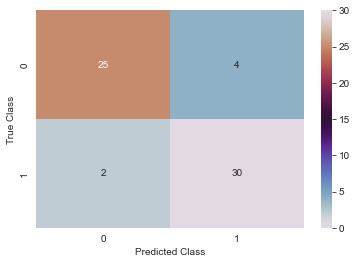

In [123]:
cm = confusion_matrix(y_test,prediction_cplx)
#plt.figure(figsize=(10, 10))
sns.heatmap(cm, annot=True, fmt='g', vmin=0, cbar=True, cmap='twilight')
plt.ylabel('True Class')
plt.xlabel('Predicted Class')

### Performance metrics from confusion matrix

In [124]:
#Performance metrics from confusion matrix 

FP = cm.sum(axis=0) - np.diag(cm) 
FN = cm.sum(axis=1) - np.diag(cm)
TP = np.diag(cm)
TN = cm.sum() - (FP + FN + TP)

FP = FP.astype(float)
FN = FN.astype(float)
TP = TP.astype(float)
TN = TN.astype(float)

# Sensitivity, hit rate, Recall, or true positive rate
TPR = TP/(TP+FN)

# Specificity or true negative rate
TNR = TN/(TN+FP) 

# Precision or positive predictive value
PPV = TP/(TP+FP)

# Negative predictive value
NPV = TN/(TN+FN)

# Fall out or false positive rate
FPR = FP/(FP+TN)

# False negative rate
FNR = FN/(TP+FN)

# False discovery rate
FDR = FP/(TP+FP)


print('Class:',class_label)

print('Specificity:',TNR)
print('Specificity Mean:',TNR.mean())

print()

print('Class:',class_label)

print('Recall/Sensitivity:',TPR)
print('Recall/Sensitivity Mean:',TPR.mean())

print()

print('Class:',class_label)

print('Precision:',PPV)
print('Precision Mean:',PPV.mean())

print()

print('Class:',class_label)

print('False Positive Rate:',FPR)
print('False Positive Rate Mean:',FPR.mean())

print()

print('Class:',class_label)

print('False Negative Rate:',FNR)
print('False Negative Rate Mean:',FNR.mean())

print()

print('Class:',class_label)

print('False Discovery Rate:',FDR)
print('False Discovery Rate Mean:',FDR.mean())

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
Specificity: [0.9375     0.86206897]
Specificity Mean: 0.8997844827586207

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
Recall/Sensitivity: [0.86206897 0.9375    ]
Recall/Sensitivity Mean: 0.8997844827586207

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
Precision: [0.92592593 0.88235294]
Precision Mean: 0.9041394335511983

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
False Positive Rate: [0.0625     0.13793103]
False Positive Rate Mean: 0.10021551724137931

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
False Negative Rate: [0.13793103 0.0625    ]
False Negative Rate Mean: 0.10021551724137931

Class: {0: 'No Heart Disease', 1: 'Heart Disease'}
False Discovery Rate: [0.07407407 0.11764706]
False Discovery Rate Mean: 0.09586056644880174


### ROC Score


Heart Disease: ROC-AUC Score: = 0.949



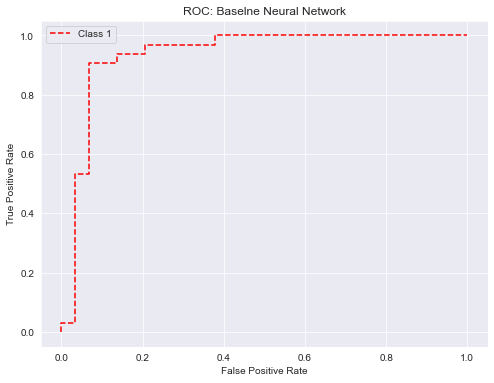

In [125]:
#ROC Plot
#from sklearn.multiclass import OneVsRestClassifier
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

prediction_cplx = tuned_model.predict_proba(X_test)

# roc curve for classes
fpr = {}
tpr = {}
thresh ={}

n_class = 2

for i in range(n_class):    
    fpr[i], tpr[i], thresh[i] = roc_curve(y_test, prediction_cplx[:,-1], pos_label=i)

#y_score = classifier.fit(X_train, y_train).decision_function(X_test)
#See machinelearningmastery
# Compute micro-average ROC curve and ROC area
#fpr["micro"], tpr["micro"], _ = roc_curve(y_test.ravel(), y_score.ravel())
#roc_auc["micro"] = auc(fpr["micro"], tpr["micro"])  
ns_probs=[0 for _ in range(len(y_test))]
lr_probs=model.predict_proba(X_test)
lr_probs=lr_probs[:,-1]
ns_auc=roc_auc_score(y_test,ns_probs)
lr_auc=roc_auc_score(y_test,lr_probs)
#print('No Heart Disease:ROC AUC=%.3f'%(ns_auc))
print()
print('Heart Disease: ROC-AUC Score: = %.3f'%(lr_auc))
print()
    
# plotting
plt.figure(figsize=(8, 6))
#plt.plot(fpr[0], tpr[0], linestyle='--',color='steelblue', label='Class 0')
plt.plot(fpr[1], tpr[1], linestyle='--',color='red', label='Class 1')
#plt.plot(fpr[2], tpr[2], linestyle='--',color='blue', label='Class 2 vs Rest')
#plt.plot(fpr[3], tpr[3], linestyle='--',color='red', label='Class 3 vs Rest')
#plt.plot(fpr[4], tpr[4], linestyle='--',color='black', label='Class 4 vs Rest')
#plt.plot(fpr[5], tpr[5], linestyle='--',color='purple', label='Class 5 vs Rest')
#plt.plot(fpr[6], tpr[6], linestyle='--',color='yellow', label='Class 6 vs Rest')
plt.title('ROC: Baselne Neural Network')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='best')
#plt.savefig('RF ROC',dpi=300)

## Predictions and Confidences
 **Classes and Probabilities**

In [126]:
# Classes and Probabilities

prediction_probability = tuned_model.predict_proba(X_test)
prediction_cplx = tuned_model.predict_classes(X_test)

class_df = pd.DataFrame(prediction_cplx.round(3),columns=['Predicted class'])
proba_df = pd.DataFrame(prediction_probability.round(3),columns=['No heart disease','Heart disease'])

#pred_list = pd.concat(['frame','target_rs'],axis= 1)


predictions_df = pd.concat([proba_df,class_df ], axis=1)
predictions_df.head()

,No heart disease,Heart disease,Predicted class
0,0.922,0.078,0
1,0.066,0.934,1
2,0.013,0.987,1
3,0.998,0.002,0
4,0.005,0.995,1


### Index of incorrect predictions

In [127]:
# Incorrect predictions

incorrects = np.nonzero(prediction_cplx.reshape((-1,)) != y_test)
incorrects

(array([ 1, 22, 25, 26, 30, 33], dtype=int64),)

### Jaccard similarity coefficient

In [128]:
# Jaccard similarity coefficient
# Predicted class compared with actual class

jaccard = jaccard_score(y_test, prediction_cplx, average = None)#prediction_probability

jaccard_df = pd.DataFrame(jaccard,columns=['Jaccard score'])
jaccard_df

,Jaccard score
0,0.806452
1,0.833333


### Confidence interval

The confidence interval is a likelihood over a range. The true model skill may lie outside of this range.
 
**Commonly used number of standard deviations from the Gaussian distribution and their corresponding significance level are as follows:**

* 1.64 (90%)
* 1.96 (95%)
* 2.33 (98%)
* 2.58 (99%)

#### Using model error

In [129]:
# 95% confidence interval
# calculated radius of the confidence interval using model error

# where: interval = z * sqrt( (error * (1 - error)) / n)

interval = 1.96 * sqrt( (0.10 * (1 - .10)) / 61)
print('Classification error interval: %.3f' % interval)

Classification error interval: 0.075


* The classification error of the model is 10% +/- 8%
* The true classification error of the model on unseen data is likely between 2% and 18%
 
 **The true model skill may lie outside of this range.**

### Upper and lower bounds of model accuracy

In [130]:
# Upper and lower bounds of model accuracy

# from statsmodels.stats.proportion import proportion_confint

lower, upper = proportion_confint(55, 61, 0.05)

print('Lower Bounds of Accuracy:%.3f ' % lower)
print('Upper Bounds of Accuracy:%.3f ' %upper)

Lower Bounds of Accuracy:0.827 
Upper Bounds of Accuracy:0.976 


* The true classification accuracy of the model on unseen data is likely between 83% and 98%.
 

**True model skill may lie outside of this range**

### Save the new model

In [131]:
tuned_model.save('HeartDisSM_tuned.h5')

In [132]:
# Sanity check

reconstructed_model = keras.models.load_model('HeartDisSM_tuned.h5')
reconstructed_model.summary()

Model: "sequential_80"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_313 (Dense)            (None, 72)                1728      
_________________________________________________________________
dense_314 (Dense)            (None, 64)                4672      
_________________________________________________________________
dense_315 (Dense)            (None, 24)                1560      
_________________________________________________________________
dense_316 (Dense)            (None, 2)                 50        
Total params: 8,010
Trainable params: 8,010
Non-trainable params: 0
_________________________________________________________________


In [133]:
!ls -ltr HeartDisSM_*

-rw-r--r-- 1 celie celie 101048 Mar  3 13:38 HeartDisSM_tuned.h5


# Sample prediction and probabilities

In [136]:
# Sample prediction and probabilities

prediction_probability = reconstructed_model.predict_proba(X_test)
prediction_cplx = reconstructed_model.predict_classes(X_test)

print()
print('The probabilities of the sample are:',prediction_probability[4].round(3))
print()
print('The predicted class of the sample is:', prediction_cplx[4])
print()
print('Index of incorrects:',incorrects)

predictions_df.head()


The probabilities of the sample are: [0.005 0.995]

The predicted class of the sample is: 1

Index of incorrects: (array([ 1, 22, 25, 26, 30, 33], dtype=int64),)


,No heart disease,Heart disease,Predicted class
0,0.922,0.078,0
1,0.066,0.934,1
2,0.013,0.987,1
3,0.998,0.002,0
4,0.005,0.995,1
